#**Redes Neuronales aplicado a la astrofísica: Predicción de manchas solares.**

##Moreno Santiago José Miguel
##Zamora Flores Guillermo Armando
##Moran Alvarado Luis Andrés

Proyecto desarrollado en una estancia del Programa Delfín, donde se construyó un modelo de red neuronal LSTM para predecir manchas solares.

Los datos fueron recopilados de [SIDC](https://www.sidc.be/SILSO/datafiles).

#Carga y Visualización de datos

In [ ]:
#Montar drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Importamos librerías
import pandas as pd
import plotly.express as px

# Carga el archivo CSV en un DataFrame
Dataframe = pd.read_csv('/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Set_de_datos_manchas_solares.csv')
Dataframe.head()

,No. de manchas solares,Fecha
0,0,1823-01-01
1,0,1823-01-02
2,0,1823-01-03
3,0,1823-01-04
4,0,1823-01-05


In [ ]:
#Establecer la columna de fecha como el índice del DataFrame:
Dataframe.set_index('Fecha', inplace=True)

Dataframe.index = pd.to_datetime(Dataframe.index)

# Verifica que el índice se ha convertido correctamente
print(Dataframe.index)

DatetimeIndex(['1823-01-01', '1823-01-02', '1823-01-03', '1823-01-04',
               '1823-01-05', '1823-01-06', '1823-01-07', '1823-01-08',
               '1823-01-09', '1823-01-10',
               ...
               '2024-05-22', '2024-05-23', '2024-05-24', '2024-05-25',
               '2024-05-26', '2024-05-27', '2024-05-28', '2024-05-29',
               '2024-05-30', '2024-05-31'],
              dtype='datetime64[ns]', name='Fecha', length=73566, freq=None)


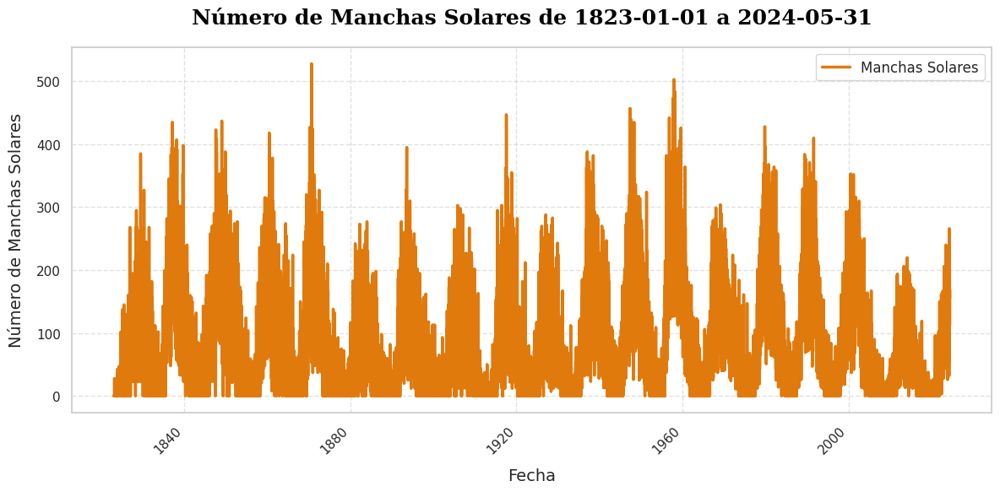

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rcParams

# Cambiar el tipo de letra globalmente (para toda la gráfica)
rcParams['font.family'] = 'sans-serif'  # Puedes probar con 'serif', 'sans-serif', o fuentes básicas como 'Arial'

# Aplicar un estilo más elegante
sns.set(style="whitegrid")

# Crear la figura
plt.figure(figsize=(12, 6))

# Graficar los datos con una línea roja
sns.lineplot(x=Dataframe.index, y=Dataframe['No. de manchas solares'], label='Manchas Solares',
             color="#e17a0d", linewidth=2.5)

# Personalizar el título principal con el tipo de letra que prefieras y color negro
plt.title("Número de Manchas Solares de 1823-01-01 a 2024-05-31",
          fontsize=18,
          fontweight='bold',
          pad=20,
          fontdict={'fontname': 'serif', 'color': 'black'})  # Cambiar 'serif' por una fuente más estándar

# Personalizar los ejes
plt.xlabel('Fecha', fontsize=14, labelpad=10)
plt.ylabel('Número de Manchas Solares', fontsize=14, labelpad=10)

# Rotar las etiquetas del eje X si hay muchas fechas
plt.xticks(rotation=45, ha='right')

# Personalizar la cuadrícula
plt.grid(True, linestyle='--', alpha=0.6)

# Leyenda
plt.legend(loc='upper right', fontsize=12)

# Ajustar márgenes
plt.tight_layout()

# Mostrar la gráfica
plt.show()


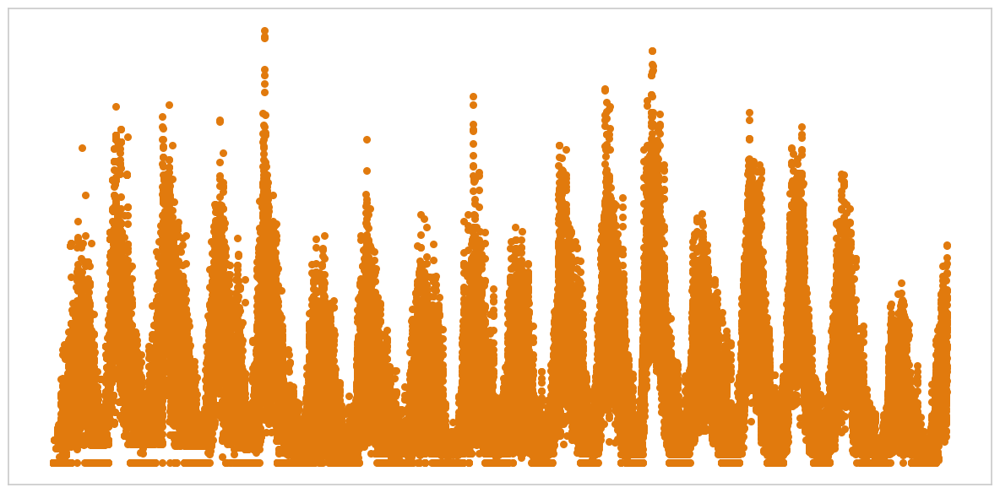

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rcParams

# Cambiar el tipo de letra globalmente (para toda la gráfica)
rcParams['font.family'] = 'sans-serif'

# Aplicar un estilo más elegante
sns.set(style="whitegrid")

# Crear la figura
plt.figure(figsize=(12, 6))

# Graficar los datos como un gráfico de dispersión (scatter plot)
plt.scatter(Dataframe.index, Dataframe['No. de manchas solares'],
            color="#e17a0d", s=30)  # 's' es el tamaño de los puntos

# Remover etiquetas de los ejes y título
plt.xlabel('')
plt.ylabel('')
plt.title('')

# Ocultar las marcas del eje X e Y
plt.xticks([])
plt.yticks([])

# Personalizar la cuadrícula
plt.grid(True, linestyle='--', alpha=0.6)

# Ajustar márgenes
plt.tight_layout()

# Mostrar la gráfica
plt.show()


#Instalación de Optuna

In [ ]:
!pip install optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.1/380.1 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.0/233.0 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 4.2 MB/s eta 0:00:00


In [ ]:
!pip install mlflow --ignore-installed blinker --quiet


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 25.8/25.8 MB 48.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 14.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.9/97.9 kB 13.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.8/147.8 kB 19.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 27.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.2/128.2 kB 18.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 16.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.3/8.3 MB 98.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 79.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.9/59.9 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.0/107.0 kB 16.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.0/54.0 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━

In [ ]:
REPO_NAME= "Ciclo_solar"
REPO_OWNER= "chichastark14"
USER_NAME = "chichastark14"

import mlflow
import os
from getpass import getpass

os.environ['MLFLOW_TRACKING_USERNAME'] = USER_NAME
os.environ['MLFLOW_TRACKING_PASSWORD'] = getpass('Enter your DAGsHub access token or password: ')

mlflow.set_tracking_uri(f'https://dagshub.com/{REPO_OWNER}/{REPO_NAME}.mlflow')

Enter your DAGsHub access token or password: ··········


#Multiples pruebas Optuna

Optuna es una biblioteca de optimización de hiperparámetros que permite buscar de manera eficiente los mejores valores para mejorar el rendimiento de modelos de machine learning.  

En este proyecto, **Optuna** se utilizó para encontrar la mejor configuración de la red LSTM, ajustando parámetros como el número de neuronas, la tasa de aprendizaje y el dropout, optimizando así la precisión de la predicción de manchas solares.

In [ ]:
pip install optuna-integration

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.4/93.4 kB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.1/380.1 kB 19.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.0/233.0 kB 32.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 12.8 MB/s eta 0:00:00


###Preprocesamiento de los datos

In [ ]:
#Importar librerías
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import SimpleRNN, Dense, TimeDistributed, LSTM, Dropout
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras import models, layers, regularizers, optimizers
import os
from google.colab import files
from tensorflow.keras.callbacks import ModelCheckpoint, Callback, EarlyStopping
from keras.preprocessing.sequence import TimeseriesGenerator
import optuna
from optuna import Trial
# Importar BatchNormalization desde tf.keras.layers
from tensorflow.keras.layers import BatchNormalization
from optuna.integration import TFKerasPruningCallback
from sklearn.metrics import mean_squared_error

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

In [ ]:
# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

# Función para definir y crear el modelo
def create_model(trial, seq_length):
    model = models.Sequential()
    n_lstm_layers = trial.suggest_int("n_lstm_layers", 1, 3)
    for i in range(n_lstm_layers):
        units = trial.suggest_int(f"lstm_units_{i}", 10, 500)
        return_sequences = True if i < n_lstm_layers - 1 else False
        if i == 0:
            model.add(layers.LSTM(units=units, return_sequences=return_sequences, input_shape=(seq_length, 1)))
        else:
            model.add(layers.LSTM(units=units, return_sequences=return_sequences))

        dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)
        if i < n_lstm_layers - 1:
            model.add(layers.Dropout(dropout_rate))

    model.add(layers.Flatten())

    n_dense_layers = trial.suggest_int("n_dense_layers", 1, 3)
    for i in range(n_dense_layers):
        units = trial.suggest_int(f"dense_units_{i}", 32, 256)
        model.add(layers.Dense(units, activation='relu'))

    model.add(layers.Dense(1))

    return model

###Función objetivo para Optuna

In [ ]:
# Función objetivo para Optuna
def objective(trial):
    # Sugerir la longitud de secuencia para este ensayo
    seq_length = trial.suggest_int("seq_length", 50, 4000)

    # Crear datos de entrenamiento y prueba
    X_train, y_train = create_sequence_data(train_data, seq_length)
    X_test, y_test = create_sequence_data(test_data, seq_length)

    # Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
    X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
    X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

    # Crear y compilar el modelo
    model = create_model(trial, seq_length)
    lr = trial.suggest_float("lr", 1e-5, 1e-3, log=True)
    optimizer_options = ["adam", "rmsprop"]
    optimizer_selected = trial.suggest_categorical("optimizer", optimizer_options)

    if optimizer_selected == "adam":
        optimizer = tf.keras.optimizers.Adam(learning_rate=lr)
    elif optimizer_selected == "rmsprop":
        optimizer = tf.keras.optimizers.RMSprop(learning_rate=lr)

    batch_size = trial.suggest_int("batch_size", 16, 256)
    model.compile(optimizer=optimizer,
                  loss=tf.keras.losses.Huber(),
                  metrics=["mae"])

    # Configurar callbacks para guardar el mejor modelo y detener temprano
    filepath = "best_model.hdf5"
    checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
    earlystop = EarlyStopping(monitor='val_loss', mode='min', restore_best_weights=True, patience=10, verbose=1)

    # Iniciar MLflow y el registro del experimento
    mlflow.tensorflow.autolog()
    trial_number = trial.number
    experiment_name = f"Experiment_{trial_number}"
    mlflow.set_experiment(experiment_name=experiment_name)
    mlflow.start_run(nested=True)

    # Entrenar el modelo
    model.fit(X_train, y_train, epochs=10, batch_size=batch_size, verbose=0,
              validation_split=0.2, callbacks=[checkpoint, earlystop])

    # Evaluar el modelo en datos de prueba
    loss, mae = model.evaluate(X_test, y_test, verbose=0)

    # Registrar métricas en MLflow
    mlflow.log_metric("loss", loss)
    mlflow.log_metric("mae", mae)

    return loss

# Crear estudio de Optuna y optimizar
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=30)

[I 2024-07-09 20:52:22,101] A new study created in memory with name: no-name-abf520c9-fc64-4b81-941a-d5995f155fd6
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)



Epoch 1: val_loss improved from inf to 0.00302, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss improved from 0.00302 to 0.00209, saving model to best_model.hdf5

Epoch 3: val_loss improved from 0.00209 to 0.00160, saving model to best_model.hdf5

Epoch 4: val_loss improved from 0.00160 to 0.00145, saving model to best_model.hdf5

Epoch 5: val_loss improved from 0.00145 to 0.00118, saving model to best_model.hdf5

Epoch 6: val_loss improved from 0.00118 to 0.00114, saving model to best_model.hdf5

Epoch 7: val_loss improved from 0.00114 to 0.00095, saving model to best_model.hdf5

Epoch 8: val_loss improved from 0.00095 to 0.00089, saving model to best_model.hdf5

Epoch 9: val_loss improved from 0.00089 to 0.00083, saving model to best_model.hdf5

Epoch 10: val_loss did not improve from 0.00083
1/1 [==============================] - 1s 1s/step


2024/07/09 21:07:00 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/usr/local/lib/python3.10/dist-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils."
[I 2024-07-09 21:08:03,033] Trial 0 finished with value: 0.0006642269436269999 and parameters: {'seq_length': 1655, 'n_lstm_layers': 3, 'lstm_units_0': 292, 'dropout_0': 0.2504708736335935, 'lstm_units_1': 225, 'dropout_1': 0.4148710133229181, 'lstm_units_2': 136, 'dropout_2': 0.40406270590094917, 'n_dense_layers': 1, 'dense_units_0': 203, 'lr': 6.691717620444556e-05, 'optimizer': 'adam', 'batch_size': 125}. Best is trial 0 with value: 0.0006642269436269999.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)



Epoch 1: val_loss improved from inf to 0.00839, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss improved from 0.00839 to 0.00556, saving model to best_model.hdf5

Epoch 3: val_loss improved from 0.00556 to 0.00387, saving model to best_model.hdf5

Epoch 4: val_loss improved from 0.00387 to 0.00309, saving model to best_model.hdf5

Epoch 5: val_loss improved from 0.00309 to 0.00301, saving model to best_model.hdf5

Epoch 6: val_loss improved from 0.00301 to 0.00300, saving model to best_model.hdf5

Epoch 7: val_loss improved from 0.00300 to 0.00297, saving model to best_model.hdf5

Epoch 8: val_loss improved from 0.00297 to 0.00296, saving model to best_model.hdf5

Epoch 9: val_loss improved from 0.00296 to 0.00294, saving model to best_model.hdf5

Epoch 10: val_loss improved from 0.00294 to 0.00292, saving model to best_model.hdf5
1/1 [==============================] - 1s 708ms/step


[I 2024-07-09 21:24:33,538] Trial 1 finished with value: 0.0027835729997605085 and parameters: {'seq_length': 2228, 'n_lstm_layers': 2, 'lstm_units_0': 422, 'dropout_0': 0.674769101934275, 'lstm_units_1': 70, 'dropout_1': 0.6196772627715862, 'n_dense_layers': 2, 'dense_units_0': 34, 'dense_units_1': 240, 'lr': 1.3923820169883657e-05, 'optimizer': 'rmsprop', 'batch_size': 147}. Best is trial 0 with value: 0.0006642269436269999.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)



Epoch 1: val_loss improved from inf to 0.00347, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss did not improve from 0.00347

Epoch 3: val_loss did not improve from 0.00347

Epoch 4: val_loss improved from 0.00347 to 0.00231, saving model to best_model.hdf5

Epoch 5: val_loss did not improve from 0.00231

Epoch 6: val_loss did not improve from 0.00231

Epoch 7: val_loss improved from 0.00231 to 0.00199, saving model to best_model.hdf5

Epoch 8: val_loss improved from 0.00199 to 0.00155, saving model to best_model.hdf5

Epoch 9: val_loss did not improve from 0.00155

Epoch 10: val_loss did not improve from 0.00155
1/1 [==============================] - 1s 679ms/step


[I 2024-07-09 21:30:55,854] Trial 2 finished with value: 0.0024421527050435543 and parameters: {'seq_length': 1349, 'n_lstm_layers': 2, 'lstm_units_0': 204, 'dropout_0': 0.3705822471638498, 'lstm_units_1': 142, 'dropout_1': 0.22639463830880277, 'n_dense_layers': 3, 'dense_units_0': 236, 'dense_units_1': 62, 'dense_units_2': 212, 'lr': 0.00015496597651445124, 'optimizer': 'rmsprop', 'batch_size': 172}. Best is trial 0 with value: 0.0006642269436269999.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)



Epoch 1: val_loss improved from inf to 0.00330, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss improved from 0.00330 to 0.00316, saving model to best_model.hdf5

Epoch 3: val_loss improved from 0.00316 to 0.00296, saving model to best_model.hdf5

Epoch 4: val_loss improved from 0.00296 to 0.00266, saving model to best_model.hdf5

Epoch 5: val_loss improved from 0.00266 to 0.00234, saving model to best_model.hdf5

Epoch 6: val_loss improved from 0.00234 to 0.00198, saving model to best_model.hdf5

Epoch 7: val_loss improved from 0.00198 to 0.00179, saving model to best_model.hdf5

Epoch 8: val_loss improved from 0.00179 to 0.00177, saving model to best_model.hdf5

Epoch 9: val_loss improved from 0.00177 to 0.00161, saving model to best_model.hdf5

Epoch 10: val_loss improved from 0.00161 to 0.00150, saving model to best_model.hdf5
1/1 [==============================] - 1s 974ms/step


[I 2024-07-09 21:36:33,214] Trial 3 finished with value: 0.0014223090838640928 and parameters: {'seq_length': 848, 'n_lstm_layers': 3, 'lstm_units_0': 72, 'dropout_0': 0.6299620056097992, 'lstm_units_1': 203, 'dropout_1': 0.3075228996668029, 'lstm_units_2': 181, 'dropout_2': 0.5982698448070696, 'n_dense_layers': 2, 'dense_units_0': 141, 'dense_units_1': 114, 'lr': 5.171995910679242e-05, 'optimizer': 'adam', 'batch_size': 252}. Best is trial 0 with value: 0.0006642269436269999.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)



Epoch 1: val_loss improved from inf to 0.00634, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss improved from 0.00634 to 0.00435, saving model to best_model.hdf5

Epoch 3: val_loss improved from 0.00435 to 0.00321, saving model to best_model.hdf5

Epoch 4: val_loss improved from 0.00321 to 0.00298, saving model to best_model.hdf5

Epoch 5: val_loss improved from 0.00298 to 0.00295, saving model to best_model.hdf5

Epoch 6: val_loss improved from 0.00295 to 0.00294, saving model to best_model.hdf5

Epoch 7: val_loss improved from 0.00294 to 0.00292, saving model to best_model.hdf5

Epoch 8: val_loss improved from 0.00292 to 0.00290, saving model to best_model.hdf5

Epoch 9: val_loss improved from 0.00290 to 0.00289, saving model to best_model.hdf5

Epoch 10: val_loss improved from 0.00289 to 0.00286, saving model to best_model.hdf5


1/1 [==============================] - 1s 688ms/step


[I 2024-07-09 21:50:31,882] Trial 4 finished with value: 0.002759378170594573 and parameters: {'seq_length': 1893, 'n_lstm_layers': 2, 'lstm_units_0': 391, 'dropout_0': 0.272457956483938, 'lstm_units_1': 63, 'dropout_1': 0.3345531302260185, 'n_dense_layers': 2, 'dense_units_0': 239, 'dense_units_1': 98, 'lr': 1.2868137807350673e-05, 'optimizer': 'rmsprop', 'batch_size': 129}. Best is trial 0 with value: 0.0006642269436269999.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)
2024/07/09 21:50:37 INFO mlflow.tracking.fluent: Experiment with name 'Experiment_5' does not exist. Creating a new experiment.



Epoch 1: val_loss improved from inf to 0.00244, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss improved from 0.00244 to 0.00199, saving model to best_model.hdf5

Epoch 3: val_loss improved from 0.00199 to 0.00167, saving model to best_model.hdf5

Epoch 4: val_loss improved from 0.00167 to 0.00143, saving model to best_model.hdf5

Epoch 5: val_loss improved from 0.00143 to 0.00124, saving model to best_model.hdf5

Epoch 6: val_loss improved from 0.00124 to 0.00112, saving model to best_model.hdf5

Epoch 7: val_loss improved from 0.00112 to 0.00105, saving model to best_model.hdf5

Epoch 8: val_loss improved from 0.00105 to 0.00097, saving model to best_model.hdf5

Epoch 9: val_loss improved from 0.00097 to 0.00093, saving model to best_model.hdf5

Epoch 10: val_loss improved from 0.00093 to 0.00088, saving model to best_model.hdf5


1/1 [==============================] - 0s 379ms/step


[I 2024-07-09 21:54:20,920] Trial 5 finished with value: 0.0006906907074153423 and parameters: {'seq_length': 2857, 'n_lstm_layers': 1, 'lstm_units_0': 83, 'dropout_0': 0.4519765045205246, 'n_dense_layers': 1, 'dense_units_0': 156, 'lr': 5.373537494807675e-05, 'optimizer': 'adam', 'batch_size': 202}. Best is trial 0 with value: 0.0006642269436269999.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)
2024/07/09 21:54:26 INFO mlflow.tracking.fluent: Experiment with name 'Experiment_6' does not exist. Creating a new experiment.



Epoch 1: val_loss improved from inf to 0.00094, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss improved from 0.00094 to 0.00078, saving model to best_model.hdf5

Epoch 3: val_loss improved from 0.00078 to 0.00076, saving model to best_model.hdf5

Epoch 4: val_loss did not improve from 0.00076

Epoch 5: val_loss did not improve from 0.00076

Epoch 6: val_loss did not improve from 0.00076

Epoch 7: val_loss did not improve from 0.00076

Epoch 8: val_loss improved from 0.00076 to 0.00074, saving model to best_model.hdf5

Epoch 9: val_loss did not improve from 0.00074

Epoch 10: val_loss improved from 0.00074 to 0.00073, saving model to best_model.hdf5
1/1 [==============================] - 2s 2s/step


[I 2024-07-09 22:20:29,787] Trial 6 finished with value: 0.0005021159304305911 and parameters: {'seq_length': 3633, 'n_lstm_layers': 2, 'lstm_units_0': 430, 'dropout_0': 0.5515225976651156, 'lstm_units_1': 196, 'dropout_1': 0.32597817626347336, 'n_dense_layers': 2, 'dense_units_0': 164, 'dense_units_1': 133, 'lr': 0.0007986415268364704, 'optimizer': 'adam', 'batch_size': 220}. Best is trial 6 with value: 0.0005021159304305911.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)
2024/07/09 22:20:35 INFO mlflow.tracking.fluent: Experiment with name 'Experiment_7' does not exist. Creating a new experiment.



Epoch 1: val_loss improved from inf to 0.00184, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss improved from 0.00184 to 0.00130, saving model to best_model.hdf5

Epoch 3: val_loss improved from 0.00130 to 0.00099, saving model to best_model.hdf5

Epoch 4: val_loss improved from 0.00099 to 0.00086, saving model to best_model.hdf5

Epoch 5: val_loss improved from 0.00086 to 0.00079, saving model to best_model.hdf5

Epoch 6: val_loss did not improve from 0.00079

Epoch 7: val_loss improved from 0.00079 to 0.00076, saving model to best_model.hdf5

Epoch 8: val_loss did not improve from 0.00076

Epoch 9: val_loss improved from 0.00076 to 0.00075, saving model to best_model.hdf5

Epoch 10: val_loss did not improve from 0.00075
1/1 [==============================] - 1s 1s/step


[I 2024-07-09 23:46:52,133] Trial 7 finished with value: 0.0006562505150213838 and parameters: {'seq_length': 3959, 'n_lstm_layers': 3, 'lstm_units_0': 440, 'dropout_0': 0.25062300373644525, 'lstm_units_1': 307, 'dropout_1': 0.215251742585646, 'lstm_units_2': 201, 'dropout_2': 0.22299991362460267, 'n_dense_layers': 1, 'dense_units_0': 94, 'lr': 3.8474510102676005e-05, 'optimizer': 'adam', 'batch_size': 27}. Best is trial 6 with value: 0.0005021159304305911.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)
2024/07/09 23:46:57 INFO mlflow.tracking.fluent: Experiment with name 'Experiment_8' does not exist. Creating a new experiment.



Epoch 1: val_loss improved from inf to 0.01298, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss improved from 0.01298 to 0.00797, saving model to best_model.hdf5

Epoch 3: val_loss improved from 0.00797 to 0.00561, saving model to best_model.hdf5

Epoch 4: val_loss improved from 0.00561 to 0.00488, saving model to best_model.hdf5

Epoch 5: val_loss improved from 0.00488 to 0.00420, saving model to best_model.hdf5

Epoch 6: val_loss improved from 0.00420 to 0.00363, saving model to best_model.hdf5

Epoch 7: val_loss improved from 0.00363 to 0.00321, saving model to best_model.hdf5

Epoch 8: val_loss improved from 0.00321 to 0.00301, saving model to best_model.hdf5

Epoch 9: val_loss improved from 0.00301 to 0.00294, saving model to best_model.hdf5

Epoch 10: val_loss improved from 0.00294 to 0.00293, saving model to best_model.hdf5
1/1 [==============================] - 1s 686ms/step


[I 2024-07-09 23:59:59,096] Trial 8 finished with value: 0.0028686400037258863 and parameters: {'seq_length': 1714, 'n_lstm_layers': 2, 'lstm_units_0': 395, 'dropout_0': 0.42235039369113725, 'lstm_units_1': 226, 'dropout_1': 0.2817606733503408, 'n_dense_layers': 2, 'dense_units_0': 118, 'dense_units_1': 66, 'lr': 1.083795257384102e-05, 'optimizer': 'rmsprop', 'batch_size': 241}. Best is trial 6 with value: 0.0005021159304305911.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)
2024/07/10 00:00:04 INFO mlflow.tracking.fluent: Experiment with name 'Experiment_9' does not exist. Creating a new experiment.



Epoch 1: val_loss improved from inf to 0.00227, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss improved from 0.00227 to 0.00199, saving model to best_model.hdf5

Epoch 3: val_loss improved from 0.00199 to 0.00180, saving model to best_model.hdf5

Epoch 4: val_loss improved from 0.00180 to 0.00165, saving model to best_model.hdf5

Epoch 5: val_loss improved from 0.00165 to 0.00154, saving model to best_model.hdf5

Epoch 6: val_loss improved from 0.00154 to 0.00144, saving model to best_model.hdf5

Epoch 7: val_loss improved from 0.00144 to 0.00135, saving model to best_model.hdf5

Epoch 8: val_loss improved from 0.00135 to 0.00128, saving model to best_model.hdf5

Epoch 9: val_loss improved from 0.00128 to 0.00121, saving model to best_model.hdf5

Epoch 10: val_loss improved from 0.00121 to 0.00115, saving model to best_model.hdf5
1/1 [==============================] - 0s 396ms/step


[I 2024-07-10 00:21:19,348] Trial 9 finished with value: 0.0009881427977234125 and parameters: {'seq_length': 3733, 'n_lstm_layers': 1, 'lstm_units_0': 331, 'dropout_0': 0.13635886222783491, 'n_dense_layers': 1, 'dense_units_0': 61, 'lr': 2.395156944751088e-05, 'optimizer': 'rmsprop', 'batch_size': 38}. Best is trial 6 with value: 0.0005021159304305911.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)
2024/07/10 00:21:24 INFO mlflow.tracking.fluent: Experiment with name 'Experiment_10' does not exist. Creating a new experiment.



Epoch 1: val_loss improved from inf to 0.00073, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss did not improve from 0.00073

Epoch 3: val_loss improved from 0.00073 to 0.00071, saving model to best_model.hdf5

Epoch 4: val_loss did not improve from 0.00071

Epoch 5: val_loss did not improve from 0.00071

Epoch 6: val_loss did not improve from 0.00071

Epoch 7: val_loss improved from 0.00071 to 0.00071, saving model to best_model.hdf5

Epoch 8: val_loss did not improve from 0.00071

Epoch 9: val_loss did not improve from 0.00071

Epoch 10: val_loss did not improve from 0.00071
1/1 [==============================] - 0s 390ms/step


[I 2024-07-10 00:40:17,479] Trial 10 finished with value: 0.0005293932044878602 and parameters: {'seq_length': 2975, 'n_lstm_layers': 1, 'lstm_units_0': 492, 'dropout_0': 0.5485598559703065, 'n_dense_layers': 3, 'dense_units_0': 193, 'dense_units_1': 185, 'dense_units_2': 37, 'lr': 0.0009517499039984517, 'optimizer': 'adam', 'batch_size': 85}. Best is trial 6 with value: 0.0005021159304305911.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)
2024/07/10 00:40:23 INFO mlflow.tracking.fluent: Experiment with name 'Experiment_11' does not exist. Creating a new experiment.



Epoch 1: val_loss improved from inf to 0.00078, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss improved from 0.00078 to 0.00076, saving model to best_model.hdf5

Epoch 3: val_loss did not improve from 0.00076

Epoch 4: val_loss did not improve from 0.00076

Epoch 5: val_loss improved from 0.00076 to 0.00075, saving model to best_model.hdf5

Epoch 6: val_loss did not improve from 0.00075

Epoch 7: val_loss did not improve from 0.00075

Epoch 8: val_loss did not improve from 0.00075

Epoch 9: val_loss did not improve from 0.00075

Epoch 10: val_loss improved from 0.00075 to 0.00074, saving model to best_model.hdf5
1/1 [==============================] - 0s 406ms/step


[I 2024-07-10 00:58:32,054] Trial 11 finished with value: 0.0004945165710523725 and parameters: {'seq_length': 2921, 'n_lstm_layers': 1, 'lstm_units_0': 499, 'dropout_0': 0.5330500043357079, 'n_dense_layers': 3, 'dense_units_0': 184, 'dense_units_1': 193, 'dense_units_2': 55, 'lr': 0.0009157856286854513, 'optimizer': 'adam', 'batch_size': 77}. Best is trial 11 with value: 0.0004945165710523725.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)
2024/07/10 00:58:37 INFO mlflow.tracking.fluent: Experiment with name 'Experiment_12' does not exist. Creating a new experiment.



Epoch 1: val_loss improved from inf to 0.00074, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss did not improve from 0.00074

Epoch 3: val_loss improved from 0.00074 to 0.00072, saving model to best_model.hdf5

Epoch 4: val_loss improved from 0.00072 to 0.00072, saving model to best_model.hdf5

Epoch 5: val_loss did not improve from 0.00072

Epoch 6: val_loss did not improve from 0.00072

Epoch 7: val_loss did not improve from 0.00072

Epoch 8: val_loss did not improve from 0.00072

Epoch 9: val_loss did not improve from 0.00072

Epoch 10: val_loss did not improve from 0.00072
1/1 [==============================] - 0s 397ms/step


[I 2024-07-10 01:07:56,209] Trial 12 finished with value: 0.0005877558724023402 and parameters: {'seq_length': 3197, 'n_lstm_layers': 1, 'lstm_units_0': 193, 'dropout_0': 0.5447713374242567, 'n_dense_layers': 3, 'dense_units_0': 184, 'dense_units_1': 173, 'dense_units_2': 56, 'lr': 0.0009986996798420785, 'optimizer': 'adam', 'batch_size': 80}. Best is trial 11 with value: 0.0004945165710523725.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)
2024/07/10 01:08:01 INFO mlflow.tracking.fluent: Experiment with name 'Experiment_13' does not exist. Creating a new experiment.



Epoch 1: val_loss improved from inf to 0.00073, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss did not improve from 0.00073

Epoch 3: val_loss did not improve from 0.00073

Epoch 4: val_loss did not improve from 0.00073

Epoch 5: val_loss improved from 0.00073 to 0.00071, saving model to best_model.hdf5

Epoch 6: val_loss did not improve from 0.00071

Epoch 7: val_loss did not improve from 0.00071

Epoch 8: val_loss improved from 0.00071 to 0.00071, saving model to best_model.hdf5

Epoch 9: val_loss did not improve from 0.00071

Epoch 10: val_loss did not improve from 0.00071
1/1 [==============================] - 1s 1s/step


[I 2024-07-10 01:23:42,472] Trial 13 finished with value: 0.0004889354459010065 and parameters: {'seq_length': 2543, 'n_lstm_layers': 1, 'lstm_units_0': 478, 'dropout_0': 0.5398396437538373, 'n_dense_layers': 3, 'dense_units_0': 175, 'dense_units_1': 216, 'dense_units_2': 133, 'lr': 0.0003710652315411262, 'optimizer': 'adam', 'batch_size': 77}. Best is trial 13 with value: 0.0004889354459010065.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)
2024/07/10 01:23:47 INFO mlflow.tracking.fluent: Experiment with name 'Experiment_14' does not exist. Creating a new experiment.



Epoch 1: val_loss improved from inf to 0.00081, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss improved from 0.00081 to 0.00072, saving model to best_model.hdf5

Epoch 3: val_loss did not improve from 0.00072

Epoch 4: val_loss did not improve from 0.00072

Epoch 5: val_loss did not improve from 0.00072

Epoch 6: val_loss did not improve from 0.00072

Epoch 7: val_loss did not improve from 0.00072

Epoch 8: val_loss did not improve from 0.00072

Epoch 9: val_loss did not improve from 0.00072

Epoch 10: val_loss did not improve from 0.00072
1/1 [==============================] - 0s 395ms/step


[I 2024-07-10 01:38:51,193] Trial 14 finished with value: 0.000561756023671478 and parameters: {'seq_length': 2364, 'n_lstm_layers': 1, 'lstm_units_0': 494, 'dropout_0': 0.48902936689452375, 'n_dense_layers': 3, 'dense_units_0': 218, 'dense_units_1': 242, 'dense_units_2': 138, 'lr': 0.00034570463278646446, 'optimizer': 'adam', 'batch_size': 75}. Best is trial 13 with value: 0.0004889354459010065.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)
2024/07/10 01:38:56 INFO mlflow.tracking.fluent: Experiment with name 'Experiment_15' does not exist. Creating a new experiment.



Epoch 1: val_loss improved from inf to 0.00073, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss did not improve from 0.00073

Epoch 3: val_loss did not improve from 0.00073

Epoch 4: val_loss did not improve from 0.00073

Epoch 5: val_loss did not improve from 0.00073

Epoch 6: val_loss did not improve from 0.00073

Epoch 7: val_loss did not improve from 0.00073

Epoch 8: val_loss improved from 0.00073 to 0.00072, saving model to best_model.hdf5

Epoch 9: val_loss improved from 0.00072 to 0.00072, saving model to best_model.hdf5

Epoch 10: val_loss did not improve from 0.00072
1/1 [==============================] - 0s 397ms/step


[I 2024-07-10 01:52:39,572] Trial 15 finished with value: 0.0005377621855586767 and parameters: {'seq_length': 2752, 'n_lstm_layers': 1, 'lstm_units_0': 350, 'dropout_0': 0.6238203716953836, 'n_dense_layers': 3, 'dense_units_0': 120, 'dense_units_1': 203, 'dense_units_2': 123, 'lr': 0.0003549961205777824, 'optimizer': 'adam', 'batch_size': 57}. Best is trial 13 with value: 0.0004889354459010065.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)
2024/07/10 01:52:45 INFO mlflow.tracking.fluent: Experiment with name 'Experiment_16' does not exist. Creating a new experiment.



Epoch 1: val_loss improved from inf to 0.00102, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss improved from 0.00102 to 0.00076, saving model to best_model.hdf5

Epoch 3: val_loss did not improve from 0.00076

Epoch 4: val_loss did not improve from 0.00076

Epoch 5: val_loss did not improve from 0.00076

Epoch 6: val_loss improved from 0.00076 to 0.00073, saving model to best_model.hdf5

Epoch 7: val_loss improved from 0.00073 to 0.00071, saving model to best_model.hdf5

Epoch 8: val_loss did not improve from 0.00071

Epoch 9: val_loss did not improve from 0.00071

Epoch 10: val_loss did not improve from 0.00071
1/1 [==============================] - 0s 401ms/step


[I 2024-07-10 02:06:03,006] Trial 16 finished with value: 0.0005079370457679033 and parameters: {'seq_length': 2413, 'n_lstm_layers': 1, 'lstm_units_0': 498, 'dropout_0': 0.3628880513268631, 'n_dense_layers': 3, 'dense_units_0': 178, 'dense_units_1': 212, 'dense_units_2': 99, 'lr': 0.00041527919575733954, 'optimizer': 'adam', 'batch_size': 113}. Best is trial 13 with value: 0.0004889354459010065.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)
2024/07/10 02:06:08 INFO mlflow.tracking.fluent: Experiment with name 'Experiment_17' does not exist. Creating a new experiment.



Epoch 1: val_loss improved from inf to 0.00083, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss improved from 0.00083 to 0.00076, saving model to best_model.hdf5

Epoch 3: val_loss improved from 0.00076 to 0.00073, saving model to best_model.hdf5

Epoch 4: val_loss improved from 0.00073 to 0.00073, saving model to best_model.hdf5

Epoch 5: val_loss did not improve from 0.00073

Epoch 6: val_loss did not improve from 0.00073

Epoch 7: val_loss improved from 0.00073 to 0.00072, saving model to best_model.hdf5

Epoch 8: val_loss improved from 0.00072 to 0.00072, saving model to best_model.hdf5

Epoch 9: val_loss did not improve from 0.00072

Epoch 10: val_loss did not improve from 0.00072
1/1 [==============================] - 0s 390ms/step


[I 2024-07-10 02:15:06,237] Trial 17 finished with value: 0.000500700727570802 and parameters: {'seq_length': 3324, 'n_lstm_layers': 1, 'lstm_units_0': 209, 'dropout_0': 0.5253833265253709, 'n_dense_layers': 3, 'dense_units_0': 252, 'dense_units_1': 158, 'dense_units_2': 213, 'lr': 0.00017539282289836465, 'optimizer': 'adam', 'batch_size': 100}. Best is trial 13 with value: 0.0004889354459010065.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)
2024/07/10 02:15:11 INFO mlflow.tracking.fluent: Experiment with name 'Experiment_18' does not exist. Creating a new experiment.



Epoch 1: val_loss improved from inf to 0.00092, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss did not improve from 0.00092

Epoch 3: val_loss improved from 0.00092 to 0.00072, saving model to best_model.hdf5

Epoch 4: val_loss did not improve from 0.00072

Epoch 5: val_loss did not improve from 0.00072

Epoch 6: val_loss did not improve from 0.00072

Epoch 7: val_loss did not improve from 0.00072

Epoch 8: val_loss did not improve from 0.00072

Epoch 9: val_loss did not improve from 0.00072

Epoch 10: val_loss did not improve from 0.00072
1/1 [==============================] - 0s 374ms/step


[I 2024-07-10 02:17:22,938] Trial 18 finished with value: 0.000612676958553493 and parameters: {'seq_length': 261, 'n_lstm_layers': 1, 'lstm_units_0': 282, 'dropout_0': 0.6968113293713021, 'n_dense_layers': 3, 'dense_units_0': 212, 'dense_units_1': 217, 'dense_units_2': 85, 'lr': 0.0006289983672347829, 'optimizer': 'adam', 'batch_size': 54}. Best is trial 13 with value: 0.0004889354459010065.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)
2024/07/10 02:17:28 INFO mlflow.tracking.fluent: Experiment with name 'Experiment_19' does not exist. Creating a new experiment.



Epoch 1: val_loss improved from inf to 0.00159, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss improved from 0.00159 to 0.00136, saving model to best_model.hdf5

Epoch 3: val_loss improved from 0.00136 to 0.00112, saving model to best_model.hdf5

Epoch 4: val_loss improved from 0.00112 to 0.00107, saving model to best_model.hdf5

Epoch 5: val_loss improved from 0.00107 to 0.00096, saving model to best_model.hdf5

Epoch 6: val_loss did not improve from 0.00096

Epoch 7: val_loss improved from 0.00096 to 0.00088, saving model to best_model.hdf5

Epoch 8: val_loss improved from 0.00088 to 0.00086, saving model to best_model.hdf5

Epoch 9: val_loss improved from 0.00086 to 0.00083, saving model to best_model.hdf5

Epoch 10: val_loss did not improve from 0.00083
1/1 [==============================] - 1s 711ms/step


[I 2024-07-10 02:33:07,682] Trial 19 finished with value: 0.00068588339490816 and parameters: {'seq_length': 2580, 'n_lstm_layers': 2, 'lstm_units_0': 22, 'dropout_0': 0.6281331310357341, 'lstm_units_1': 484, 'dropout_1': 0.11027197935314159, 'n_dense_layers': 3, 'dense_units_0': 140, 'dense_units_1': 249, 'dense_units_2': 181, 'lr': 0.0001901624633043916, 'optimizer': 'adam', 'batch_size': 154}. Best is trial 13 with value: 0.0004889354459010065.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)
2024/07/10 02:33:13 INFO mlflow.tracking.fluent: Experiment with name 'Experiment_20' does not exist. Creating a new experiment.



Epoch 1: val_loss improved from inf to 0.00087, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss did not improve from 0.00087

Epoch 3: val_loss did not improve from 0.00087

Epoch 4: val_loss improved from 0.00087 to 0.00074, saving model to best_model.hdf5

Epoch 5: val_loss did not improve from 0.00074

Epoch 6: val_loss did not improve from 0.00074

Epoch 7: val_loss did not improve from 0.00074

Epoch 8: val_loss did not improve from 0.00074

Epoch 9: val_loss improved from 0.00074 to 0.00073, saving model to best_model.hdf5

Epoch 10: val_loss improved from 0.00073 to 0.00072, saving model to best_model.hdf5
1/1 [==============================] - 1s 684ms/step


[I 2024-07-10 03:06:44,488] Trial 20 finished with value: 0.000518058193847537 and parameters: {'seq_length': 1362, 'n_lstm_layers': 2, 'lstm_units_0': 356, 'dropout_0': 0.32418831611019877, 'lstm_units_1': 421, 'dropout_1': 0.6526096603490168, 'n_dense_layers': 2, 'dense_units_0': 113, 'dense_units_1': 181, 'lr': 0.0005659521446432604, 'optimizer': 'adam', 'batch_size': 16}. Best is trial 13 with value: 0.0004889354459010065.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)
2024/07/10 03:06:49 INFO mlflow.tracking.fluent: Experiment with name 'Experiment_21' does not exist. Creating a new experiment.



Epoch 1: val_loss improved from inf to 0.00085, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss improved from 0.00085 to 0.00074, saving model to best_model.hdf5

Epoch 3: val_loss improved from 0.00074 to 0.00074, saving model to best_model.hdf5

Epoch 4: val_loss did not improve from 0.00074

Epoch 5: val_loss improved from 0.00074 to 0.00072, saving model to best_model.hdf5

Epoch 6: val_loss did not improve from 0.00072

Epoch 7: val_loss did not improve from 0.00072

Epoch 8: val_loss did not improve from 0.00072

Epoch 9: val_loss did not improve from 0.00072

Epoch 10: val_loss did not improve from 0.00072
1/1 [==============================] - 0s 389ms/step


[I 2024-07-10 03:15:56,712] Trial 21 finished with value: 0.0005035399226471782 and parameters: {'seq_length': 3398, 'n_lstm_layers': 1, 'lstm_units_0': 191, 'dropout_0': 0.4965118124425943, 'n_dense_layers': 3, 'dense_units_0': 250, 'dense_units_1': 147, 'dense_units_2': 245, 'lr': 0.00021588107497472105, 'optimizer': 'adam', 'batch_size': 89}. Best is trial 13 with value: 0.0004889354459010065.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)
2024/07/10 03:16:02 INFO mlflow.tracking.fluent: Experiment with name 'Experiment_22' does not exist. Creating a new experiment.



Epoch 1: val_loss improved from inf to 0.00094, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss improved from 0.00094 to 0.00079, saving model to best_model.hdf5

Epoch 3: val_loss did not improve from 0.00079

Epoch 4: val_loss improved from 0.00079 to 0.00077, saving model to best_model.hdf5

Epoch 5: val_loss improved from 0.00077 to 0.00076, saving model to best_model.hdf5

Epoch 6: val_loss improved from 0.00076 to 0.00076, saving model to best_model.hdf5

Epoch 7: val_loss improved from 0.00076 to 0.00074, saving model to best_model.hdf5

Epoch 8: val_loss improved from 0.00074 to 0.00072, saving model to best_model.hdf5

Epoch 9: val_loss did not improve from 0.00072

Epoch 10: val_loss improved from 0.00072 to 0.00072, saving model to best_model.hdf5
1/1 [==============================] - 0s 404ms/step


[I 2024-07-10 03:24:17,138] Trial 22 finished with value: 0.0004943719832226634 and parameters: {'seq_length': 3237, 'n_lstm_layers': 1, 'lstm_units_0': 236, 'dropout_0': 0.5037486127115461, 'n_dense_layers': 3, 'dense_units_0': 221, 'dense_units_1': 157, 'dense_units_2': 183, 'lr': 0.0001210197534738152, 'optimizer': 'adam', 'batch_size': 110}. Best is trial 13 with value: 0.0004889354459010065.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)
2024/07/10 03:24:22 INFO mlflow.tracking.fluent: Experiment with name 'Experiment_23' does not exist. Creating a new experiment.



Epoch 1: val_loss improved from inf to 0.00082, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss improved from 0.00082 to 0.00077, saving model to best_model.hdf5

Epoch 3: val_loss improved from 0.00077 to 0.00076, saving model to best_model.hdf5

Epoch 4: val_loss improved from 0.00076 to 0.00073, saving model to best_model.hdf5

Epoch 5: val_loss did not improve from 0.00073

Epoch 6: val_loss did not improve from 0.00073

Epoch 7: val_loss improved from 0.00073 to 0.00072, saving model to best_model.hdf5

Epoch 8: val_loss did not improve from 0.00072

Epoch 9: val_loss did not improve from 0.00072

Epoch 10: val_loss improved from 0.00072 to 0.00071, saving model to best_model.hdf5
1/1 [==============================] - 0s 390ms/step


[I 2024-07-10 03:33:51,265] Trial 23 finished with value: 0.00047616547090001404 and parameters: {'seq_length': 2901, 'n_lstm_layers': 1, 'lstm_units_0': 125, 'dropout_0': 0.5883752463825889, 'n_dense_layers': 3, 'dense_units_0': 220, 'dense_units_1': 198, 'dense_units_2': 162, 'lr': 0.00010947109398973162, 'optimizer': 'adam', 'batch_size': 56}. Best is trial 23 with value: 0.00047616547090001404.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)
2024/07/10 03:33:56 INFO mlflow.tracking.fluent: Experiment with name 'Experiment_24' does not exist. Creating a new experiment.



Epoch 1: val_loss improved from inf to 0.00092, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss improved from 0.00092 to 0.00079, saving model to best_model.hdf5

Epoch 3: val_loss improved from 0.00079 to 0.00075, saving model to best_model.hdf5

Epoch 4: val_loss did not improve from 0.00075

Epoch 5: val_loss improved from 0.00075 to 0.00074, saving model to best_model.hdf5

Epoch 6: val_loss improved from 0.00074 to 0.00073, saving model to best_model.hdf5

Epoch 7: val_loss improved from 0.00073 to 0.00072, saving model to best_model.hdf5

Epoch 8: val_loss improved from 0.00072 to 0.00072, saving model to best_model.hdf5

Epoch 9: val_loss did not improve from 0.00072

Epoch 10: val_loss did not improve from 0.00072
1/1 [==============================] - 0s 394ms/step


[I 2024-07-10 03:44:29,685] Trial 24 finished with value: 0.0005183693720027804 and parameters: {'seq_length': 3183, 'n_lstm_layers': 1, 'lstm_units_0': 145, 'dropout_0': 0.5899164227354118, 'n_dense_layers': 3, 'dense_units_0': 223, 'dense_units_1': 219, 'dense_units_2': 167, 'lr': 0.00010093588847741957, 'optimizer': 'adam', 'batch_size': 54}. Best is trial 23 with value: 0.00047616547090001404.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)
2024/07/10 03:44:34 INFO mlflow.tracking.fluent: Experiment with name 'Experiment_25' does not exist. Creating a new experiment.



Epoch 1: val_loss improved from inf to 0.00098, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss improved from 0.00098 to 0.00084, saving model to best_model.hdf5

Epoch 3: val_loss did not improve from 0.00084

Epoch 4: val_loss improved from 0.00084 to 0.00076, saving model to best_model.hdf5

Epoch 5: val_loss improved from 0.00076 to 0.00075, saving model to best_model.hdf5

Epoch 6: val_loss did not improve from 0.00075

Epoch 7: val_loss improved from 0.00075 to 0.00073, saving model to best_model.hdf5

Epoch 8: val_loss did not improve from 0.00073

Epoch 9: val_loss improved from 0.00073 to 0.00072, saving model to best_model.hdf5

Epoch 10: val_loss did not improve from 0.00072
1/1 [==============================] - 0s 385ms/step


[I 2024-07-10 03:49:05,830] Trial 25 finished with value: 0.0005223389016464353 and parameters: {'seq_length': 2104, 'n_lstm_layers': 1, 'lstm_units_0': 127, 'dropout_0': 0.46767454824414234, 'n_dense_layers': 3, 'dense_units_0': 202, 'dense_units_1': 164, 'dense_units_2': 172, 'lr': 0.00010380458179782621, 'optimizer': 'adam', 'batch_size': 107}. Best is trial 23 with value: 0.00047616547090001404.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)
2024/07/10 03:49:11 INFO mlflow.tracking.fluent: Experiment with name 'Experiment_26' does not exist. Creating a new experiment.



Epoch 1: val_loss improved from inf to 0.00074, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss improved from 0.00074 to 0.00072, saving model to best_model.hdf5

Epoch 3: val_loss improved from 0.00072 to 0.00072, saving model to best_model.hdf5

Epoch 4: val_loss did not improve from 0.00072

Epoch 5: val_loss did not improve from 0.00072

Epoch 6: val_loss did not improve from 0.00072

Epoch 7: val_loss did not improve from 0.00072

Epoch 8: val_loss did not improve from 0.00072

Epoch 9: val_loss did not improve from 0.00072

Epoch 10: val_loss did not improve from 0.00072
1/1 [==============================] - 0s 395ms/step


[I 2024-07-10 04:02:49,463] Trial 26 finished with value: 0.000500463240314275 and parameters: {'seq_length': 2627, 'n_lstm_layers': 1, 'lstm_units_0': 251, 'dropout_0': 0.5891832353965457, 'n_dense_layers': 2, 'dense_units_0': 229, 'dense_units_1': 131, 'lr': 0.00026220217932406174, 'optimizer': 'adam', 'batch_size': 40}. Best is trial 23 with value: 0.00047616547090001404.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)
2024/07/10 04:02:55 INFO mlflow.tracking.fluent: Experiment with name 'Experiment_27' does not exist. Creating a new experiment.



Epoch 1: val_loss improved from inf to 0.00278, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss improved from 0.00278 to 0.00262, saving model to best_model.hdf5

Epoch 3: val_loss improved from 0.00262 to 0.00200, saving model to best_model.hdf5

Epoch 4: val_loss improved from 0.00200 to 0.00165, saving model to best_model.hdf5

Epoch 5: val_loss improved from 0.00165 to 0.00143, saving model to best_model.hdf5

Epoch 6: val_loss did not improve from 0.00143

Epoch 7: val_loss improved from 0.00143 to 0.00120, saving model to best_model.hdf5

Epoch 8: val_loss did not improve from 0.00120

Epoch 9: val_loss did not improve from 0.00120

Epoch 10: val_loss did not improve from 0.00120
1/1 [==============================] - 1s 749ms/step


[I 2024-07-10 04:30:19,345] Trial 27 finished with value: 0.0019317243713885546 and parameters: {'seq_length': 3575, 'n_lstm_layers': 2, 'lstm_units_0': 151, 'dropout_0': 0.4190915452973863, 'lstm_units_1': 359, 'dropout_1': 0.5237283414336269, 'n_dense_layers': 3, 'dense_units_0': 169, 'dense_units_1': 230, 'dense_units_2': 143, 'lr': 0.00013654027335192388, 'optimizer': 'rmsprop', 'batch_size': 63}. Best is trial 23 with value: 0.00047616547090001404.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)
2024/07/10 04:30:24 INFO mlflow.tracking.fluent: Experiment with name 'Experiment_28' does not exist. Creating a new experiment.



Epoch 1: val_loss improved from inf to 0.00160, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss improved from 0.00160 to 0.00097, saving model to best_model.hdf5

Epoch 3: val_loss improved from 0.00097 to 0.00088, saving model to best_model.hdf5

Epoch 4: val_loss improved from 0.00088 to 0.00084, saving model to best_model.hdf5

Epoch 5: val_loss improved from 0.00084 to 0.00082, saving model to best_model.hdf5

Epoch 6: val_loss improved from 0.00082 to 0.00078, saving model to best_model.hdf5

Epoch 7: val_loss did not improve from 0.00078

Epoch 8: val_loss improved from 0.00078 to 0.00075, saving model to best_model.hdf5

Epoch 9: val_loss improved from 0.00075 to 0.00075, saving model to best_model.hdf5

Epoch 10: val_loss improved from 0.00075 to 0.00074, saving model to best_model.hdf5
1/1 [==============================] - 0s 394ms/step


[I 2024-07-10 04:37:54,651] Trial 28 finished with value: 0.0005151323857717216 and parameters: {'seq_length': 3069, 'n_lstm_layers': 1, 'lstm_units_0': 243, 'dropout_0': 0.58601863715275, 'n_dense_layers': 2, 'dense_units_0': 211, 'dense_units_1': 196, 'lr': 7.653087563691665e-05, 'optimizer': 'adam', 'batch_size': 174}. Best is trial 23 with value: 0.00047616547090001404.
<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  dropout_rate = trial.suggest_uniform(f"dropout_{i}", 0.1, 0.7)
2024/07/10 04:38:00 INFO mlflow.tracking.fluent: Experiment with name 'Experiment_29' does not exist. Creating a new experiment.



Epoch 1: val_loss improved from inf to 0.00329, saving model to best_model.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 2: val_loss improved from 0.00329 to 0.00325, saving model to best_model.hdf5

Epoch 3: val_loss improved from 0.00325 to 0.00319, saving model to best_model.hdf5

Epoch 4: val_loss improved from 0.00319 to 0.00314, saving model to best_model.hdf5

Epoch 5: val_loss improved from 0.00314 to 0.00248, saving model to best_model.hdf5

Epoch 6: val_loss improved from 0.00248 to 0.00213, saving model to best_model.hdf5

Epoch 7: val_loss improved from 0.00213 to 0.00185, saving model to best_model.hdf5

Epoch 8: val_loss improved from 0.00185 to 0.00176, saving model to best_model.hdf5

Epoch 9: val_loss improved from 0.00176 to 0.00159, saving model to best_model.hdf5

Epoch 10: val_loss improved from 0.00159 to 0.00152, saving model to best_model.hdf5
1/1 [==============================] - 1s 1s/step


[I 2024-07-10 05:04:55,437] Trial 29 finished with value: 0.001377901528030634 and parameters: {'seq_length': 2500, 'n_lstm_layers': 3, 'lstm_units_0': 287, 'dropout_0': 0.10363315457171096, 'lstm_units_1': 16, 'dropout_1': 0.5027951112671383, 'lstm_units_2': 486, 'dropout_2': 0.698195977830302, 'n_dense_layers': 3, 'dense_units_0': 199, 'dense_units_1': 163, 'dense_units_2': 199, 'lr': 3.1362657696073515e-05, 'optimizer': 'adam', 'batch_size': 109}. Best is trial 23 with value: 0.00047616547090001404.


In [ ]:
import optuna.visualization as vis

# Obtener el mejor ensayo
best_trial = study.best_trial
print("Mejor valor de pérdida: ", best_trial.value)
print("Mejores hiperparámetros: ")
for key, value in best_trial.params.items():
    print(f"{key}: {value}")

# Visualizar los resultados del estudio
# Muestra la importancia de los hiperparámetros
fig = vis.plot_param_importances(study)
fig.show()

# Muestra la historia de optimización
fig = vis.plot_optimization_history(study)
fig.show()

# Guardar el mejor modelo
seq_length = best_trial.params["seq_length"]
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

# Crear y compilar el mejor modelo
best_model = create_model(best_trial, seq_length)
lr = best_trial.params["lr"]
optimizer_selected = best_trial.params["optimizer"]

if optimizer_selected == "adam":
    optimizer = tf.keras.optimizers.Adam(learning_rate=lr)
elif optimizer_selected == "rmsprop":
    optimizer = tf.keras.optimizers.RMSprop(learning_rate=lr)

best_model.compile(optimizer=optimizer,
                   loss=tf.keras.losses.Huber(),
                   metrics=["mae"])

# Entrenar el mejor modelo con los datos de entrenamiento completos
checkpoint = ModelCheckpoint("best_model_final.hdf5", monitor='val_loss', verbose=1, save_best_only=True, mode='min')
earlystop = EarlyStopping(monitor='val_loss', mode='min', restore_best_weights=True, patience=10, verbose=1)

best_model.fit(X_train, y_train, epochs=5, batch_size=best_trial.params["batch_size"], verbose=1,
               validation_split=0.2, callbacks=[checkpoint, earlystop])

# Evaluar el mejor modelo
loss, mae = best_model.evaluate(X_test, y_test, verbose=0)
print(f"Mejor modelo - Pérdida en el conjunto de prueba: {loss}, MAE en el conjunto de prueba: {mae}")

# Guardar el mejor modelo
best_model.save("best_model_final.h5")


Mejor valor de pérdida:  0.00047616547090001404
Mejores hiperparámetros: 
seq_length: 2901
n_lstm_layers: 1
lstm_units_0: 125
dropout_0: 0.5883752463825889
n_dense_layers: 3
dense_units_0: 220
dense_units_1: 198
dense_units_2: 162
lr: 0.00010947109398973162
optimizer: adam
batch_size: 56


<ipython-input-11-cfc29aa4a9c2>:22: FutureWarning:

suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.



Epoch 1/5
590/590 [==============================] - ETA: 0s - loss: 0.0021 - mae: 0.0436
Epoch 1: val_loss improved from inf to 0.00083, saving model to best_model_final.hdf5


2024/07/10 07:01:35 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`."


590/590 [==============================] - 56s 90ms/step - loss: 0.0021 - mae: 0.0436 - val_loss: 8.3234e-04 - val_mae: 0.0289
Epoch 2/5
590/590 [==============================] - ETA: 0s - loss: 0.0012 - mae: 0.0340
Epoch 2: val_loss improved from 0.00083 to 0.00081, saving model to best_model_final.hdf5
590/590 [==============================] - 52s 88ms/step - loss: 0.0012 - mae: 0.0340 - val_loss: 8.1297e-04 - val_mae: 0.0299
Epoch 3/5
590/590 [==============================] - ETA: 0s - loss: 0.0012 - mae: 0.0333
Epoch 3: val_loss improved from 0.00081 to 0.00073, saving model to best_model_final.hdf5
590/590 [==============================] - 52s 88ms/step - loss: 0.0012 - mae: 0.0333 - val_loss: 7.3465e-04 - val_mae: 0.0274
Epoch 4/5
590/590 [==============================] - ETA: 0s - loss: 0.0012 - mae: 0.0327
Epoch 4: val_loss did not improve from 0.00073
590/590 [==============================] - 52s 88ms/step - loss: 0.0012 - mae: 0.0327 - val_loss: 7.5060e-04 - val_mae: 0.

2024/07/10 07:05:03 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during tensorflow autologging: INVALID_PARAMETER_VALUE: Response: {'error_code': 'INVALID_PARAMETER_VALUE'}


Mejor modelo - Pérdida en el conjunto de prueba: 0.0005300184129737318, MAE en el conjunto de prueba: 0.024145951494574547


In [ ]:
from tensorflow.keras.models import load_model
loaded_model = load_model("best_model_final.h5")


In [ ]:
predictions = loaded_model.predict(X_test)


829/829 [==============================] - 27s 32ms/step


In [ ]:
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions

array([[ 98.62855],
       [ 87.86939],
       [ 87.22478],
       ...,
       [148.64168],
       [168.0982 ],
       [177.24922]], dtype=float32)

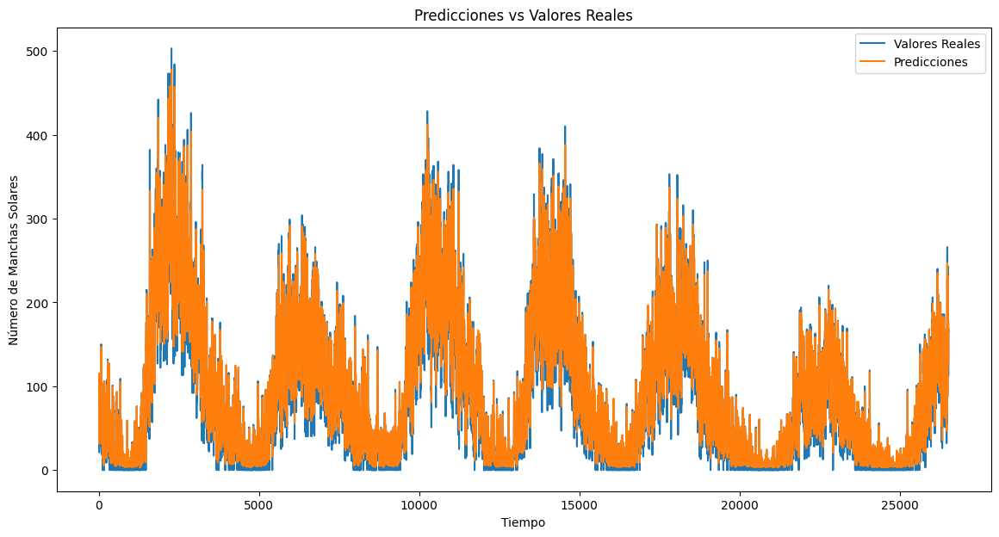

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

1/1 [==============================] - 0s 51ms/step


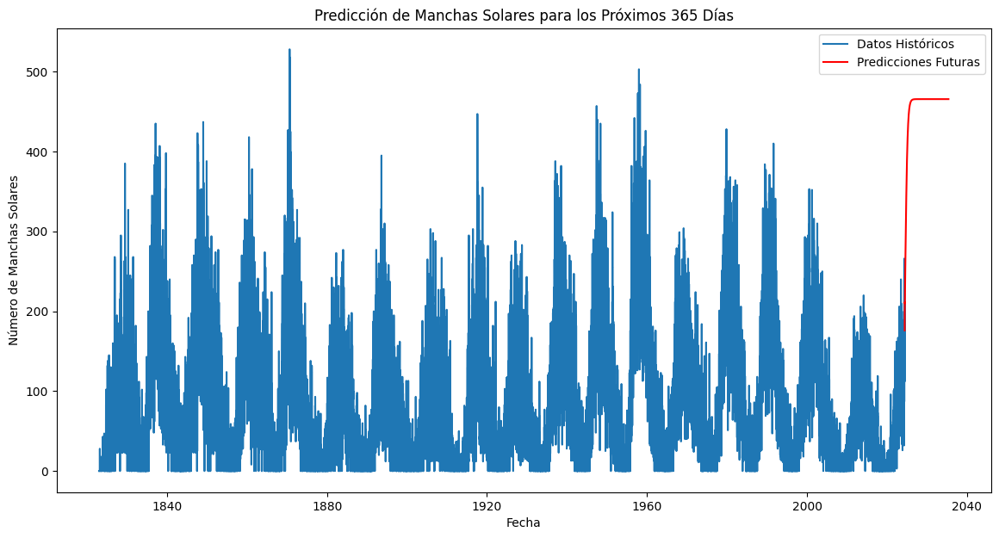

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 4000

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1)).flatten()

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(future_dates, future_predictions, label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicción de Manchas Solares para los Próximos 365 Días')
plt.legend()
plt.show()


#Crear modelo con los hiperparametros  de optuna

En lugar de seleccionar directamente el mejor modelo sugerido por Optuna, se crearon y evaluaron múltiples modelos con diferentes hiperparámetros para comparar su rendimiento y determinar cuál predice mejor.

##Modelo 1

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 1655

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))


Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=292, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.2504708736335935))


model.add(layers.LSTM(units=225, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.4148710133229181))


model.add(layers.LSTM(units=136, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.40406270590094917))

model.add(layers.Flatten())

model.add(layers.Dense(203, activation='relu'))

model.add(layers.Dense(1))

# Compilación del modelo
optimizer = optimizers.Adam(learning_rate=6.691717620444556e-05)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_50 (LSTM)              (None, 1655, 292)         343392    
                                                                 
 dropout_17 (Dropout)        (None, 1655, 292)         0         
                                                                 
 lstm_51 (LSTM)              (None, 1655, 225)         466200    
                                                                 
 dropout_18 (Dropout)        (None, 1655, 225)         0         
                                                                 
 lstm_52 (LSTM)              (None, 1655, 136)         196928    
                                                                 
 dropout_19 (Dropout)        (None, 1655, 136)         0         
                                                                 
 flatten_34 (Flatten)        (None, 225080)          

In [ ]:
# Entrenamiento del modelo con verbose=1 para ver el progreso
history = model.fit(X_train, y_train,
                    epochs=30,
                    batch_size=125,
                    verbose=1,  # Configuración para ver el progreso
                    validation_split=0.2)


Epoch 1/30
272/272 [==============================] - 91s 333ms/step - loss: 0.0024 - mae: 0.0356 - val_loss: 0.0039 - val_mae: 0.0467
Epoch 2/30
272/272 [==============================] - 90s 332ms/step - loss: 0.0022 - mae: 0.0339 - val_loss: 0.0042 - val_mae: 0.0480
Epoch 3/30
272/272 [==============================] - 90s 332ms/step - loss: 0.0021 - mae: 0.0329 - val_loss: 0.0043 - val_mae: 0.0494
Epoch 4/30
272/272 [==============================] - 90s 332ms/step - loss: 0.0020 - mae: 0.0321 - val_loss: 0.0044 - val_mae: 0.0498
Epoch 5/30
272/272 [==============================] - 90s 332ms/step - loss: 0.0018 - mae: 0.0307 - val_loss: 0.0045 - val_mae: 0.0503
Epoch 6/30
272/272 [==============================] - 90s 332ms/step - loss: 0.0017 - mae: 0.0299 - val_loss: 0.0045 - val_mae: 0.0508
Epoch 7/30
272/272 [==============================] - 90s 332ms/step - loss: 0.0016 - mae: 0.0292 - val_loss: 0.0047 - val_mae: 0.0521
Epoch 8/30
272/272 [==============================] - 9

2024/07/10 09:57:33 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during tensorflow autologging: INVALID_PARAMETER_VALUE: Response: {'error_code': 'INVALID_PARAMETER_VALUE'}


In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



In [ ]:
loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

868/868 [==============================] - 54s 61ms/step


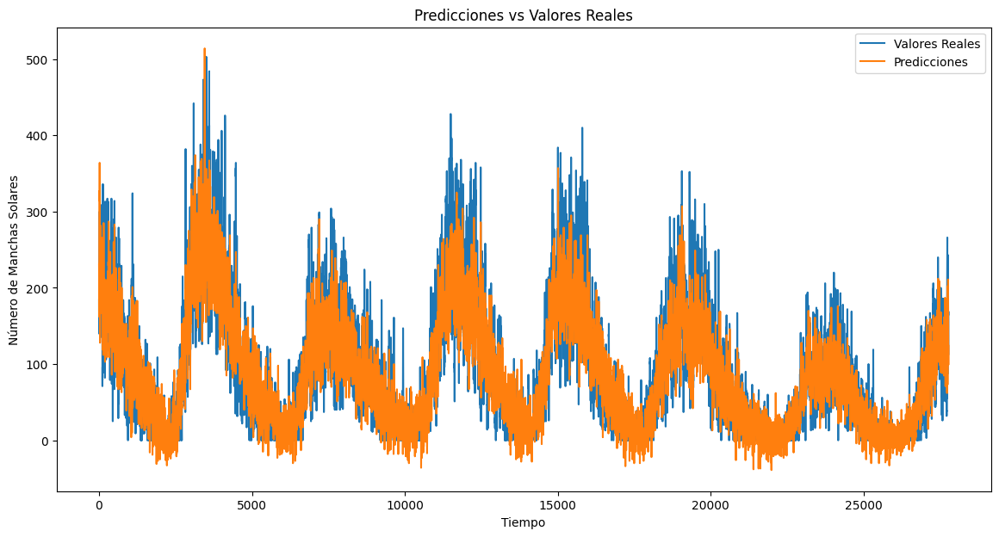

In [ ]:
y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

Se han truncado las últimas 5000 líneas del flujo de salida.
1/1 [==============================] - 0s 74ms/step


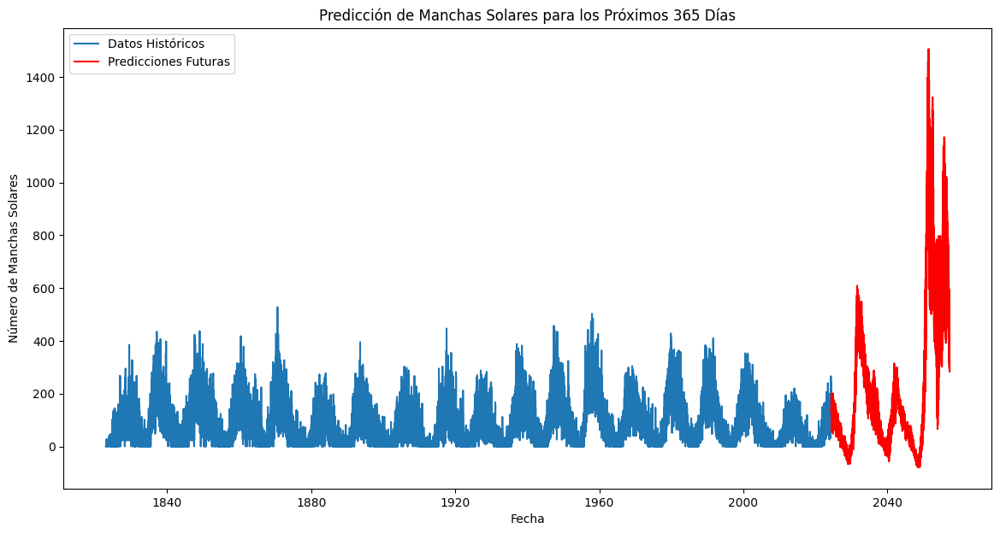

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicción de Manchas Solares para los Próximos 365 Días')
plt.legend()
plt.show()



In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                        142
2024-06-02                        143
2024-06-03                        136
2024-06-04                        130
2024-06-05                        129
...                               ...
2057-04-04                        367
2057-04-05                        339
2057-04-06                        315
2057-04-07                        283
2057-04-08                        296

[12000 rows x 1 columns]


##Modelo 2

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 2228

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))


Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=422, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.674769101934275))

model.add(layers.LSTM(units=70, return_sequences=True))
model.add(layers.Dropout(0.6196772627715862))

model.add(layers.Flatten())

model.add(layers.Dense(34, activation='relu'))
model.add(layers.Dense(240, activation='relu'))

model.add(layers.Dense(1))

# Compilación del modelo
optimizer = optimizers.RMSprop(learning_rate=1.3923820169883657e-05)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (None, 2228, 422)         715712    
                                                                 
 dropout_4 (Dropout)         (None, 2228, 422)         0         
                                                                 
 lstm_5 (LSTM)               (None, 2228, 70)          138040    
                                                                 
 dropout_5 (Dropout)         (None, 2228, 70)          0         
                                                                 
 flatten_2 (Flatten)         (None, 155960)            0         
                                                                 
 dense_6 (Dense)             (None, 34)                5302674   
                                                                 
 dense_7 (Dense)             (None, 240)              

In [ ]:
# Entrenamiento del modelo con verbose=1 para ver el progreso
history = model.fit(X_train, y_train,
                    epochs=40,
                    batch_size=147,
                    verbose=1,  # Configuración para ver el progreso
                    validation_split=0.2)

Epoch 1/40
229/229 [==============================] - 94s 411ms/step - loss: 0.0068 - mae: 0.0604 - val_loss: 0.0060 - val_mae: 0.0556
Epoch 2/40
229/229 [==============================] - 94s 411ms/step - loss: 0.0067 - mae: 0.0601 - val_loss: 0.0060 - val_mae: 0.0554
Epoch 3/40
229/229 [==============================] - 94s 410ms/step - loss: 0.0067 - mae: 0.0600 - val_loss: 0.0059 - val_mae: 0.0562
Epoch 4/40
229/229 [==============================] - 94s 410ms/step - loss: 0.0066 - mae: 0.0596 - val_loss: 0.0058 - val_mae: 0.0557
Epoch 5/40
229/229 [==============================] - 94s 410ms/step - loss: 0.0066 - mae: 0.0595 - val_loss: 0.0058 - val_mae: 0.0557
Epoch 6/40
229/229 [==============================] - 94s 410ms/step - loss: 0.0066 - mae: 0.0594 - val_loss: 0.0058 - val_mae: 0.0551
Epoch 7/40
229/229 [==============================] - 94s 410ms/step - loss: 0.0065 - mae: 0.0592 - val_loss: 0.0058 - val_mae: 0.0559
Epoch 8/40
229/229 [==============================] - 9

In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.models import load_model


loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

850/850 [==============================] - 49s 57ms/step


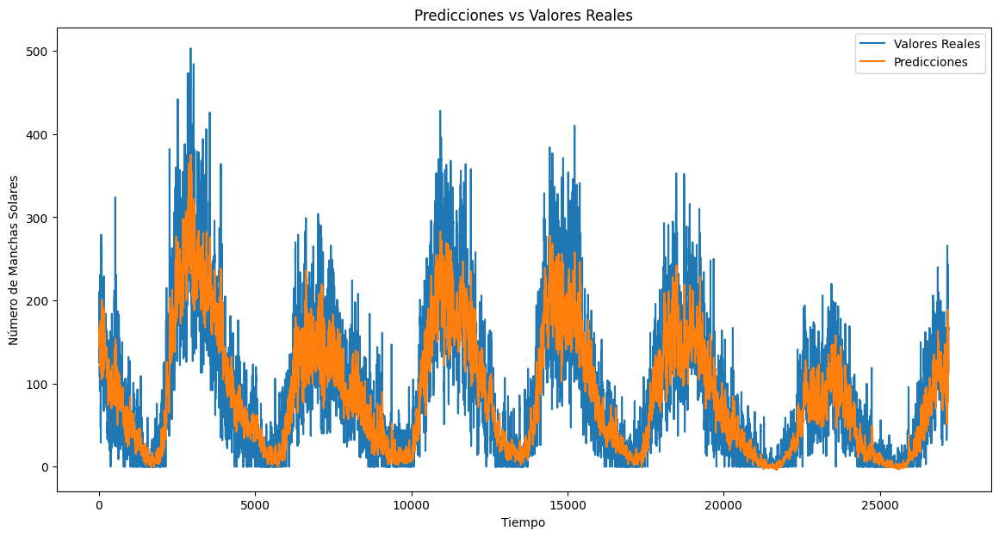

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

Se han truncado las últimas 5000 líneas del flujo de salida.
1/1 [==============================] - 0s 68ms/step


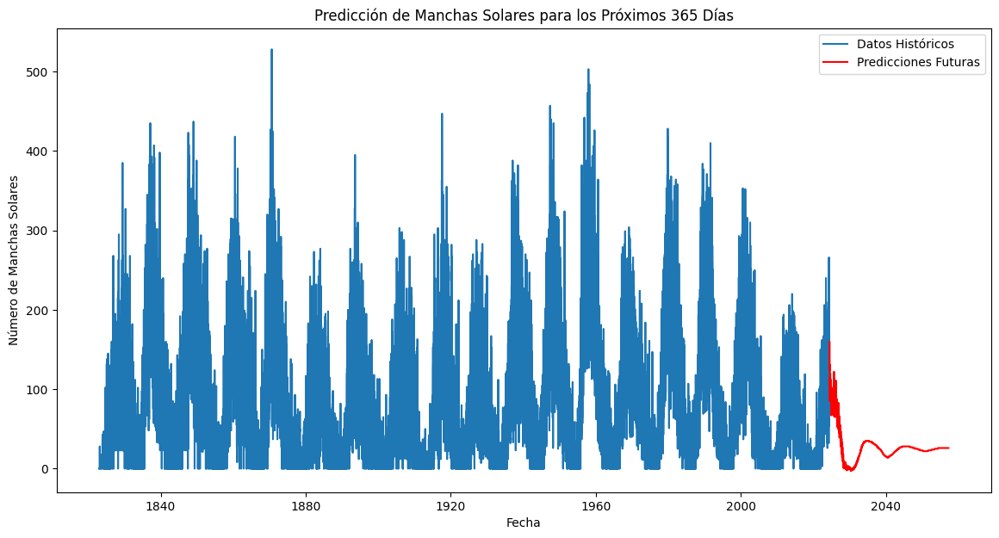

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicción de Manchas Solares para los Próximos 365 Días')
plt.legend()
plt.show()


In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                        129
2024-06-02                        135
2024-06-03                        140
2024-06-04                        143
2024-06-05                        147
...                               ...
2057-04-04                         26
2057-04-05                         26
2057-04-06                         26
2057-04-07                         26
2057-04-08                         26

[12000 rows x 1 columns]


'seq_length': 2228, 'n_lstm_layers': 2, 'lstm_units_0': 422, 'dropout_0': 0.674769101934275, 'lstm_units_1': 70, 'dropout_1': 0.6196772627715862, 'n_dense_layers': 2, 'dense_units_0': 34, 'dense_units_1': 240, 'lr': 1.3923820169883657e-05, 'optimizer': 'rmsprop', 'batch_size': 147

##Modelo 3

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 1349

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))


Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=204, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.3705822471638498))

model.add(layers.LSTM(units=142, return_sequences=True))
model.add(layers.Dropout(0.22639463830880277))

model.add(layers.Flatten())

model.add(layers.Dense(236, activation='relu'))
model.add(layers.Dense(62, activation='relu'))
model.add(layers.Dense(212, activation='relu'))

model.add(layers.Dense(1))

# Compilación del modelo
optimizer = optimizers.RMSprop(learning_rate=0.00015496597651445124)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 1349, 204)         168096    
                                                                 
 dropout_6 (Dropout)         (None, 1349, 204)         0         
                                                                 
 lstm_7 (LSTM)               (None, 1349, 142)         197096    
                                                                 
 dropout_7 (Dropout)         (None, 1349, 142)         0         
                                                                 
 flatten_3 (Flatten)         (None, 191558)            0         
                                                                 
 dense_9 (Dense)             (None, 236)               45207924  
                                                                 
 dense_10 (Dense)            (None, 62)               

In [ ]:
# Entrenamiento del modelo con verbose=1 para ver el progreso
history = model.fit(X_train, y_train,
                    epochs=40,
                    batch_size=172,
                    verbose=1,  # Configuración para ver el progreso
                    validation_split=0.2)

Epoch 1/40
200/200 [==============================] - 41s 189ms/step - loss: 0.0085 - mae: 0.0673 - val_loss: 0.0066 - val_mae: 0.0622
Epoch 2/40
200/200 [==============================] - 37s 183ms/step - loss: 0.0073 - mae: 0.0627 - val_loss: 0.0062 - val_mae: 0.0575
Epoch 3/40
200/200 [==============================] - 37s 184ms/step - loss: 0.0070 - mae: 0.0611 - val_loss: 0.0087 - val_mae: 0.0647
Epoch 4/40
200/200 [==============================] - 37s 184ms/step - loss: 0.0066 - mae: 0.0595 - val_loss: 0.0062 - val_mae: 0.0583
Epoch 5/40
200/200 [==============================] - 37s 184ms/step - loss: 0.0062 - mae: 0.0578 - val_loss: 0.0103 - val_mae: 0.0790
Epoch 6/40
200/200 [==============================] - 37s 184ms/step - loss: 0.0058 - mae: 0.0558 - val_loss: 0.0105 - val_mae: 0.0823
Epoch 7/40
200/200 [==============================] - 37s 184ms/step - loss: 0.0055 - mae: 0.0540 - val_loss: 0.0183 - val_mae: 0.1108
Epoch 8/40
200/200 [==============================] - 3

In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.models import load_model


loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

878/878 [==============================] - 27s 30ms/step


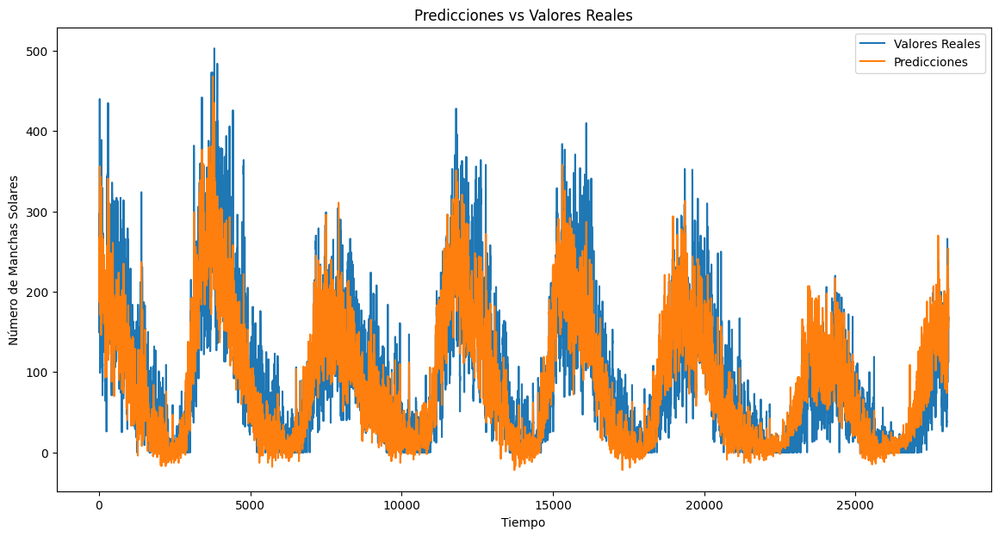

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

Se han truncado las últimas 5000 líneas del flujo de salida.
1/1 [==============================] - 0s 50ms/step


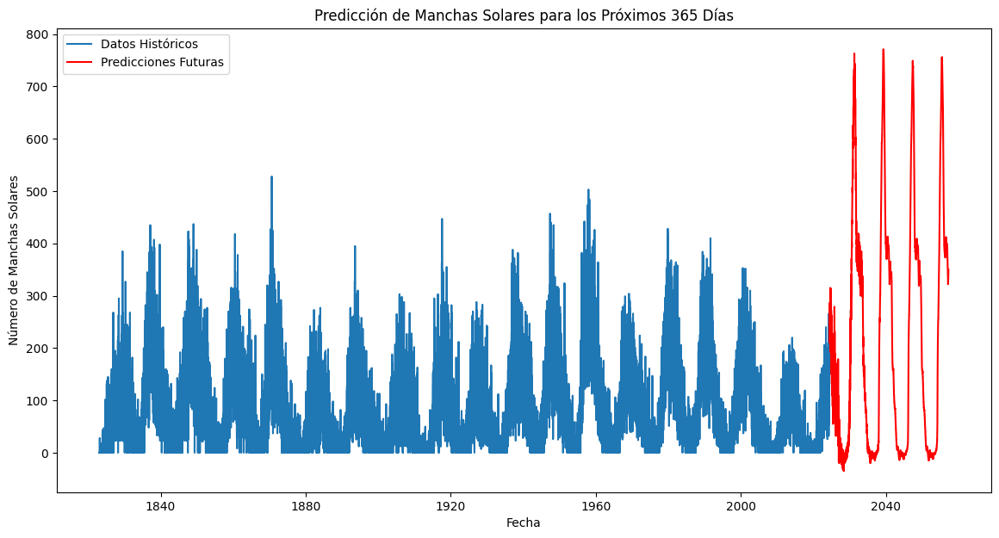

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicción de Manchas Solares para los Próximos 365 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                        211
2024-06-02                        220
2024-06-03                        227
2024-06-04                        232
2024-06-05                        233
...                               ...
2057-04-04                        346
2057-04-05                        347
2057-04-06                        348
2057-04-07                        349
2057-04-08                        350

[12000 rows x 1 columns]


'seq_length': 1349, 'n_lstm_layers': 2, 'lstm_units_0': 204, 'dropout_0': 0.3705822471638498, 'lstm_units_1': 142, 'dropout_1': 0.22639463830880277, 'n_dense_layers': 3, 'dense_units_0': 236, 'dense_units_1': 62, 'dense_units_2': 212, 'lr': 0.00015496597651445124, 'optimizer': 'rmsprop', 'batch_size': 172

##Modelo 4

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 848

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=72, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.6299620056097992))

model.add(layers.LSTM(units=203, return_sequences=True))
model.add(layers.Dropout(0.3075228996668029))


model.add(layers.LSTM(units=181, return_sequences=True))
model.add(layers.Dropout(0.5982698448070696))

model.add(layers.Flatten())

model.add(layers.Dense(141, activation='relu'))
model.add(layers.Dense(114, activation='relu'))
model.add(layers.Dense(1, activation='relu'))

# Compilación del modelo
optimizer = optimizers.Adam(learning_rate=5.171995910679242e-05)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_3 (LSTM)               (None, 848, 72)           21312     
                                                                 
 dropout_3 (Dropout)         (None, 848, 72)           0         
                                                                 
 lstm_4 (LSTM)               (None, 848, 203)          224112    
                                                                 
 dropout_4 (Dropout)         (None, 848, 203)          0         
                                                                 
 lstm_5 (LSTM)               (None, 848, 181)          278740    
                                                                 
 dropout_5 (Dropout)         (None, 848, 181)          0         
                                                                 
 flatten_1 (Flatten)         (None, 153488)           

In [ ]:
# Configurar la detección temprana
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Entrenamiento del modelo
history = model.fit(X_train, y_train,
                    epochs=100,  # Número de épocas
                    batch_size=252,  # Tamaño de lote
                    verbose=1,  # Muestra el progreso
                    callbacks=[early_stopping],  # Detección temprana
                    validation_split=0.2)  # División para validación

Epoch 1/100
138/138 [==============================] - 26s 155ms/step - loss: 0.0086 - mae: 0.0672 - val_loss: 0.0067 - val_mae: 0.0580
Epoch 2/100
138/138 [==============================] - 20s 148ms/step - loss: 0.0074 - mae: 0.0629 - val_loss: 0.0064 - val_mae: 0.0597
Epoch 3/100
138/138 [==============================] - 20s 147ms/step - loss: 0.0071 - mae: 0.0616 - val_loss: 0.0059 - val_mae: 0.0559
Epoch 4/100
138/138 [==============================] - 20s 146ms/step - loss: 0.0068 - mae: 0.0603 - val_loss: 0.0060 - val_mae: 0.0548
Epoch 5/100
138/138 [==============================] - 20s 146ms/step - loss: 0.0064 - mae: 0.0583 - val_loss: 0.0054 - val_mae: 0.0528
Epoch 6/100
138/138 [==============================] - 20s 147ms/step - loss: 0.0060 - mae: 0.0566 - val_loss: 0.0051 - val_mae: 0.0519
Epoch 7/100
138/138 [==============================] - 20s 146ms/step - loss: 0.0056 - mae: 0.0547 - val_loss: 0.0049 - val_mae: 0.0511
Epoch 8/100
138/138 [===========================

In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.models import load_model


loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

894/894 [==============================] - 38s 42ms/step


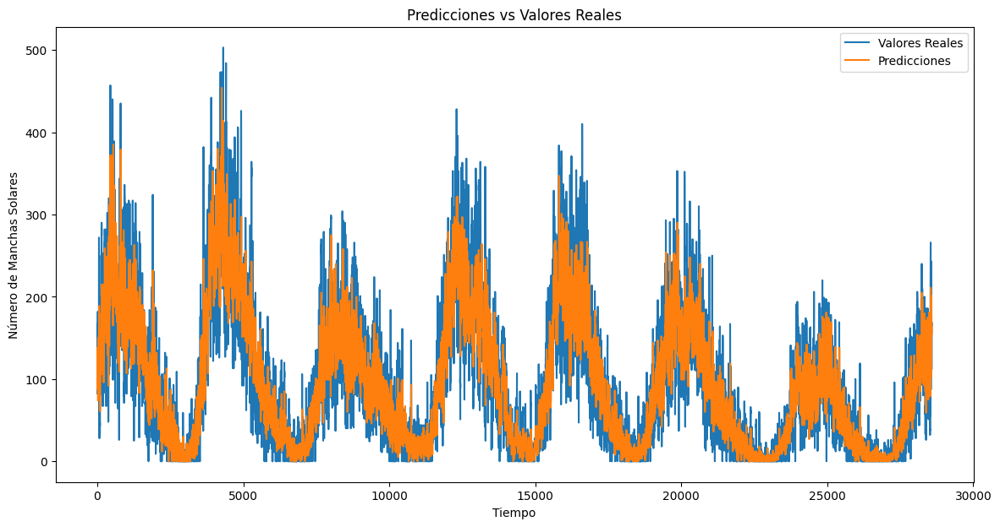

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

Se han truncado las últimas 5000 líneas del flujo de salida.
1/1 [==============================] - 0s 45ms/step


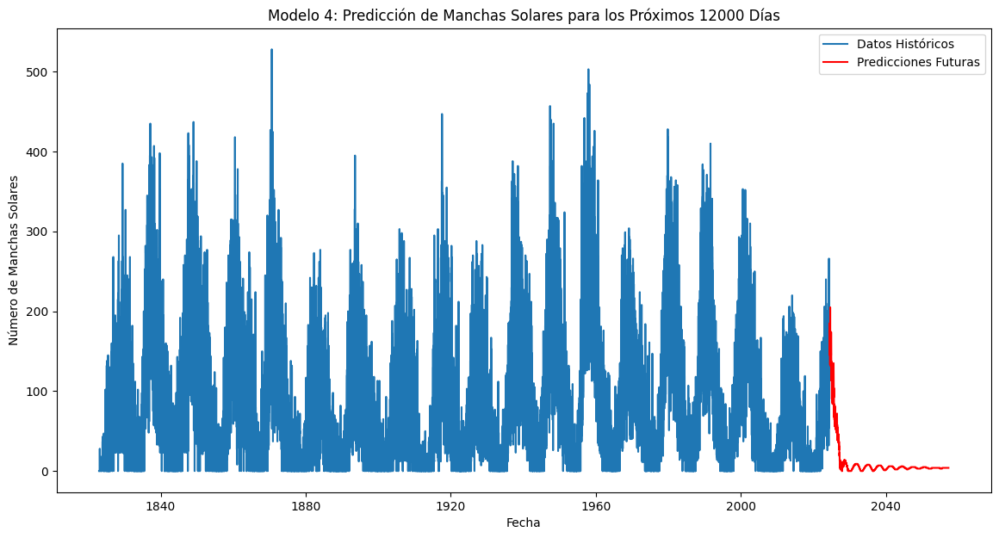

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Modelo 4: Predicción de Manchas Solares para los Próximos 12000 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                        171
2024-06-02                        176
2024-06-03                        180
2024-06-04                        181
2024-06-05                        180
...                               ...
2057-04-04                          4
2057-04-05                          4
2057-04-06                          4
2057-04-07                          4
2057-04-08                          4

[12000 rows x 1 columns]


In [ ]:
# Define la ruta completa para la carpeta y el archivo CSV
folder_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 4'
file_path = os.path.join(folder_path, 'Predicciones_100epocas.csv')

# Verifica si la carpeta existe, si no, créala
if not os.path.exists(folder_path):
    os.makedirs(folder_path)

# Asumiendo que df_predictions es tu DataFrame de predicciones
# Guarda el DataFrame en el archivo CSV especificado
df_predictions.to_csv(file_path)

# Verifica que el archivo se ha guardado correctamente
print(f"DataFrame guardado en: {file_path}")


DataFrame guardado en: /content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 4/Predicciones_100epocas.csv


In [ ]:
# Especificar la ruta en Google Drive con formato HDF5
drive_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 4/100epocas.h5'

# Crear la carpeta si no existe
os.makedirs(os.path.dirname(drive_path), exist_ok=True)

# Guardar el modelo en formato HDF5 en la carpeta especificada
model.save(drive_path)

print(f'Modelo guardado en formato HDF5 en la carpeta de Google Drive: {drive_path}')

Modelo guardado en formato HDF5 en la carpeta de Google Drive: /content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 4/100epocas.h5


seq_length': 848, 'n_lstm_layers': 3, 'lstm_units_0': 72, 'dropout_0': 0.6299620056097992, 'lstm_units_1': 203, 'dropout_1': 0.3075228996668029, 'lstm_units_2': 181, 'dropout_2': 0.5982698448070696, 'n_dense_layers': 2, 'dense_units_0': 141, 'dense_units_1': 114, 'lr': 5.171995910679242e-05, 'optimizer': 'adam', 'batch_size': 252

##Modelo 5

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 1893

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=391, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.272457956483938))

model.add(layers.LSTM(units=63, return_sequences=True))
model.add(layers.Dropout(0.3345531302260185))



model.add(layers.Flatten())

model.add(layers.Dense(239, activation='relu'))
model.add(layers.Dense(98, activation='relu'))
model.add(layers.Dense(1))

# Compilación del modelo
optimizer = optimizers.RMSprop(learning_rate=1.2868137807350673e-05)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_11 (LSTM)              (None, 1893, 391)         614652    
                                                                 
 dropout_11 (Dropout)        (None, 1893, 391)         0         
                                                                 
 lstm_12 (LSTM)              (None, 1893, 63)          114660    
                                                                 
 dropout_12 (Dropout)        (None, 1893, 63)          0         
                                                                 
 flatten_5 (Flatten)         (None, 119259)            0         
                                                                 
 dense_16 (Dense)            (None, 239)               28503140  
                                                                 
 dense_17 (Dense)            (None, 98)               

In [ ]:
# Entrenamiento del modelo con verbose=1 para ver el progreso
history = model.fit(X_train, y_train,
                    epochs=40,
                    batch_size=129,
                    verbose=1,  # Configuración para ver el progreso
                    validation_split=0.2)

Epoch 1/40
262/262 [==============================] - 85s 310ms/step - loss: 0.0090 - mae: 0.0693 - val_loss: 0.0067 - val_mae: 0.0588
Epoch 2/40
262/262 [==============================] - 80s 307ms/step - loss: 0.0078 - mae: 0.0648 - val_loss: 0.0065 - val_mae: 0.0584
Epoch 3/40
262/262 [==============================] - 80s 306ms/step - loss: 0.0076 - mae: 0.0637 - val_loss: 0.0064 - val_mae: 0.0586
Epoch 4/40
262/262 [==============================] - 81s 308ms/step - loss: 0.0074 - mae: 0.0631 - val_loss: 0.0063 - val_mae: 0.0587
Epoch 5/40
262/262 [==============================] - 80s 306ms/step - loss: 0.0073 - mae: 0.0625 - val_loss: 0.0062 - val_mae: 0.0573
Epoch 6/40
262/262 [==============================] - 80s 306ms/step - loss: 0.0072 - mae: 0.0621 - val_loss: 0.0061 - val_mae: 0.0574
Epoch 7/40
262/262 [==============================] - 80s 307ms/step - loss: 0.0071 - mae: 0.0617 - val_loss: 0.0061 - val_mae: 0.0565
Epoch 8/40
262/262 [==============================] - 8

In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.models import load_model


loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

861/861 [==============================] - 41s 47ms/step


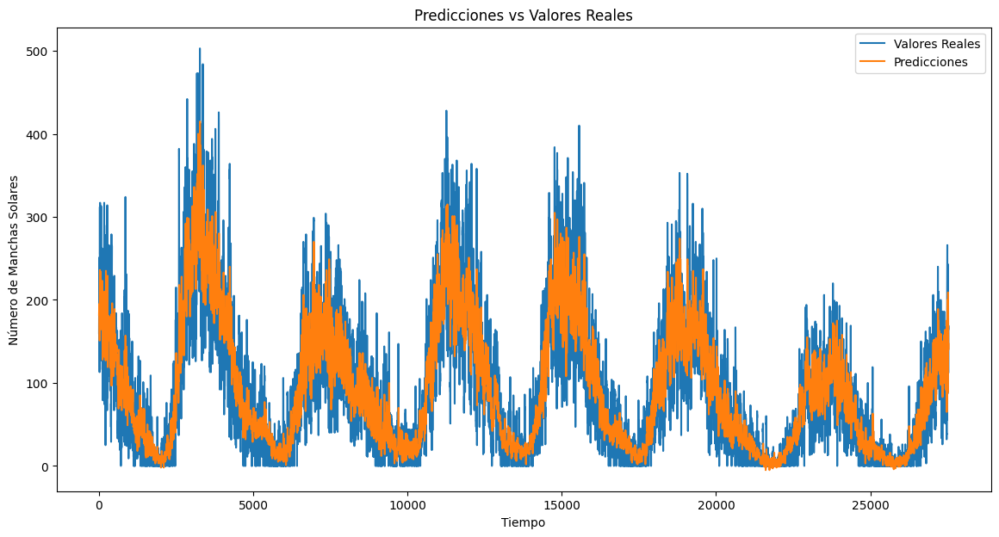

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

Se han truncado las últimas 5000 líneas del flujo de salida.
1/1 [==============================] - 0s 62ms/step


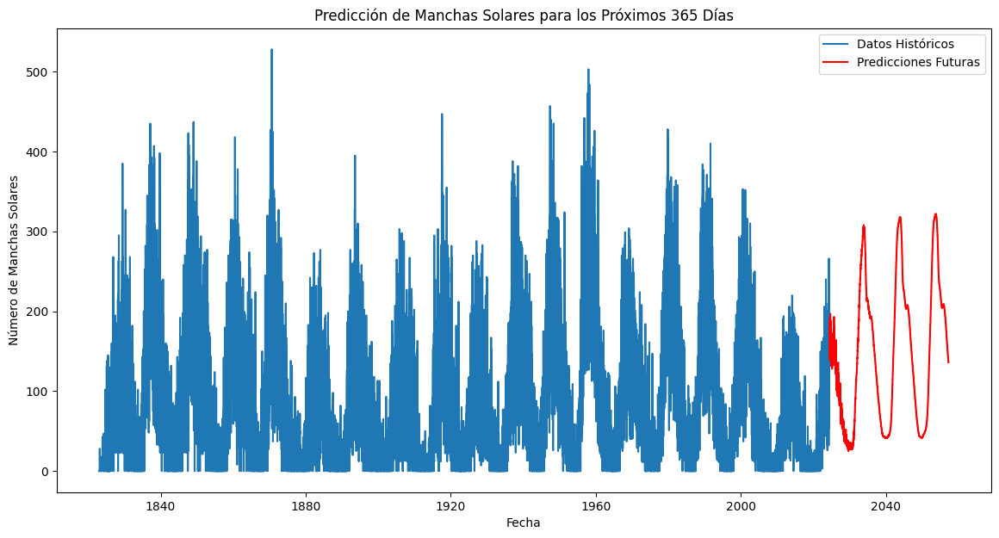

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicción de Manchas Solares para los Próximos 365 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                        153
2024-06-02                        159
2024-06-03                        164
2024-06-04                        169
2024-06-05                        173
...                               ...
2057-04-04                        137
2057-04-05                        136
2057-04-06                        136
2057-04-07                        136
2057-04-08                        136

[12000 rows x 1 columns]


'seq_length': 1893, 'n_lstm_layers': 2, 'lstm_units_0': 391, 'dropout_0': 0.272457956483938, 'lstm_units_1': 63, 'dropout_1': 0.3345531302260185, 'n_dense_layers': 2, 'dense_units_0': 239, 'dense_units_1': 98, 'lr': 1.2868137807350673e-05, 'optimizer': 'rmsprop', 'batch_size': 129

##Modelo 6

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 2857

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=83, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.4519765045205246))

model.add(layers.Flatten())

model.add(layers.Dense(156, activation='relu'))
model.add(layers.Dense(1))

# Compilación del modelo
optimizer = optimizers.Adam(learning_rate=5.373537494807675e-05)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_13 (LSTM)              (None, 2857, 83)          28220     
                                                                 
 dropout_13 (Dropout)        (None, 2857, 83)          0         
                                                                 
 flatten_6 (Flatten)         (None, 237131)            0         
                                                                 
 dense_19 (Dense)            (None, 156)               36992592  
                                                                 
 dense_20 (Dense)            (None, 1)                 157       
                                                                 
Total params: 37020969 (141.22 MB)
Trainable params: 37020969 (141.22 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
# Entrenamiento del modelo con verbose=1 para ver el progreso
history = model.fit(X_train, y_train,
                    epochs=40,
                    batch_size=202,
                    verbose=1,  # Configuración para ver el progreso
                    validation_split=0.2)

Epoch 1/40
164/164 [==============================] - 24s 134ms/step - loss: 0.0464 - mae: 0.1549 - val_loss: 0.0369 - val_mae: 0.1411
Epoch 2/40
164/164 [==============================] - 21s 129ms/step - loss: 0.0403 - mae: 0.1458 - val_loss: 0.0347 - val_mae: 0.1353
Epoch 3/40
164/164 [==============================] - 21s 128ms/step - loss: 0.0380 - mae: 0.1407 - val_loss: 0.0326 - val_mae: 0.1296
Epoch 4/40
164/164 [==============================] - 21s 128ms/step - loss: 0.0360 - mae: 0.1358 - val_loss: 0.0308 - val_mae: 0.1250
Epoch 5/40
164/164 [==============================] - 21s 129ms/step - loss: 0.0341 - mae: 0.1314 - val_loss: 0.0291 - val_mae: 0.1211
Epoch 6/40
164/164 [==============================] - 21s 128ms/step - loss: 0.0323 - mae: 0.1274 - val_loss: 0.0275 - val_mae: 0.1177
Epoch 7/40
164/164 [==============================] - 21s 129ms/step - loss: 0.0308 - mae: 0.1239 - val_loss: 0.0261 - val_mae: 0.1148
Epoch 8/40
164/164 [==============================] - 2

In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.models import load_model


loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

831/831 [==============================] - 26s 31ms/step


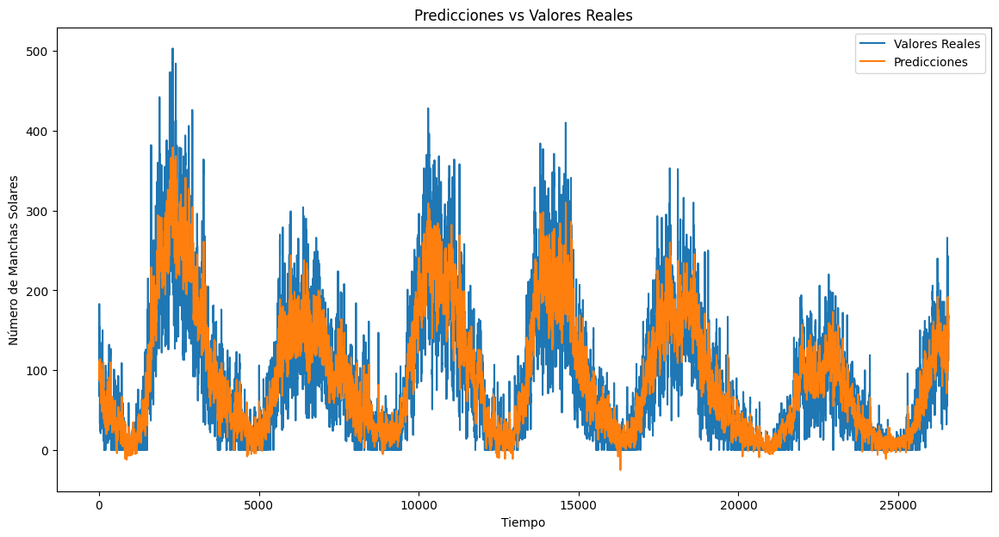

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

Se han truncado las últimas 5000 líneas del flujo de salida.
1/1 [==============================] - 0s 48ms/step


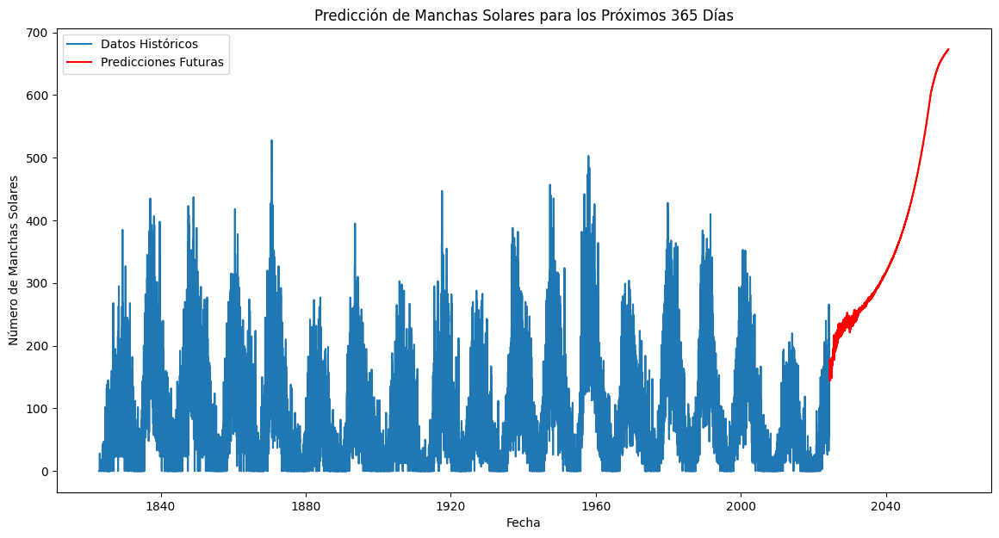

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicción de Manchas Solares para los Próximos 365 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                        154
2024-06-02                        159
2024-06-03                        163
2024-06-04                        167
2024-06-05                        169
...                               ...
2057-04-04                        673
2057-04-05                        673
2057-04-06                        673
2057-04-07                        673
2057-04-08                        673

[12000 rows x 1 columns]


'seq_length': 2857, 'n_lstm_layers': 1, 'lstm_units_0': 83, 'dropout_0': 0.4519765045205246, 'n_dense_layers': 1, 'dense_units_0': 156, 'lr': 5.373537494807675e-05, 'optimizer': 'adam', 'batch_size': 202

##Modelo 7

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 3633

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=430, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.5515225976651156))

model.add(layers.LSTM(units=196, return_sequences=True))
model.add(layers.Dropout(0.32597817626347336))

model.add(layers.Flatten())

model.add(layers.Dense(164, activation='relu'))
model.add(layers.Dense(133, activation='relu'))
model.add(layers.Dense(1, activation='relu'))

# Compilación del modelo
optimizer = optimizers.Adam(learning_rate=0.0007986415268364704)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 3633, 430)         743040    
                                                                 
 dropout_6 (Dropout)         (None, 3633, 430)         0         
                                                                 
 lstm_7 (LSTM)               (None, 3633, 196)         491568    
                                                                 
 dropout_7 (Dropout)         (None, 3633, 196)         0         
                                                                 
 flatten_2 (Flatten)         (None, 712068)            0         
                                                                 
 dense_6 (Dense)             (None, 164)               116779316 
                                                                 
 dense_7 (Dense)             (None, 133)              

In [ ]:
# Configurar la detección temprana
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Entrenamiento del modelo
history = model.fit(X_train, y_train,
                    epochs=100,  # Número de épocas
                    batch_size=220,  # Tamaño de lote
                    verbose=1,  # Muestra el progreso
                    callbacks=[early_stopping],  # Detección temprana
                    validation_split=0.2)  # División para validación

Epoch 1/100
148/148 [==============================] - 102s 657ms/step - loss: 0.5273 - mae: 0.2076 - val_loss: 0.0393 - val_mae: 0.1470
Epoch 2/100
148/148 [==============================] - 96s 646ms/step - loss: 0.0437 - mae: 0.1531 - val_loss: 0.0393 - val_mae: 0.1470
Epoch 3/100
148/148 [==============================] - 95s 644ms/step - loss: 0.0437 - mae: 0.1531 - val_loss: 0.0393 - val_mae: 0.1470
Epoch 4/100
148/148 [==============================] - 95s 643ms/step - loss: 0.0437 - mae: 0.1531 - val_loss: 0.0393 - val_mae: 0.1470
Epoch 5/100
148/148 [==============================] - 95s 644ms/step - loss: 0.0437 - mae: 0.1531 - val_loss: 0.0393 - val_mae: 0.1470
Epoch 6/100
148/148 [==============================] - 95s 642ms/step - loss: 0.0437 - mae: 0.1531 - val_loss: 0.0393 - val_mae: 0.1470
Epoch 7/100
148/148 [==============================] - 95s 642ms/step - loss: 0.0437 - mae: 0.1531 - val_loss: 0.0393 - val_mae: 0.1470
Epoch 8/100
148/148 [==========================

In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.models import load_model


loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

807/807 [==============================] - 94s 116ms/step


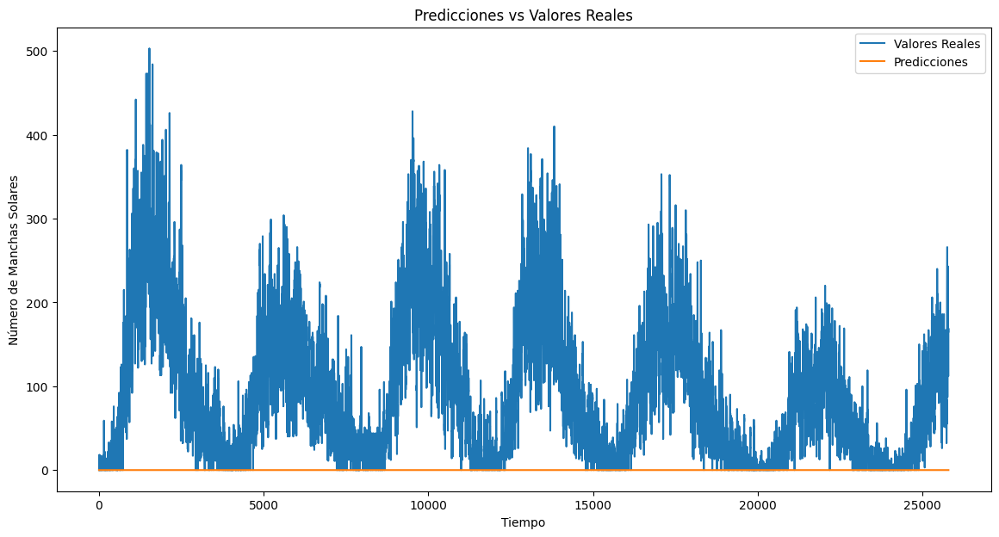

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

Se han truncado las últimas 5000 líneas del flujo de salida.
1/1 [==============================] - 0s 142ms/step


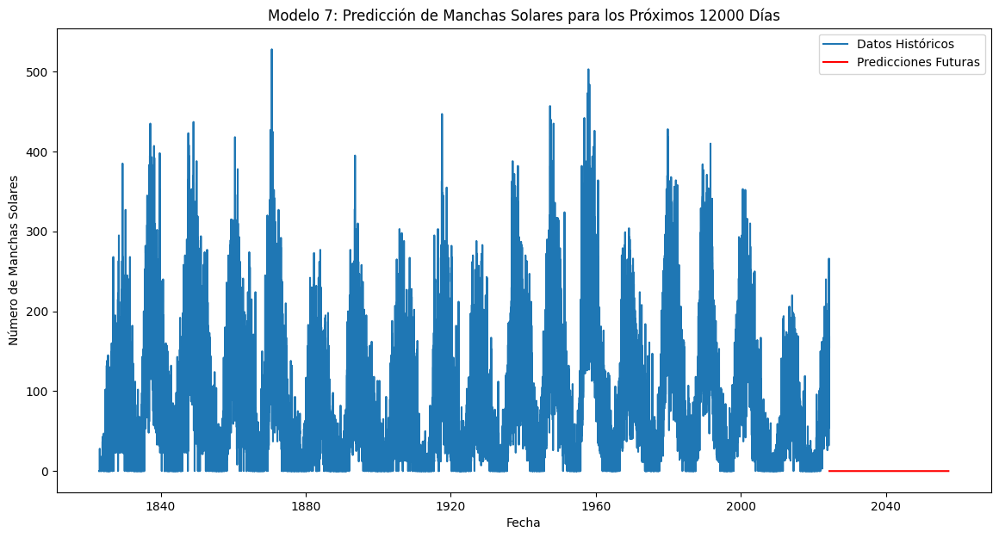

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Modelo 7: Predicción de Manchas Solares para los Próximos 12000 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                          0
2024-06-02                          0
2024-06-03                          0
2024-06-04                          0
2024-06-05                          0
...                               ...
2057-04-04                          0
2057-04-05                          0
2057-04-06                          0
2057-04-07                          0
2057-04-08                          0

[12000 rows x 1 columns]


In [ ]:
# Define la ruta completa para la carpeta y el archivo CSV
folder_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 7'
file_path = os.path.join(folder_path, 'Predicciones_100epocas.csv')

# Verifica si la carpeta existe, si no, créala
if not os.path.exists(folder_path):
    os.makedirs(folder_path)

# Asumiendo que df_predictions es tu DataFrame de predicciones
# Guarda el DataFrame en el archivo CSV especificado
df_predictions.to_csv(file_path)

# Verifica que el archivo se ha guardado correctamente
print(f"DataFrame guardado en: {file_path}")


DataFrame guardado en: /content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 7/Predicciones_100epocas.csv


In [ ]:
# Especificar la ruta en Google Drive con formato HDF5
drive_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 7/100epocas.h5'

# Crear la carpeta si no existe
os.makedirs(os.path.dirname(drive_path), exist_ok=True)

# Guardar el modelo en formato HDF5 en la carpeta especificada
model.save(drive_path)

print(f'Modelo guardado en formato HDF5 en la carpeta de Google Drive: {drive_path}')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Modelo guardado en formato HDF5 en la carpeta de Google Drive: /content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 7/100epocas.h5


'seq_length': 3633, 'n_lstm_layers': 2, 'lstm_units_0': 430, 'dropout_0': 0.5515225976651156, 'lstm_units_1': 196, 'dropout_1': 0.32597817626347336, 'n_dense_layers': 2, 'dense_units_0': 164, 'dense_units_1': 133, 'lr': 0.0007986415268364704, 'optimizer': 'adam', 'batch_size': 220

##Modelo 8

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 3959

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=440, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.25062300373644525))

model.add(layers.LSTM(units=307, return_sequences=True))
model.add(layers.Dropout(0.215251742585646))

model.add(layers.LSTM(units=201, return_sequences=True))
model.add(layers.Dropout(0.22299991362460267))


model.add(layers.Flatten())

model.add(layers.Dense(94, activation='relu'))
model.add(layers.Dense(1))

# Compilación del modelo
optimizer = optimizers.Adam(learning_rate=3.8474510102676005e-05)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 3959, 440)         777920    
                                                                 
 dropout (Dropout)           (None, 3959, 440)         0         
                                                                 
 lstm_1 (LSTM)               (None, 3959, 307)         918544    
                                                                 
 dropout_1 (Dropout)         (None, 3959, 307)         0         
                                                                 
 lstm_2 (LSTM)               (None, 3959, 201)         409236    
                                                                 
 dropout_2 (Dropout)         (None, 3959, 201)         0         
                                                                 
 flatten (Flatten)           (None, 795759)            0

In [ ]:
# Entrenamiento del modelo con verbose=1 para ver el progreso
history = model.fit(X_train, y_train,
                    epochs=40,
                    batch_size=27,
                    verbose=1,  # Configuración para ver el progreso
                    validation_split=0.2)

Epoch 1/40
1191/1191 [==============================] - 548s 454ms/step - loss: 0.0077 - mae: 0.0643 - val_loss: 0.0070 - val_mae: 0.0623
Epoch 2/40
1191/1191 [==============================] - 541s 454ms/step - loss: 0.0053 - mae: 0.0535 - val_loss: 0.0067 - val_mae: 0.0607
Epoch 3/40
1191/1191 [==============================] - 542s 455ms/step - loss: 0.0037 - mae: 0.0448 - val_loss: 0.0068 - val_mae: 0.0620
Epoch 4/40
1191/1191 [==============================] - 541s 455ms/step - loss: 0.0029 - mae: 0.0390 - val_loss: 0.0074 - val_mae: 0.0670
Epoch 5/40
1191/1191 [==============================] - 541s 454ms/step - loss: 0.0024 - mae: 0.0356 - val_loss: 0.0069 - val_mae: 0.0628
Epoch 6/40
1191/1191 [==============================] - 541s 454ms/step - loss: 0.0021 - mae: 0.0331 - val_loss: 0.0074 - val_mae: 0.0664
Epoch 7/40
1191/1191 [==============================] - 542s 455ms/step - loss: 0.0019 - mae: 0.0315 - val_loss: 0.0075 - val_mae: 0.0652
Epoch 8/40
1191/1191 [============

In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.models import load_model


loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

796/796 [==============================] - 131s 163ms/step


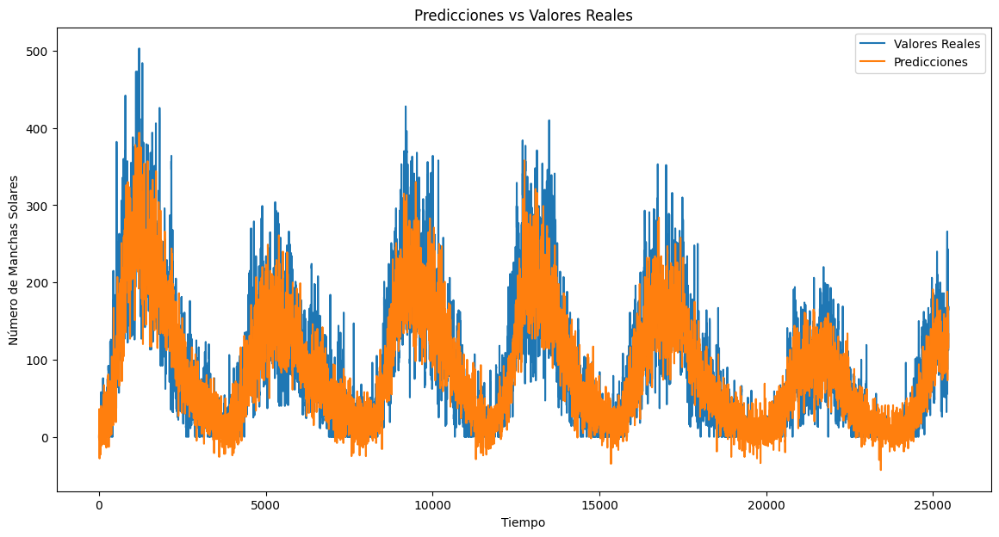

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

Se han truncado las últimas 5000 líneas del flujo de salida.
1/1 [==============================] - 0s 157ms/step


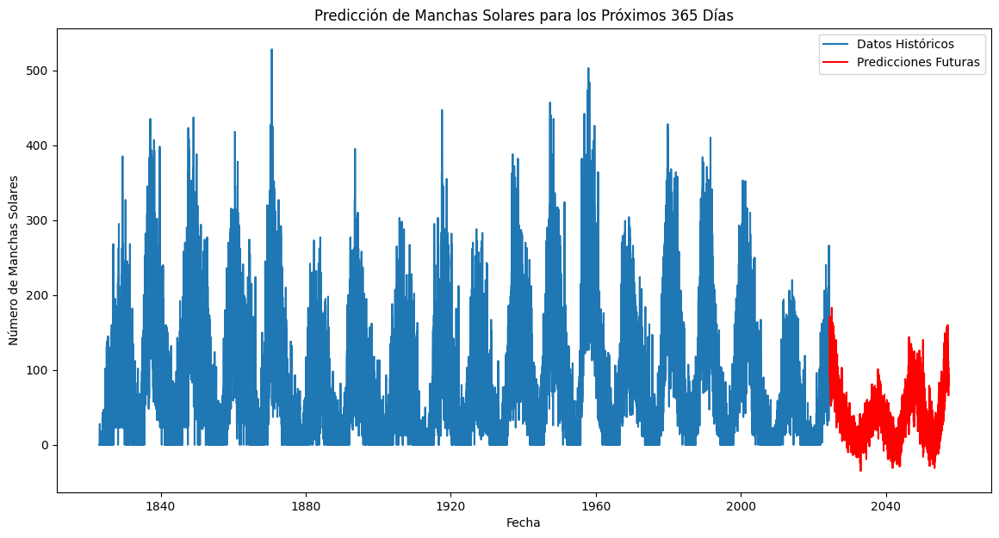

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicción de Manchas Solares para los Próximos 365 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                        143
2024-06-02                        155
2024-06-03                        164
2024-06-04                        155
2024-06-05                        140
...                               ...
2057-04-04                         66
2057-04-05                         70
2057-04-06                         79
2057-04-07                         87
2057-04-08                         94

[12000 rows x 1 columns]


'seq_length': 3959, 'n_lstm_layers': 3, 'lstm_units_0': 440, 'dropout_0': 0.25062300373644525, 'lstm_units_1': 307, 'dropout_1': 0.215251742585646, 'lstm_units_2': 201, 'dropout_2': 0.22299991362460267, 'n_dense_layers': 1, 'dense_units_0': 94, 'lr': 3.8474510102676005e-05, 'optimizer': 'adam', 'batch_size': 27

##Modelo 9

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 1714

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=395, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.42235039369113725))

model.add(layers.LSTM(units=226, return_sequences=True))
model.add(layers.Dropout(0.2817606733503408))


model.add(layers.Flatten())

model.add(layers.Dense(118, activation='relu'))
model.add(layers.Dense(66, activation='relu'))
model.add(layers.Dense(1))

# Compilación del modelo
optimizer = optimizers.RMSprop(learning_rate=1.083795257384102e-05)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_3 (LSTM)               (None, 1714, 395)         627260    
                                                                 
 dropout_3 (Dropout)         (None, 1714, 395)         0         
                                                                 
 lstm_4 (LSTM)               (None, 1714, 226)         562288    
                                                                 
 dropout_4 (Dropout)         (None, 1714, 226)         0         
                                                                 
 flatten_1 (Flatten)         (None, 387364)            0         
                                                                 
 dense_2 (Dense)             (None, 118)               45709070  
                                                                 
 dense_3 (Dense)             (None, 66)               

In [ ]:
# Entrenamiento del modelo con verbose=1 para ver el progreso
history = model.fit(X_train, y_train,
                    epochs=40,
                    batch_size=241,
                    verbose=1,  # Configuración para ver el progreso
                    validation_split=0.2)

Epoch 1/40
141/141 [==============================] - 82s 558ms/step - loss: 0.0098 - mae: 0.0714 - val_loss: 0.0068 - val_mae: 0.0612
Epoch 2/40
141/141 [==============================] - 78s 552ms/step - loss: 0.0079 - mae: 0.0655 - val_loss: 0.0066 - val_mae: 0.0588
Epoch 3/40
141/141 [==============================] - 78s 553ms/step - loss: 0.0076 - mae: 0.0644 - val_loss: 0.0066 - val_mae: 0.0581
Epoch 4/40
141/141 [==============================] - 78s 553ms/step - loss: 0.0075 - mae: 0.0637 - val_loss: 0.0064 - val_mae: 0.0583
Epoch 5/40
141/141 [==============================] - 78s 554ms/step - loss: 0.0074 - mae: 0.0632 - val_loss: 0.0064 - val_mae: 0.0574
Epoch 6/40
141/141 [==============================] - 78s 554ms/step - loss: 0.0073 - mae: 0.0626 - val_loss: 0.0063 - val_mae: 0.0589
Epoch 7/40
141/141 [==============================] - 78s 553ms/step - loss: 0.0072 - mae: 0.0625 - val_loss: 0.0062 - val_mae: 0.0575
Epoch 8/40
141/141 [==============================] - 7

In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.models import load_model


loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

866/866 [==============================] - 46s 52ms/step


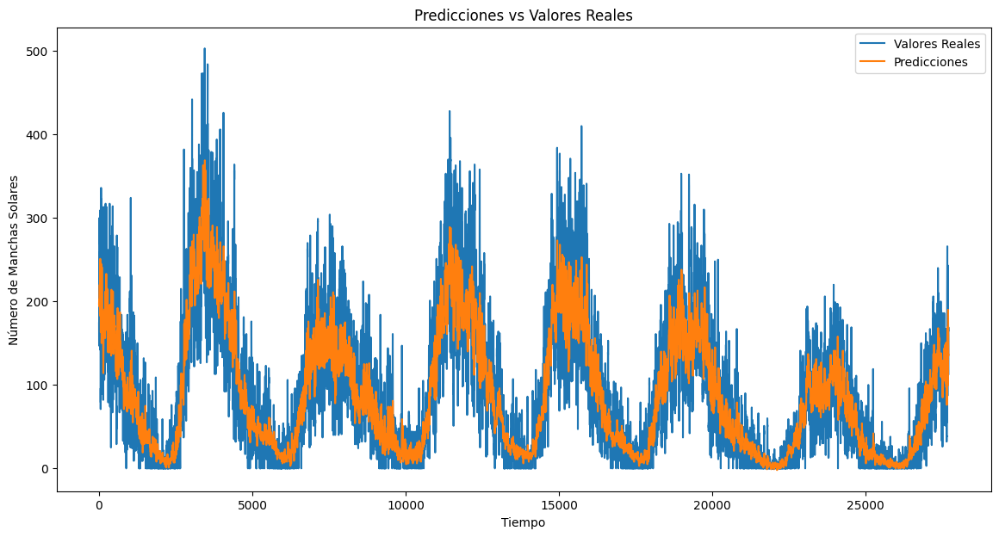

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

Se han truncado las últimas 5000 líneas del flujo de salida.
1/1 [==============================] - 0s 59ms/step


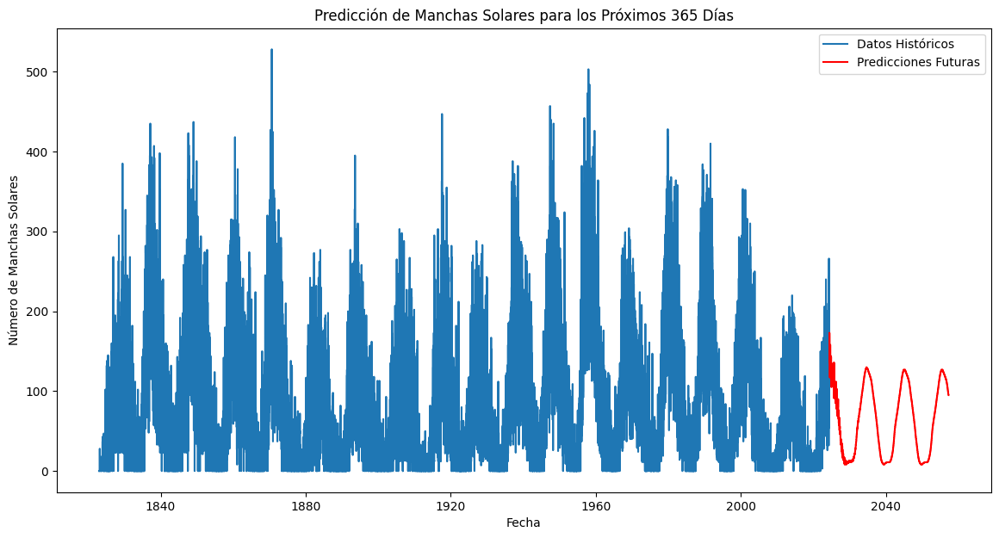

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicción de Manchas Solares para los Próximos 365 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                        139
2024-06-02                        143
2024-06-03                        147
2024-06-04                        151
2024-06-05                        155
...                               ...
2057-04-04                         95
2057-04-05                         95
2057-04-06                         95
2057-04-07                         95
2057-04-08                         95

[12000 rows x 1 columns]


'seq_length': 1714, 'n_lstm_layers': 2, 'lstm_units_0': 395, 'dropout_0': 0.42235039369113725, 'lstm_units_1': 226, 'dropout_1': 0.2817606733503408, 'n_dense_layers': 2, 'dense_units_0': 118, 'dense_units_1': 66, 'lr': 1.083795257384102e-05, 'optimizer': 'rmsprop', 'batch_size': 241

##Modelo 10

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 3733

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=331, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.13635886222783491))

model.add(layers.Flatten())

model.add(layers.Dense(61, activation='relu'))
model.add(layers.Dense(1))

# Compilación del modelo
optimizer = optimizers.RMSprop(learning_rate=2.395156944751088e-05)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (None, 3733, 331)         440892    
                                                                 
 dropout_8 (Dropout)         (None, 3733, 331)         0         
                                                                 
 flatten_3 (Flatten)         (None, 1235623)           0         
                                                                 
 dense_9 (Dense)             (None, 61)                75373064  
                                                                 
 dense_10 (Dense)            (None, 1)                 62        
                                                                 
Total params: 75814018 (289.21 MB)
Trainable params: 75814018 (289.21 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
# Configurar la detección temprana
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Entrenamiento del modelo
history = model.fit(X_train, y_train,
                    epochs=100,  # Número de épocas
                    batch_size=38,  # Tamaño de lote
                    verbose=1,  # Muestra el progreso
                    callbacks=[early_stopping],  # Detección temprana
                    validation_split=0.2)  # División para validación

Epoch 1/100
851/851 [==============================] - 144s 167ms/step - loss: 0.0078 - mae: 0.0642 - val_loss: 0.0063 - val_mae: 0.0564
Epoch 2/100
851/851 [==============================] - 141s 166ms/step - loss: 0.0064 - mae: 0.0583 - val_loss: 0.0055 - val_mae: 0.0539
Epoch 3/100
851/851 [==============================] - 141s 165ms/step - loss: 0.0058 - mae: 0.0555 - val_loss: 0.0054 - val_mae: 0.0524
Epoch 4/100
851/851 [==============================] - 141s 166ms/step - loss: 0.0053 - mae: 0.0530 - val_loss: 0.0048 - val_mae: 0.0508
Epoch 5/100
851/851 [==============================] - 141s 165ms/step - loss: 0.0048 - mae: 0.0507 - val_loss: 0.0046 - val_mae: 0.0489
Epoch 6/100
851/851 [==============================] - 141s 166ms/step - loss: 0.0045 - mae: 0.0488 - val_loss: 0.0045 - val_mae: 0.0493
Epoch 7/100
851/851 [==============================] - 141s 165ms/step - loss: 0.0042 - mae: 0.0470 - val_loss: 0.0042 - val_mae: 0.0486
Epoch 8/100
851/851 [====================

In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.models import load_model


loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

803/803 [==============================] - 58s 71ms/step


In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

Se han truncado las últimas 5000 líneas del flujo de salida.
1/1 [==============================] - 0s 62ms/step


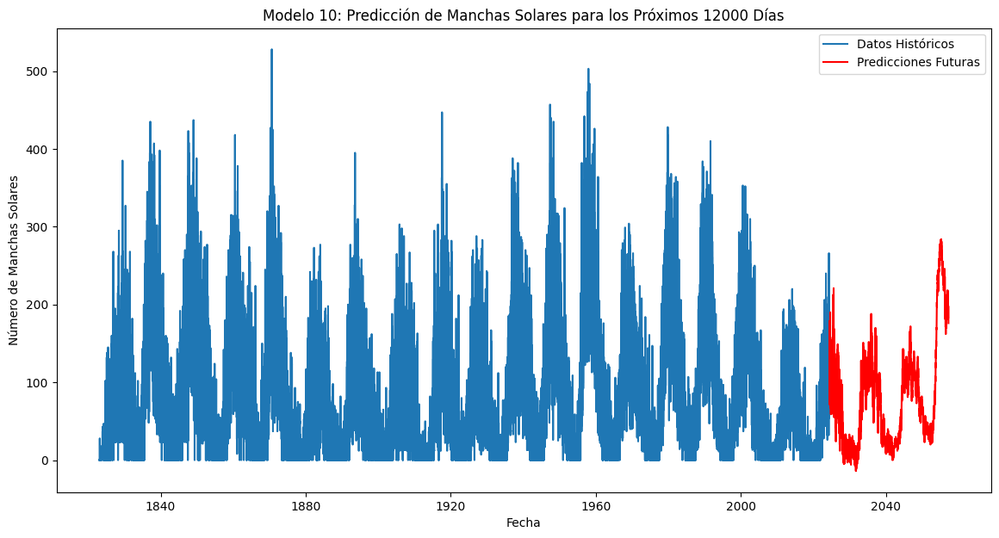

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Modelo 10: Predicción de Manchas Solares para los Próximos 12000 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                        149
2024-06-02                        141
2024-06-03                        128
2024-06-04                        111
2024-06-05                         95
...                               ...
2057-04-04                        183
2057-04-05                        181
2057-04-06                        179
2057-04-07                        177
2057-04-08                        176

[12000 rows x 1 columns]


In [ ]:
# Define la ruta completa para la carpeta y el archivo CSV
folder_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 10'
file_path = os.path.join(folder_path, 'Predicciones_100epocas.csv')

# Verifica si la carpeta existe, si no, créala
if not os.path.exists(folder_path):
    os.makedirs(folder_path)

# Asumiendo que df_predictions es tu DataFrame de predicciones
# Guarda el DataFrame en el archivo CSV especificado
df_predictions.to_csv(file_path)

# Verifica que el archivo se ha guardado correctamente
print(f"DataFrame guardado en: {file_path}")


DataFrame guardado en: /content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 10/Predicciones_100epocas.csv


In [ ]:
# Especificar la ruta en Google Drive con formato HDF5
drive_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 10/100epocas.h5'

# Crear la carpeta si no existe
os.makedirs(os.path.dirname(drive_path), exist_ok=True)

# Guardar el modelo en formato HDF5 en la carpeta especificada
model.save(drive_path)

print(f'Modelo guardado en formato HDF5 en la carpeta de Google Drive: {drive_path}')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Modelo guardado en formato HDF5 en la carpeta de Google Drive: /content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 10/100epocas.h5


'seq_length': 3733, 'n_lstm_layers': 1, 'lstm_units_0': 331, 'dropout_0': 0.13635886222783491, 'n_dense_layers': 1, 'dense_units_0': 61, 'lr': 2.395156944751088e-05, 'optimizer': 'rmsprop', 'batch_size': 38

##Modelo 11

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 2975

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=492, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.5485598559703065))

model.add(layers.Flatten())

model.add(layers.Dense(193, activation='relu'))
model.add(layers.Dense(185, activation='relu'))
model.add(layers.Dense(37, activation='relu'))
model.add(layers.Dense(1, activation='relu'))

# Compilación del modelo
optimizer = optimizers.Adam(learning_rate=0.0009517499039984517)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_10 (LSTM)              (None, 2975, 492)         972192    
                                                                 
 dropout_10 (Dropout)        (None, 2975, 492)         0         
                                                                 
 flatten_5 (Flatten)         (None, 1463700)           0         
                                                                 
 dense_15 (Dense)            (None, 193)               282494293 
                                                                 
 dense_16 (Dense)            (None, 185)               35890     
                                                                 
 dense_17 (Dense)            (None, 37)                6882      
                                                                 
 dense_18 (Dense)            (None, 1)                

In [ ]:
# Configurar la detección temprana
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Entrenamiento del modelo
history = model.fit(X_train, y_train,
                    epochs=100,  # Número de épocas
                    batch_size=85,  # Tamaño de lote
                    verbose=1,  # Muestra el progreso
                    callbacks=[early_stopping],  # Detección temprana
                    validation_split=0.2)  # División para validación

Epoch 1/100
388/388 [==============================] - 73s 181ms/step - loss: 1.8360 - mae: 0.2213 - val_loss: 0.0389 - val_mae: 0.1462
Epoch 2/100
388/388 [==============================] - 68s 176ms/step - loss: 0.0434 - mae: 0.1526 - val_loss: 0.0389 - val_mae: 0.1462
Epoch 3/100
388/388 [==============================] - 68s 175ms/step - loss: 0.0434 - mae: 0.1526 - val_loss: 0.0389 - val_mae: 0.1462
Epoch 4/100
388/388 [==============================] - 68s 175ms/step - loss: 0.0434 - mae: 0.1526 - val_loss: 0.0389 - val_mae: 0.1462
Epoch 5/100
388/388 [==============================] - 68s 175ms/step - loss: 0.0434 - mae: 0.1526 - val_loss: 0.0389 - val_mae: 0.1462
Epoch 6/100
388/388 [==============================] - 68s 175ms/step - loss: 0.0434 - mae: 0.1526 - val_loss: 0.0389 - val_mae: 0.1462
Epoch 7/100
388/388 [==============================] - 68s 175ms/step - loss: 0.0434 - mae: 0.1526 - val_loss: 0.0389 - val_mae: 0.1462
Epoch 8/100
388/388 [===========================

In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.models import load_model


loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

827/827 [==============================] - 47s 56ms/step


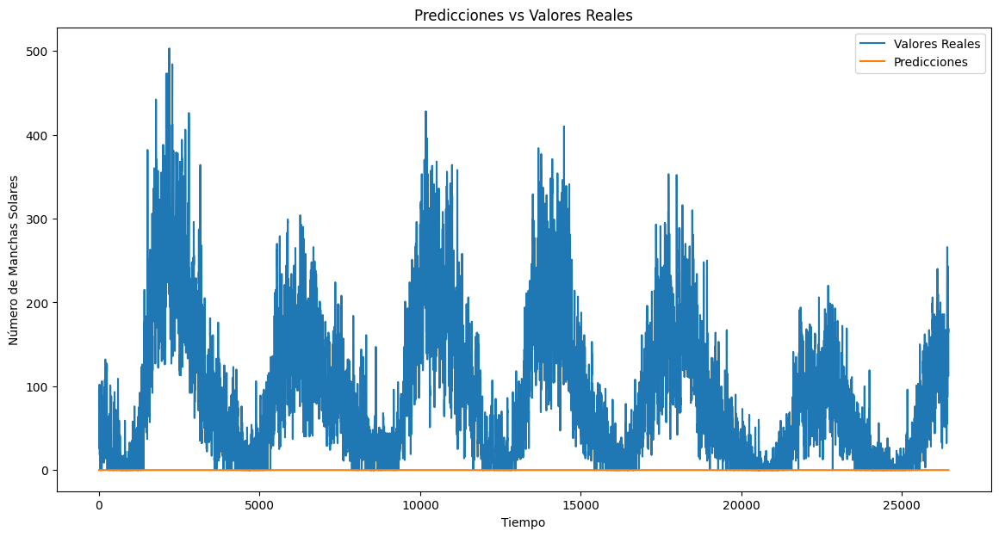

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

Se han truncado las últimas 5000 líneas del flujo de salida.
1/1 [==============================] - 0s 94ms/step


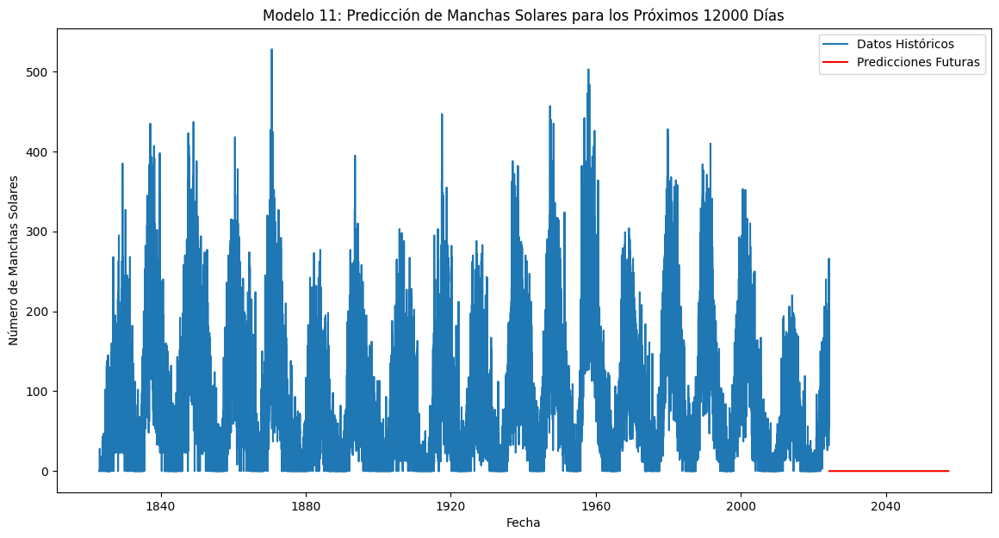

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Modelo 11: Predicción de Manchas Solares para los Próximos 12000 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                          0
2024-06-02                          0
2024-06-03                          0
2024-06-04                          0
2024-06-05                          0
...                               ...
2057-04-04                          0
2057-04-05                          0
2057-04-06                          0
2057-04-07                          0
2057-04-08                          0

[12000 rows x 1 columns]


In [ ]:
# Define la ruta completa para la carpeta y el archivo CSV
folder_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 11'
file_path = os.path.join(folder_path, 'Predicciones_100epocas.csv')

# Verifica si la carpeta existe, si no, créala
if not os.path.exists(folder_path):
    os.makedirs(folder_path)

# Asumiendo que df_predictions es tu DataFrame de predicciones
# Guarda el DataFrame en el archivo CSV especificado
df_predictions.to_csv(file_path)

# Verifica que el archivo se ha guardado correctamente
print(f"DataFrame guardado en: {file_path}")


DataFrame guardado en: /content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 11/Predicciones_100epocas.csv


In [ ]:
# Especificar la ruta en Google Drive con formato HDF5
drive_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 11/100epocas.h5'

# Crear la carpeta si no existe
os.makedirs(os.path.dirname(drive_path), exist_ok=True)

# Guardar el modelo en formato HDF5 en la carpeta especificada
model.save(drive_path)

print(f'Modelo guardado en formato HDF5 en la carpeta de Google Drive: {drive_path}')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Modelo guardado en formato HDF5 en la carpeta de Google Drive: /content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 11/100epocas.h5


'seq_length': 2975, 'n_lstm_layers': 1, 'lstm_units_0': 492, 'dropout_0': 0.5485598559703065, 'n_dense_layers': 3, 'dense_units_0': 193, 'dense_units_1': 185, 'dense_units_2': 37, 'lr': 0.0009517499039984517, 'optimizer': 'adam', 'batch_size': 85

##Modelo 12

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 2921

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=499, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.5330500043357079))

model.add(layers.Flatten())

model.add(layers.Dense(184, activation='relu'))
model.add(layers.Dense(193, activation='relu'))
model.add(layers.Dense(55, activation='relu'))
model.add(layers.Dense(1, activation='relu'))

# Compilación del modelo
optimizer = optimizers.Adam(learning_rate=0.0009157856286854513)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_11 (LSTM)              (None, 2921, 499)         999996    
                                                                 
 dropout_11 (Dropout)        (None, 2921, 499)         0         
                                                                 
 flatten_6 (Flatten)         (None, 1457579)           0         
                                                                 
 dense_19 (Dense)            (None, 184)               268194720 
                                                                 
 dense_20 (Dense)            (None, 193)               35705     
                                                                 
 dense_21 (Dense)            (None, 55)                10670     
                                                                 
 dense_22 (Dense)            (None, 1)                

In [ ]:
# Configurar la detección temprana
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Entrenamiento del modelo
history = model.fit(X_train, y_train,
                    epochs=100,  # Número de épocas
                    batch_size=77,  # Tamaño de lote
                    verbose=1,  # Muestra el progreso
                    callbacks=[early_stopping],  # Detección temprana
                    validation_split=0.2)  # División para validación

Epoch 1/100
429/429 [==============================] - 100s 226ms/step - loss: 1.0830 - mae: 0.2044 - val_loss: 0.0389 - val_mae: 0.1462
Epoch 2/100
429/429 [==============================] - 95s 221ms/step - loss: 0.0434 - mae: 0.1526 - val_loss: 0.0389 - val_mae: 0.1462
Epoch 3/100
429/429 [==============================] - 95s 221ms/step - loss: 0.0434 - mae: 0.1526 - val_loss: 0.0389 - val_mae: 0.1462
Epoch 4/100
429/429 [==============================] - 95s 221ms/step - loss: 0.0434 - mae: 0.1526 - val_loss: 0.0389 - val_mae: 0.1462
Epoch 5/100
429/429 [==============================] - 95s 221ms/step - loss: 0.0434 - mae: 0.1526 - val_loss: 0.0389 - val_mae: 0.1462
Epoch 6/100
429/429 [==============================] - 95s 221ms/step - loss: 0.0434 - mae: 0.1526 - val_loss: 0.0389 - val_mae: 0.1462
Epoch 7/100
429/429 [==============================] - 95s 221ms/step - loss: 0.0434 - mae: 0.1526 - val_loss: 0.0389 - val_mae: 0.1462
Epoch 8/100
429/429 [==========================

In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.models import load_model


loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

829/829 [==============================] - 52s 62ms/step


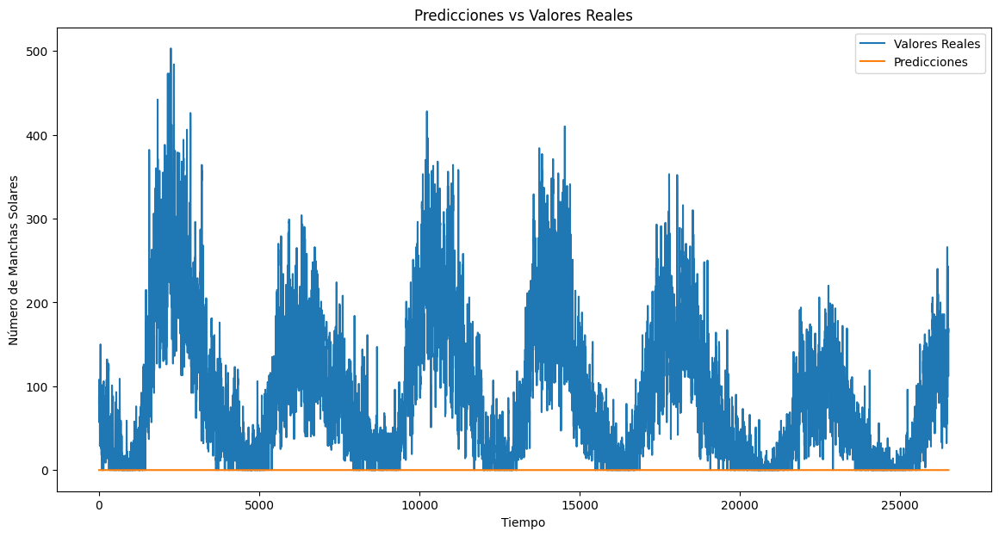

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

Se han truncado las últimas 5000 líneas del flujo de salida.
1/1 [==============================] - 0s 91ms/step


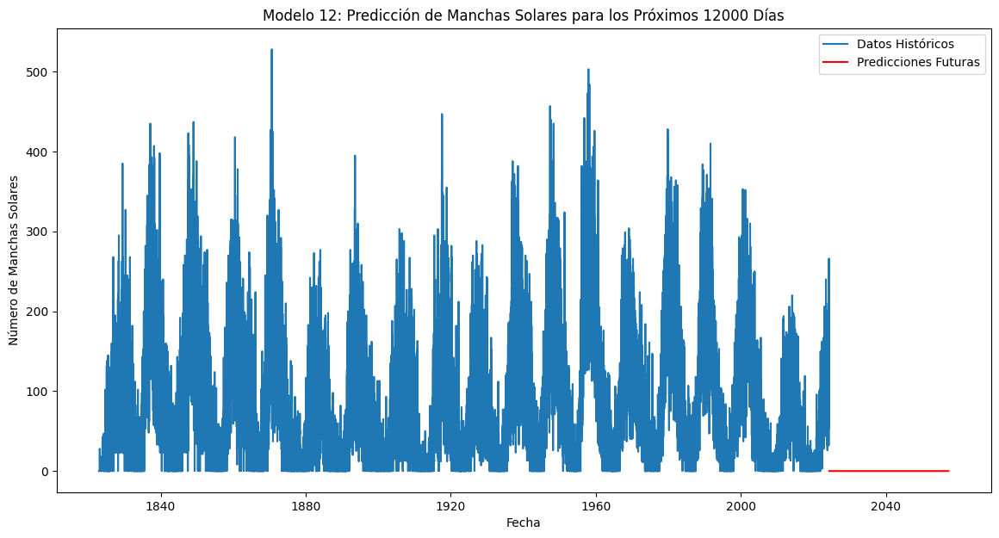

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Modelo 12: Predicción de Manchas Solares para los Próximos 12000 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                          0
2024-06-02                          0
2024-06-03                          0
2024-06-04                          0
2024-06-05                          0
...                               ...
2057-04-04                          0
2057-04-05                          0
2057-04-06                          0
2057-04-07                          0
2057-04-08                          0

[12000 rows x 1 columns]


In [ ]:
# Define la ruta completa para la carpeta y el archivo CSV
folder_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 12'
file_path = os.path.join(folder_path, 'Predicciones_100epocas.csv')

# Verifica si la carpeta existe, si no, créala
if not os.path.exists(folder_path):
    os.makedirs(folder_path)

# Asumiendo que df_predictions es tu DataFrame de predicciones
# Guarda el DataFrame en el archivo CSV especificado
df_predictions.to_csv(file_path)

# Verifica que el archivo se ha guardado correctamente
print(f"DataFrame guardado en: {file_path}")

DataFrame guardado en: /content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 12/Predicciones_100epocas.csv


In [ ]:
# Especificar la ruta en Google Drive con formato HDF5
drive_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 12/100epocas.h5'

# Crear la carpeta si no existe
os.makedirs(os.path.dirname(drive_path), exist_ok=True)

# Guardar el modelo en formato HDF5 en la carpeta especificada
model.save(drive_path)

print(f'Modelo guardado en formato HDF5 en la carpeta de Google Drive: {drive_path}')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Modelo guardado en formato HDF5 en la carpeta de Google Drive: /content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 12/100epocas.h5


'seq_length': 2921, 'n_lstm_layers': 1, 'lstm_units_0': 499, 'dropout_0': 0.5330500043357079, 'n_dense_layers': 3, 'dense_units_0': 184, 'dense_units_1': 193, 'dense_units_2': 55, 'lr': 0.0009157856286854513, 'optimizer': 'adam', 'batch_size': 77

##Modelo 13

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 3197

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=193, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.5447713374242567))

model.add(layers.Flatten())

model.add(layers.Dense(184, activation='relu'))
model.add(layers.Dense(173, activation='relu'))
model.add(layers.Dense(56, activation='relu'))
model.add(layers.Dense(1, activation='relu'))

# Compilación del modelo
optimizer = optimizers.Adam(learning_rate=0.0009986996798420785)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 3197, 193)         150540    
                                                                 
 dropout (Dropout)           (None, 3197, 193)         0         
                                                                 
 flatten (Flatten)           (None, 617021)            0         
                                                                 
 dense (Dense)               (None, 184)               113532048 
                                                                 
 dense_1 (Dense)             (None, 173)               32005     
                                                                 
 dense_2 (Dense)             (None, 56)                9744      
                                                                 
 dense_3 (Dense)             (None, 1)                 5

In [ ]:
# Configurar la detección temprana
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Entrenamiento del modelo
history = model.fit(X_train, y_train,
                    epochs=100,  # Número de épocas
                    batch_size=80,  # Tamaño de lote
                    verbose=1,  # Muestra el progreso
                    callbacks=[early_stopping],  # Detección temprana
                    validation_split=0.2)  # División para validación

Epoch 1/100
410/410 [==============================] - 75s 171ms/step - loss: 0.1228 - mae: 0.1653 - val_loss: 0.0391 - val_mae: 0.1466
Epoch 2/100
410/410 [==============================] - 69s 169ms/step - loss: 0.0434 - mae: 0.1524 - val_loss: 0.0391 - val_mae: 0.1466
Epoch 3/100
410/410 [==============================] - 69s 168ms/step - loss: 0.0434 - mae: 0.1524 - val_loss: 0.0391 - val_mae: 0.1466
Epoch 4/100
410/410 [==============================] - 69s 168ms/step - loss: 0.0434 - mae: 0.1524 - val_loss: 0.0391 - val_mae: 0.1466
Epoch 5/100
410/410 [==============================] - 69s 168ms/step - loss: 0.0434 - mae: 0.1524 - val_loss: 0.0391 - val_mae: 0.1466
Epoch 6/100
410/410 [==============================] - 69s 168ms/step - loss: 0.0434 - mae: 0.1524 - val_loss: 0.0391 - val_mae: 0.1466
Epoch 7/100
410/410 [==============================] - 69s 168ms/step - loss: 0.0434 - mae: 0.1524 - val_loss: 0.0391 - val_mae: 0.1466
Epoch 8/100
410/410 [===========================

In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.models import load_model


loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

820/820 [==============================] - 38s 46ms/step


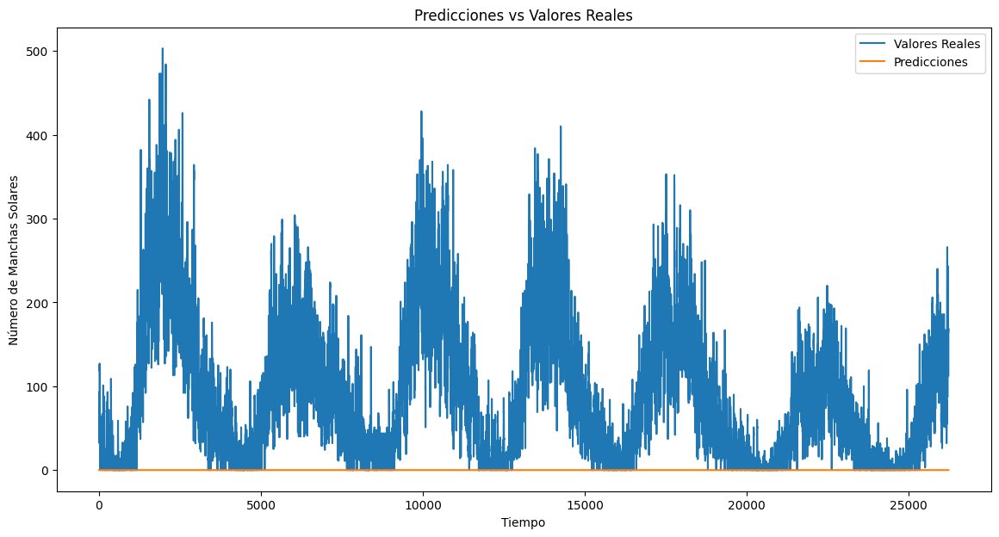

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

Se han truncado las últimas 5000 líneas del flujo de salida.
1/1 [==============================] - 0s 55ms/step


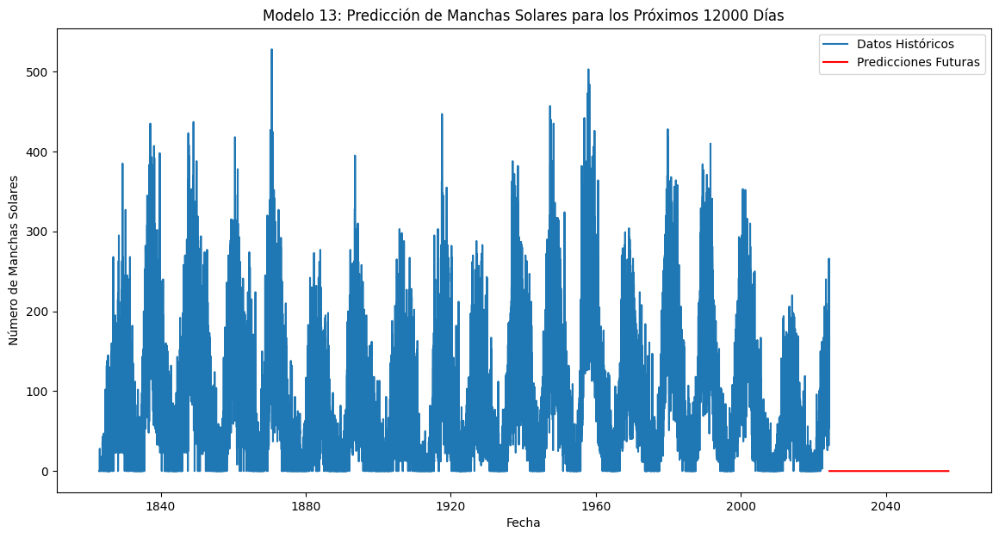

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Modelo 13: Predicción de Manchas Solares para los Próximos 12000 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                          0
2024-06-02                          0
2024-06-03                          0
2024-06-04                          0
2024-06-05                          0
...                               ...
2057-04-04                          0
2057-04-05                          0
2057-04-06                          0
2057-04-07                          0
2057-04-08                          0

[12000 rows x 1 columns]


In [ ]:
# Define la ruta completa para la carpeta y el archivo CSV
folder_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 13'
file_path = os.path.join(folder_path, 'Predicciones_100epocas.csv')

# Verifica si la carpeta existe, si no, créala
if not os.path.exists(folder_path):
    os.makedirs(folder_path)

# Asumiendo que df_predictions es tu DataFrame de predicciones
# Guarda el DataFrame en el archivo CSV especificado
df_predictions.to_csv(file_path)

# Verifica que el archivo se ha guardado correctamente
print(f"DataFrame guardado en: {file_path}")


DataFrame guardado en: /content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 13/Predicciones_100epocas.csv


In [ ]:
# Especificar la ruta en Google Drive con formato HDF5
drive_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 13/100epocas.h5'

# Crear la carpeta si no existe
os.makedirs(os.path.dirname(drive_path), exist_ok=True)

# Guardar el modelo en formato HDF5 en la carpeta especificada
model.save(drive_path)

print(f'Modelo guardado en formato HDF5 en la carpeta de Google Drive: {drive_path}')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Modelo guardado en formato HDF5 en la carpeta de Google Drive: /content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 13/100epocas.h5


'seq_length': 3197, 'n_lstm_layers': 1, 'lstm_units_0': 193, 'dropout_0': 0.5447713374242567, 'n_dense_layers': 3, 'dense_units_0': 184, 'dense_units_1': 173, 'dense_units_2': 56, 'lr': 0.0009986996798420785, 'optimizer': 'adam', 'batch_size': 80

##Modelo 14

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 2543

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=478, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.5398396437538373))

model.add(layers.Flatten())

model.add(layers.Dense(175, activation='relu'))
model.add(layers.Dense(216, activation='relu'))
model.add(layers.Dense(133, activation='relu'))
model.add(layers.Dense(1, activation='relu'))

# Compilación del modelo
optimizer = optimizers.Adam(learning_rate=0.0003710652315411262)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_11 (LSTM)              (None, 2543, 478)         917760    
                                                                 
 dropout_11 (Dropout)        (None, 2543, 478)         0         
                                                                 
 flatten_7 (Flatten)         (None, 1215554)           0         
                                                                 
 dense_26 (Dense)            (None, 175)               212722125 
                                                                 
 dense_27 (Dense)            (None, 216)               38016     
                                                                 
 dense_28 (Dense)            (None, 133)               28861     
                                                                 
 dense_29 (Dense)            (None, 1)                

In [ ]:
# Entrenamiento del modelo con verbose=1 para ver el progreso
history = model.fit(X_train, y_train,
                    epochs=10,
                    batch_size=77,
                    verbose=1,  # Configuración para ver el progreso
                    validation_split=0.2)

Epoch 1/10
433/433 [==============================] - 85s 188ms/step - loss: 0.0420 - mae: 0.0727 - val_loss: 0.0052 - val_mae: 0.0520
Epoch 2/10
433/433 [==============================] - 81s 186ms/step - loss: 0.0050 - mae: 0.0515 - val_loss: 0.0045 - val_mae: 0.0490
Epoch 3/10
433/433 [==============================] - 81s 186ms/step - loss: 0.0039 - mae: 0.0452 - val_loss: 0.0037 - val_mae: 0.0460
Epoch 4/10
433/433 [==============================] - 81s 186ms/step - loss: 0.0033 - mae: 0.0415 - val_loss: 0.0036 - val_mae: 0.0451
Epoch 5/10
433/433 [==============================] - 81s 186ms/step - loss: 0.0031 - mae: 0.0398 - val_loss: 0.0030 - val_mae: 0.0411
Epoch 6/10
433/433 [==============================] - 81s 187ms/step - loss: 0.0026 - mae: 0.0366 - val_loss: 0.0031 - val_mae: 0.0410
Epoch 7/10
433/433 [==============================] - 81s 186ms/step - loss: 0.0025 - mae: 0.0359 - val_loss: 0.0028 - val_mae: 0.0381
Epoch 8/10
433/433 [==============================] - 8

In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.models import load_model


loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

841/841 [==============================] - 45s 52ms/step


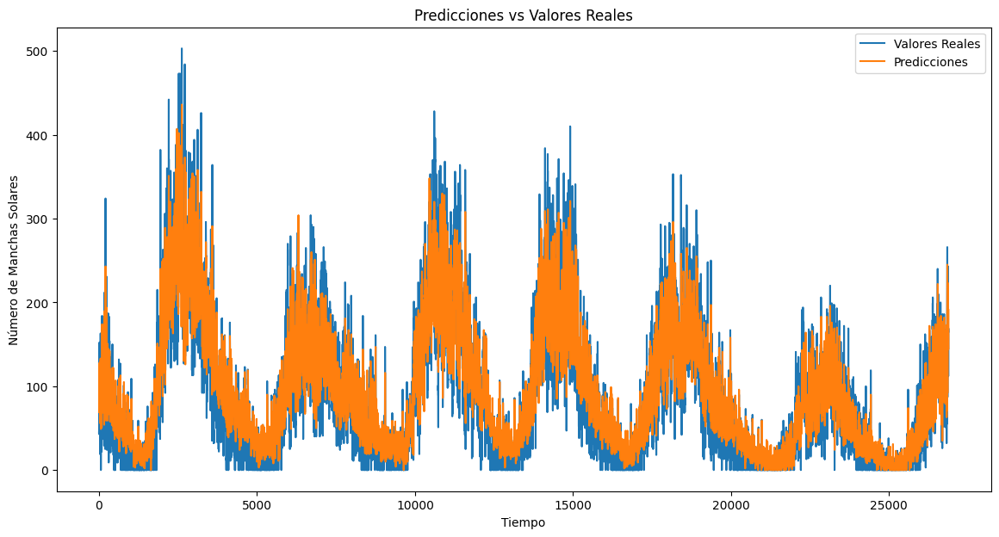

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

Se han truncado las últimas 5000 líneas del flujo de salida.
1/1 [==============================] - 0s 79ms/step


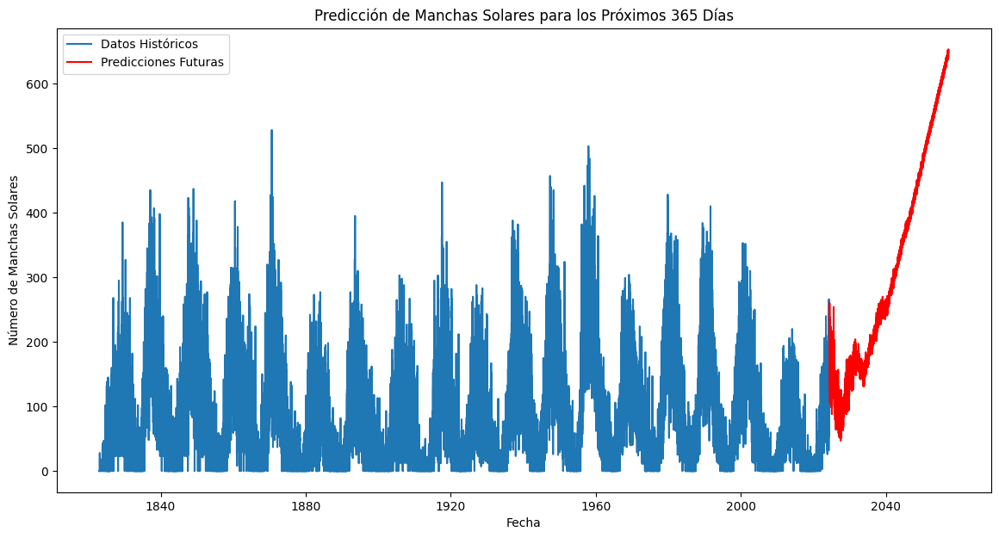

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicción de Manchas Solares para los Próximos 365 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                        188
2024-06-02                        187
2024-06-03                        184
2024-06-04                        181
2024-06-05                        176
...                               ...
2057-04-04                        652
2057-04-05                        652
2057-04-06                        650
2057-04-07                        649
2057-04-08                        648

[12000 rows x 1 columns]


'seq_length': 2543, 'n_lstm_layers': 1, 'lstm_units_0': 478, 'dropout_0': 0.5398396437538373, 'n_dense_layers': 3, 'dense_units_0': 175, 'dense_units_1': 216, 'dense_units_2': 133, 'lr': 0.0003710652315411262, 'optimizer': 'adam', 'batch_size': 77

##Modelo 15

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 2364

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=494, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.48902936689452375))

model.add(layers.Flatten())

model.add(layers.Dense(218, activation='relu'))
model.add(layers.Dense(242, activation='relu'))
model.add(layers.Dense(138, activation='relu'))
model.add(layers.Dense(1, activation='relu'))

# Compilación del modelo
optimizer = optimizers.Adam(learning_rate=0.00034570463278646446)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (None, 2364, 494)         980096    
                                                                 
 dropout_8 (Dropout)         (None, 2364, 494)         0         
                                                                 
 flatten_5 (Flatten)         (None, 1167816)           0         
                                                                 
 dense_20 (Dense)            (None, 218)               254584106 
                                                                 
 dense_21 (Dense)            (None, 242)               52998     
                                                                 
 dense_22 (Dense)            (None, 138)               33534     
                                                                 
 dense_23 (Dense)            (None, 1)                

In [ ]:

# Entrenamiento del modelo
history = model.fit(X_train, y_train,
                    epochs=60,  # Número de épocas
                    batch_size=75,  # Tamaño de lote
                    verbose=1,  # Muestra el progreso,
                    validation_split=0.2)  # División para validación

Epoch 1/60
446/446 [==============================] - 84s 182ms/step - loss: 0.0114 - mae: 0.0707 - val_loss: 0.0043 - val_mae: 0.0465
Epoch 2/60
446/446 [==============================] - 80s 180ms/step - loss: 0.0037 - mae: 0.0441 - val_loss: 0.0027 - val_mae: 0.0383
Epoch 3/60
446/446 [==============================] - 80s 180ms/step - loss: 0.0029 - mae: 0.0385 - val_loss: 0.0028 - val_mae: 0.0380
Epoch 4/60
446/446 [==============================] - 80s 180ms/step - loss: 0.0026 - mae: 0.0366 - val_loss: 0.0025 - val_mae: 0.0368
Epoch 5/60
446/446 [==============================] - 80s 180ms/step - loss: 0.0024 - mae: 0.0350 - val_loss: 0.0031 - val_mae: 0.0400
Epoch 6/60
446/446 [==============================] - 80s 180ms/step - loss: 0.0023 - mae: 0.0338 - val_loss: 0.0027 - val_mae: 0.0397
Epoch 7/60
446/446 [==============================] - 80s 180ms/step - loss: 0.0020 - mae: 0.0319 - val_loss: 0.0025 - val_mae: 0.0364
Epoch 8/60
446/446 [==============================] - 8

In [ ]:
# Guardar el modelo entrenado
model.save('model15_40.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.models import load_model


loaded_model = load_model("model15_40.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

846/846 [==============================] - 42s 50ms/step


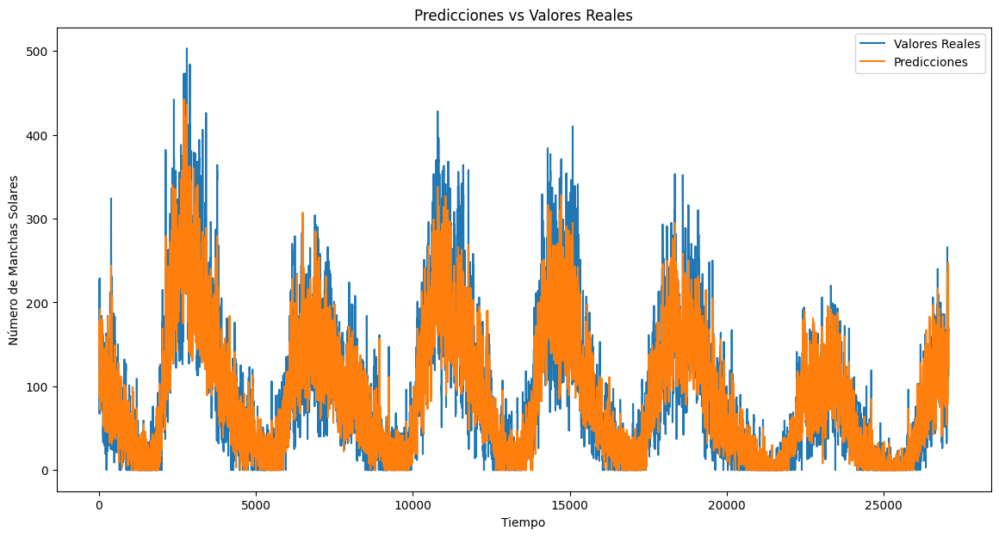

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

Se han truncado las últimas 5000 líneas del flujo de salida.
1/1 [==============================] - 0s 73ms/step


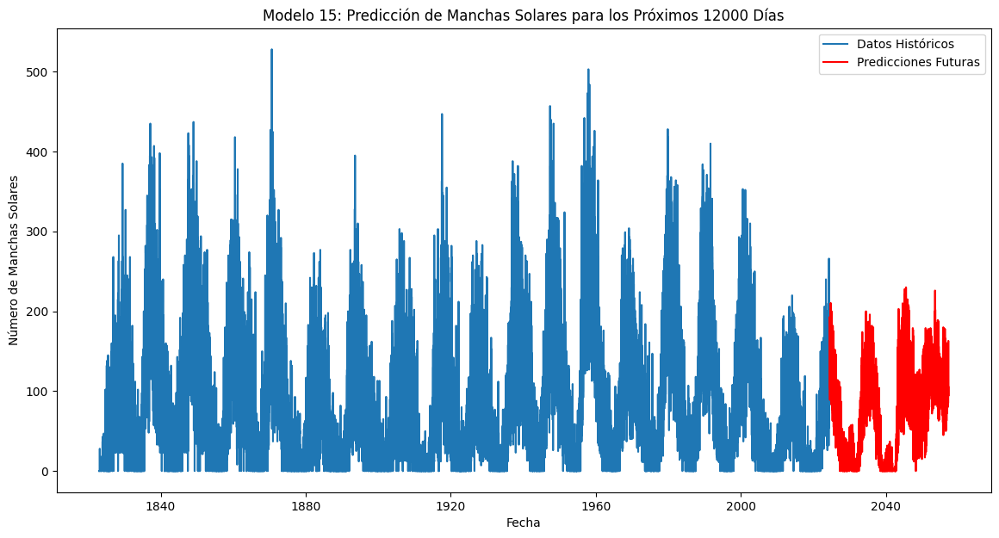

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Modelo 15: Predicción de Manchas Solares para los Próximos 12000 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                        159
2024-06-02                        163
2024-06-03                        154
2024-06-04                        144
2024-06-05                        137
...                               ...
2057-04-04                        101
2057-04-05                         95
2057-04-06                         94
2057-04-07                        100
2057-04-08                        105

[12000 rows x 1 columns]


In [ ]:
# Define la ruta completa para la carpeta y el archivo CSV
folder_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 15'
file_path = os.path.join(folder_path, 'Predicciones_100epocas.csv')

# Verifica si la carpeta existe, si no, créala
if not os.path.exists(folder_path):
    os.makedirs(folder_path)

# Asumiendo que df_predictions es tu DataFrame de predicciones
# Guarda el DataFrame en el archivo CSV especificado
df_predictions.to_csv(file_path)

# Verifica que el archivo se ha guardado correctamente
print(f"DataFrame guardado en: {file_path}")


DataFrame guardado en: /content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 15/Predicciones_100epocas.csv


In [ ]:
# Especificar la ruta en Google Drive con formato HDF5
drive_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 15/100epocas.h5'

# Crear la carpeta si no existe
os.makedirs(os.path.dirname(drive_path), exist_ok=True)

# Guardar el modelo en formato HDF5 en la carpeta especificada
model.save(drive_path)

print(f'Modelo guardado en formato HDF5 en la carpeta de Google Drive: {drive_path}')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Modelo guardado en formato HDF5 en la carpeta de Google Drive: /content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 15/100epocas.h5


'seq_length': 2364, 'n_lstm_layers': 1, 'lstm_units_0': 494, 'dropout_0': 0.48902936689452375, 'n_dense_layers': 3, 'dense_units_0': 218, 'dense_units_1': 242, 'dense_units_2': 138, 'lr': 0.00034570463278646446, 'optimizer': 'adam', 'batch_size': 75

##Modelo 16

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 2752

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=350, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.6238203716953836))

model.add(layers.Flatten())

model.add(layers.Dense(120, activation='relu'))
model.add(layers.Dense(203, activation='relu'))
model.add(layers.Dense(123, activation='relu'))
model.add(layers.Dense(1, activation='relu'))

# Compilación del modelo
optimizer = optimizers.Adam(learning_rate=0.0003549961205777824)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 2752, 350)         492800    
                                                                 
 dropout (Dropout)           (None, 2752, 350)         0         
                                                                 
 flatten (Flatten)           (None, 963200)            0         
                                                                 
 dense (Dense)               (None, 120)               115584120 
                                                                 
 dense_1 (Dense)             (None, 203)               24563     
                                                                 
 dense_2 (Dense)             (None, 123)               25092     
                                                                 
 dense_3 (Dense)             (None, 1)                 1

In [ ]:
# Entrenamiento del modelo con verbose=1 para ver el progreso
history = model.fit(X_train, y_train,
                    epochs=40,
                    batch_size=57,
                    verbose=1,  # Configuración para ver el progreso
                    validation_split=0.2)

Epoch 1/40
581/581 [==============================] - 84s 136ms/step - loss: 0.0690 - mae: 0.1599 - val_loss: 0.0388 - val_mae: 0.1460
Epoch 2/40
581/581 [==============================] - 78s 134ms/step - loss: 0.0435 - mae: 0.1530 - val_loss: 0.0388 - val_mae: 0.1460
Epoch 3/40
581/581 [==============================] - 78s 134ms/step - loss: 0.0435 - mae: 0.1530 - val_loss: 0.0388 - val_mae: 0.1460
Epoch 4/40
581/581 [==============================] - 78s 134ms/step - loss: 0.0435 - mae: 0.1530 - val_loss: 0.0388 - val_mae: 0.1460
Epoch 5/40
581/581 [==============================] - 78s 134ms/step - loss: 0.0435 - mae: 0.1530 - val_loss: 0.0388 - val_mae: 0.1460
Epoch 6/40
581/581 [==============================] - 78s 134ms/step - loss: 0.0435 - mae: 0.1530 - val_loss: 0.0388 - val_mae: 0.1460
Epoch 7/40
581/581 [==============================] - 78s 134ms/step - loss: 0.0435 - mae: 0.1530 - val_loss: 0.0388 - val_mae: 0.1460
Epoch 8/40
581/581 [==============================] - 7

In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.models import load_model


loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

834/834 [==============================] - 44s 52ms/step


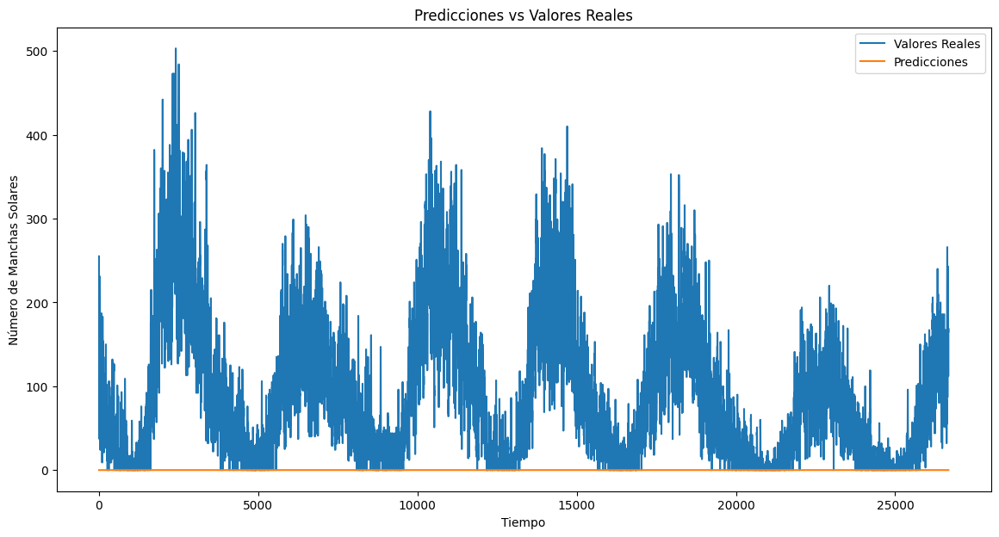

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

Se han truncado las últimas 5000 líneas del flujo de salida.
1/1 [==============================] - 0s 78ms/step


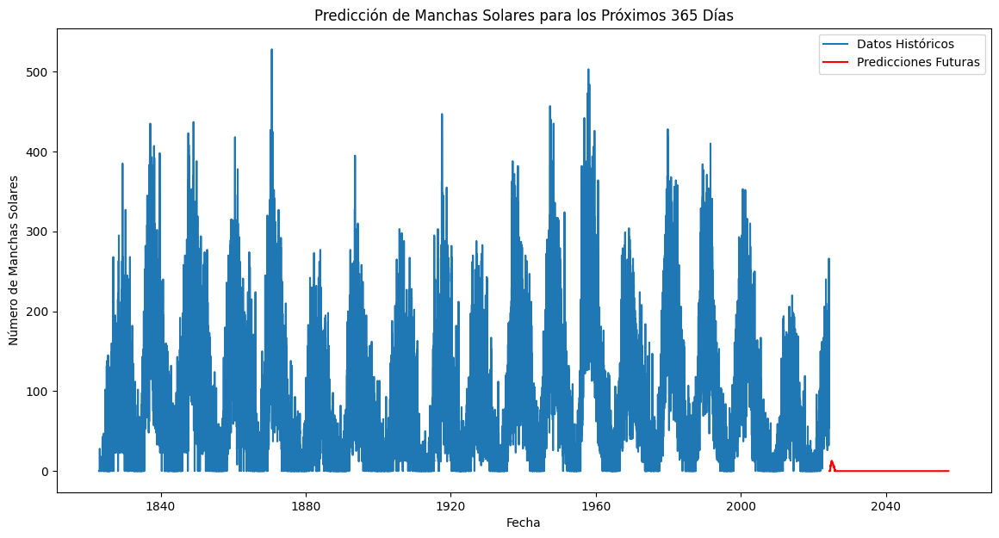

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicción de Manchas Solares para los Próximos 365 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                          0
2024-06-02                          0
2024-06-03                          0
2024-06-04                          0
2024-06-05                          0
...                               ...
2057-04-04                          0
2057-04-05                          0
2057-04-06                          0
2057-04-07                          0
2057-04-08                          0

[12000 rows x 1 columns]


'seq_length': 2752, 'n_lstm_layers': 1, 'lstm_units_0': 350, 'dropout_0': 0.6238203716953836, 'n_dense_layers': 3, 'dense_units_0': 120, 'dense_units_1': 203, 'dense_units_2': 123, 'lr': 0.0003549961205777824, 'optimizer': 'adam', 'batch_size': 57

##Modelo 17

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 2413

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=498, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.3628880513268631))

model.add(layers.Flatten())

model.add(layers.Dense(178, activation='relu'))
model.add(layers.Dense(212, activation='relu'))
model.add(layers.Dense(99, activation='relu'))
model.add(layers.Dense(1, activation='relu'))

# Compilación del modelo
optimizer = optimizers.Adam(learning_rate=0.00041527919575733954)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

In [ ]:
# Entrenamiento del modelo con verbose=1 para ver el progreso
history = model.fit(X_train, y_train,
                    epochs=10,
                    batch_size=113,
                    verbose=1,  # Configuración para ver el progreso
                    validation_split=0.2)

In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

In [ ]:
from keras.models import load_model


loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicción de Manchas Solares para los Próximos 365 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

'seq_length': 2413, 'n_lstm_layers': 1, 'lstm_units_0': 498, 'dropout_0': 0.3628880513268631, 'n_dense_layers': 3, 'dense_units_0': 178, 'dense_units_1': 212, 'dense_units_2': 99, 'lr': 0.00041527919575733954, 'optimizer': 'adam', 'batch_size': 113

##Modelo 18

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 3324

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=209, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.5253833265253709))

model.add(layers.Flatten())

model.add(layers.Dense(252, activation='relu'))
model.add(layers.Dense(158, activation='relu'))
model.add(layers.Dense(213, activation='relu'))
model.add(layers.Dense(1, activation='relu'))

# Compilación del modelo
optimizer = optimizers.Adam(learning_rate=0.00017539282289836465)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 3324, 209)         176396    
                                                                 
 dropout_1 (Dropout)         (None, 3324, 209)         0         
                                                                 
 flatten_1 (Flatten)         (None, 694716)            0         
                                                                 
 dense_4 (Dense)             (None, 252)               175068684 
                                                                 
 dense_5 (Dense)             (None, 158)               39974     
                                                                 
 dense_6 (Dense)             (None, 213)               33867     
                                                                 
 dense_7 (Dense)             (None, 1)                

In [ ]:
# Configurar la detección temprana
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Entrenamiento del modelo
history = model.fit(X_train, y_train,
                    epochs=100,  # Número de épocas
                    batch_size=100,  # Tamaño de lote
                    verbose=1,  # Muestra el progreso
                    callbacks=[early_stopping],  # Detección temprana
                    validation_split=0.2)  # División para validación

Epoch 1/100
327/327 [==============================] - 76s 222ms/step - loss: 0.0106 - mae: 0.0662 - val_loss: 0.0048 - val_mae: 0.0504
Epoch 2/100
327/327 [==============================] - 71s 217ms/step - loss: 0.0052 - mae: 0.0522 - val_loss: 0.0074 - val_mae: 0.0686
Epoch 3/100
327/327 [==============================] - 71s 218ms/step - loss: 0.0041 - mae: 0.0467 - val_loss: 0.0043 - val_mae: 0.0471
Epoch 4/100
327/327 [==============================] - 71s 218ms/step - loss: 0.0037 - mae: 0.0439 - val_loss: 0.0033 - val_mae: 0.0417
Epoch 5/100
327/327 [==============================] - 71s 217ms/step - loss: 0.0032 - mae: 0.0410 - val_loss: 0.0033 - val_mae: 0.0417
Epoch 6/100
327/327 [==============================] - 72s 219ms/step - loss: 0.0029 - mae: 0.0389 - val_loss: 0.0030 - val_mae: 0.0407
Epoch 7/100
327/327 [==============================] - 72s 219ms/step - loss: 0.0026 - mae: 0.0368 - val_loss: 0.0030 - val_mae: 0.0397
Epoch 8/100
327/327 [===========================

In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.models import load_model


loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

816/816 [==============================] - 40s 48ms/step


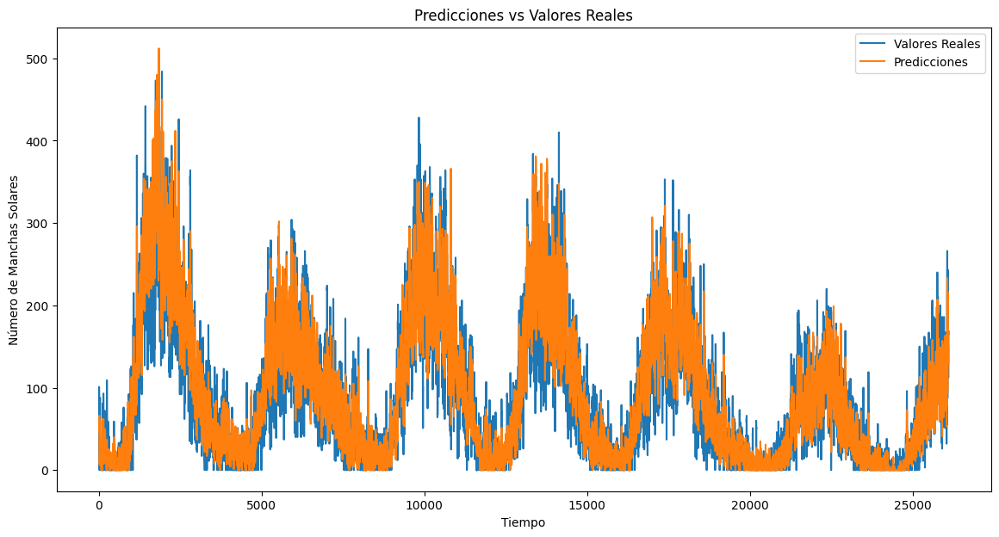

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

Se han truncado las últimas 5000 líneas del flujo de salida.
1/1 [==============================] - 0s 65ms/step


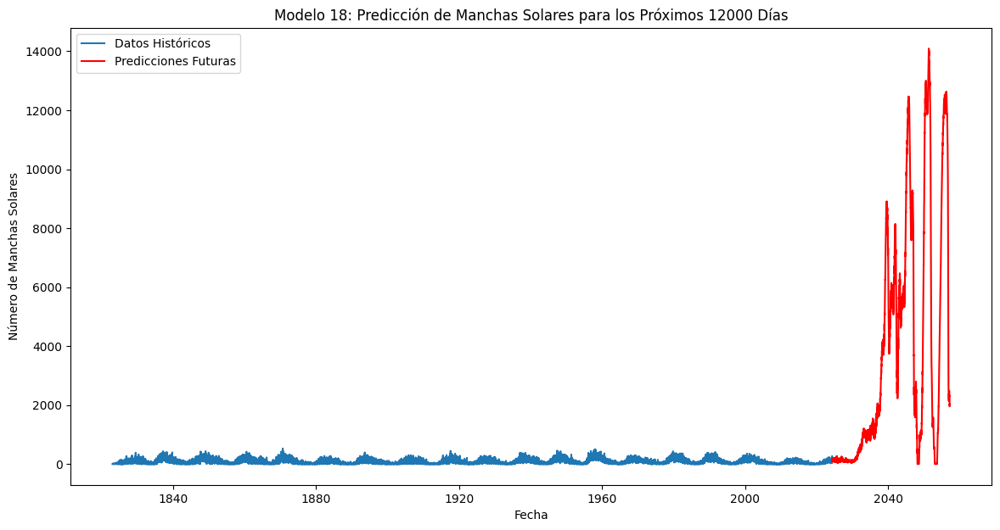

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Modelo 18: Predicción de Manchas Solares para los Próximos 12000 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                        149
2024-06-02                        136
2024-06-03                        117
2024-06-04                         99
2024-06-05                         86
...                               ...
2057-04-04                       2047
2057-04-05                       2042
2057-04-06                       2033
2057-04-07                       2020
2057-04-08                       2003

[12000 rows x 1 columns]


In [ ]:
# Define la ruta completa para la carpeta y el archivo CSV
folder_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 18'
file_path = os.path.join(folder_path, 'Predicciones_100epocas.csv')

# Verifica si la carpeta existe, si no, créala
if not os.path.exists(folder_path):
    os.makedirs(folder_path)

# Asumiendo que df_predictions es tu DataFrame de predicciones
# Guarda el DataFrame en el archivo CSV especificado
df_predictions.to_csv(file_path)

# Verifica que el archivo se ha guardado correctamente
print(f"DataFrame guardado en: {file_path}")


DataFrame guardado en: /content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 18/Predicciones_100epocas.csv


In [ ]:
# Especificar la ruta en Google Drive con formato HDF5
drive_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 18/100epocas.h5'

# Crear la carpeta si no existe
os.makedirs(os.path.dirname(drive_path), exist_ok=True)

# Guardar el modelo en formato HDF5 en la carpeta especificada
model.save(drive_path)

print(f'Modelo guardado en formato HDF5 en la carpeta de Google Drive: {drive_path}')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Modelo guardado en formato HDF5 en la carpeta de Google Drive: /content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 18/100epocas.h5


'seq_length': 3324, 'n_lstm_layers': 1, 'lstm_units_0': 209, 'dropout_0': 0.5253833265253709, 'n_dense_layers': 3, 'dense_units_0': 252, 'dense_units_1': 158, 'dense_units_2': 213, 'lr': 0.00017539282289836465, 'optimizer': 'adam', 'batch_size': 100

##Modelo 19

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 261

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=282, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.6968113293713021))

model.add(layers.Flatten())

model.add(layers.Dense(212, activation='relu'))
model.add(layers.Dense(217, activation='relu'))
model.add(layers.Dense(85, activation='relu'))
model.add(layers.Dense(1, activation='relu'))

# Compilación del modelo
optimizer = optimizers.Adam(learning_rate=0.0006289983672347829)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (None, 261, 282)          320352    
                                                                 
 dropout_4 (Dropout)         (None, 261, 282)          0         
                                                                 
 flatten_4 (Flatten)         (None, 73602)             0         
                                                                 
 dense_16 (Dense)            (None, 212)               15603836  
                                                                 
 dense_17 (Dense)            (None, 217)               46221     
                                                                 
 dense_18 (Dense)            (None, 85)                18530     
                                                                 
 dense_19 (Dense)            (None, 1)                

In [ ]:
# Entrenamiento del modelo con verbose=1 para ver el progreso
history = model.fit(X_train, y_train,
                    epochs=20,
                    batch_size=54,
                    verbose=1,  # Configuración para ver el progreso
                    validation_split=0.2)

Epoch 1/20
651/651 [==============================] - 15s 18ms/step - loss: 0.0047 - mae: 0.0477 - val_loss: 0.0024 - val_mae: 0.0357
Epoch 2/20
651/651 [==============================] - 11s 17ms/step - loss: 0.0032 - mae: 0.0398 - val_loss: 0.0039 - val_mae: 0.0443
Epoch 3/20
651/651 [==============================] - 11s 17ms/step - loss: 0.0029 - mae: 0.0379 - val_loss: 0.0023 - val_mae: 0.0337
Epoch 4/20
651/651 [==============================] - 11s 17ms/step - loss: 0.0028 - mae: 0.0372 - val_loss: 0.0018 - val_mae: 0.0320
Epoch 5/20
651/651 [==============================] - 11s 17ms/step - loss: 0.0028 - mae: 0.0367 - val_loss: 0.0021 - val_mae: 0.0317
Epoch 6/20
651/651 [==============================] - 11s 17ms/step - loss: 0.0027 - mae: 0.0360 - val_loss: 0.0018 - val_mae: 0.0324
Epoch 7/20
651/651 [==============================] - 11s 17ms/step - loss: 0.0027 - mae: 0.0356 - val_loss: 0.0016 - val_mae: 0.0302
Epoch 8/20
651/651 [==============================] - 11s 17ms

In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

In [ ]:
from keras.models import load_model


loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

Se han truncado las últimas 5000 líneas del flujo de salida.
1/1 [==============================] - 0s 25ms/step


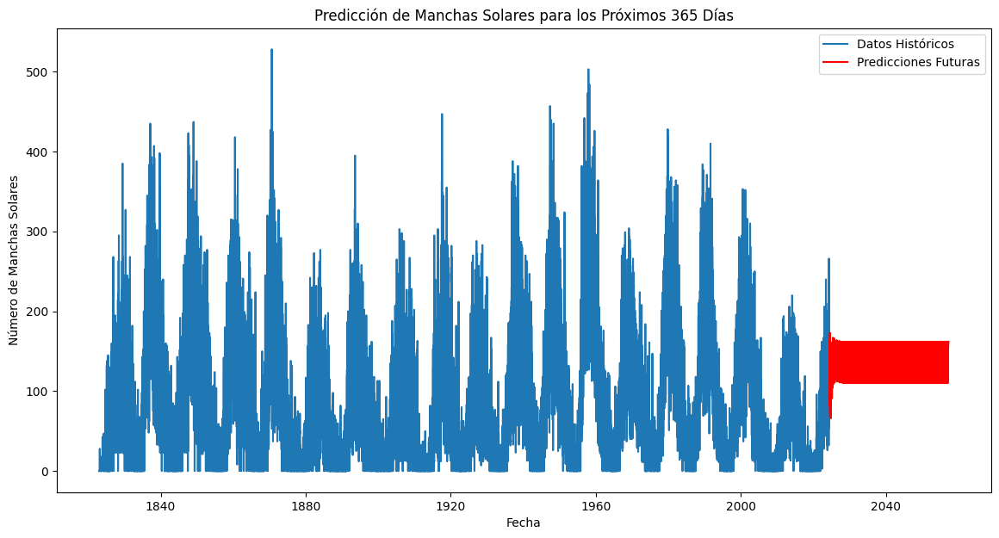

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicción de Manchas Solares para los Próximos 365 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                        165
2024-06-02                        160
2024-06-03                        152
2024-06-04                        143
2024-06-05                        130
...                               ...
2057-04-04                        161
2057-04-05                        161
2057-04-06                        162
2057-04-07                        162
2057-04-08                        162

[12000 rows x 1 columns]


'seq_length': 261, 'n_lstm_layers': 1, 'lstm_units_0': 282, 'dropout_0': 0.6968113293713021, 'n_dense_layers': 3, 'dense_units_0': 212, 'dense_units_1': 217, 'dense_units_2': 85, 'lr': 0.0006289983672347829, 'optimizer': 'adam', 'batch_size': 54

##Modelo 20

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 2580

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=22, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.6281331310357341))

model.add(layers.LSTM(units=484, return_sequences=True))
model.add(layers.Dropout(0.11027197935314159))

model.add(layers.Flatten())

model.add(layers.Dense(140, activation='relu'))
model.add(layers.Dense(249, activation='relu'))
model.add(layers.Dense(181, activation='relu'))
model.add(layers.Dense(1, activation='relu'))

# Compilación del modelo
optimizer = optimizers.Adam(learning_rate=0.0001901624633043916)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 2580, 22)          2112      
                                                                 
 dropout (Dropout)           (None, 2580, 22)          0         
                                                                 
 lstm_1 (LSTM)               (None, 2580, 484)         981552    
                                                                 
 dropout_1 (Dropout)         (None, 2580, 484)         0         
                                                                 
 flatten (Flatten)           (None, 1248720)           0         
                                                                 
 dense (Dense)               (None, 140)               174820940 
                                                                 
 dense_1 (Dense)             (None, 249)               3

In [ ]:
# Configurar la detección temprana
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Entrenamiento del modelo
history = model.fit(X_train, y_train,
                    epochs=100,  # Número de épocas
                    batch_size=154,  # Tamaño de lote
                    verbose=1,  # Muestra el progreso
                    callbacks=[early_stopping],  # Detección temprana
                    validation_split=0.2)  # División para validación

Epoch 1/100
216/216 [==============================] - 64s 264ms/step - loss: 0.0237 - mae: 0.0767 - val_loss: 0.0069 - val_mae: 0.0590
Epoch 2/100
216/216 [==============================] - 55s 254ms/step - loss: 0.0065 - mae: 0.0588 - val_loss: 0.0059 - val_mae: 0.0554
Epoch 3/100
216/216 [==============================] - 55s 254ms/step - loss: 0.0057 - mae: 0.0554 - val_loss: 0.0058 - val_mae: 0.0569
Epoch 4/100
216/216 [==============================] - 54s 252ms/step - loss: 0.0052 - mae: 0.0525 - val_loss: 0.0063 - val_mae: 0.0558
Epoch 5/100
216/216 [==============================] - 55s 254ms/step - loss: 0.0046 - mae: 0.0493 - val_loss: 0.0058 - val_mae: 0.0548
Epoch 6/100
216/216 [==============================] - 54s 252ms/step - loss: 0.0041 - mae: 0.0464 - val_loss: 0.0061 - val_mae: 0.0565
Epoch 7/100
216/216 [==============================] - 55s 253ms/step - loss: 0.0036 - mae: 0.0439 - val_loss: 0.0063 - val_mae: 0.0583
Epoch 8/100
216/216 [===========================

In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.models import load_model


loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

839/839 [==============================] - 63s 75ms/step


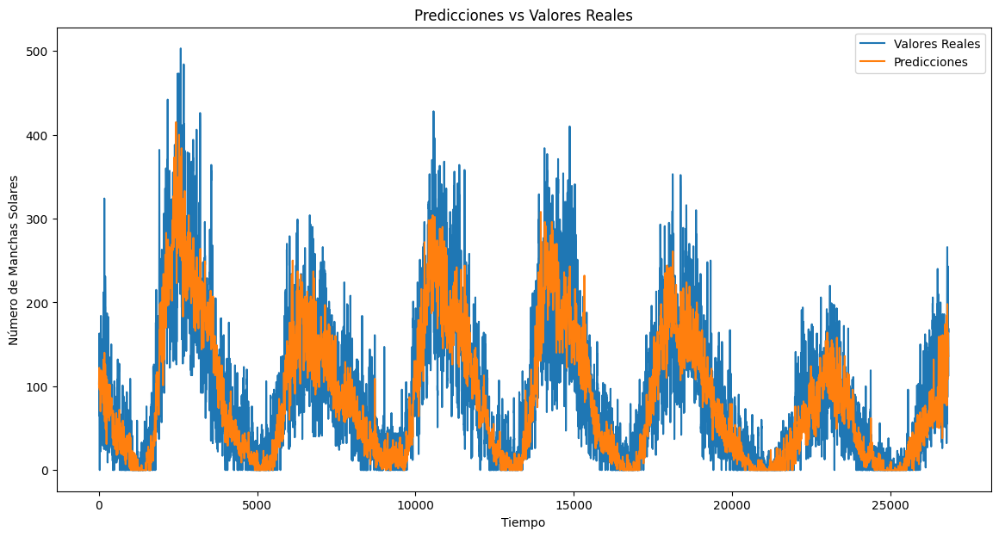

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

Se han truncado las últimas 5000 líneas del flujo de salida.
1/1 [==============================] - 0s 109ms/step


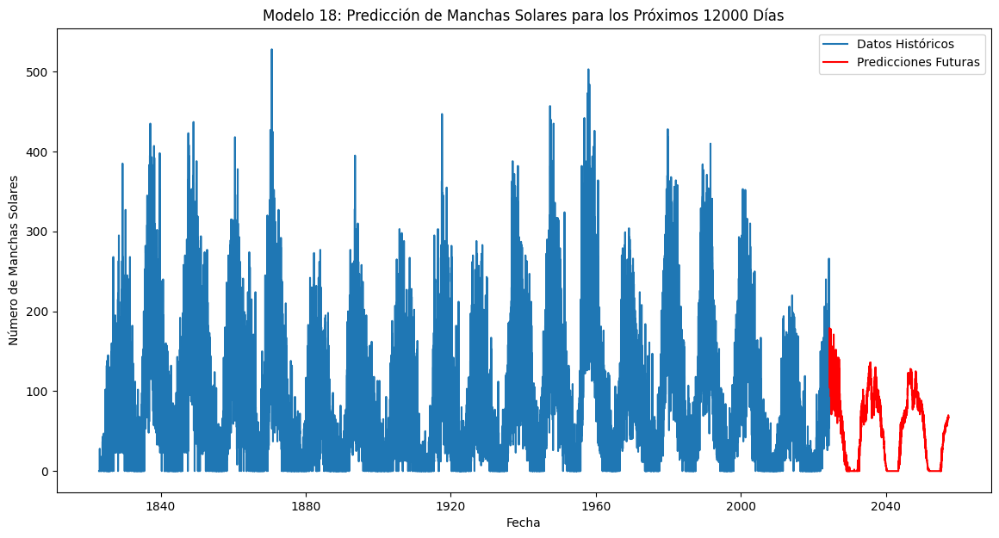

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Modelo 18: Predicción de Manchas Solares para los Próximos 12000 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                        137
2024-06-02                        135
2024-06-03                        132
2024-06-04                        129
2024-06-05                        126
...                               ...
2057-04-04                         66
2057-04-05                         66
2057-04-06                         66
2057-04-07                         66
2057-04-08                         67

[12000 rows x 1 columns]


In [ ]:
# Define la ruta completa para la carpeta y el archivo CSV
folder_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 20'
file_path = os.path.join(folder_path, 'Predicciones_100epocas.csv')

# Verifica si la carpeta existe, si no, créala
if not os.path.exists(folder_path):
    os.makedirs(folder_path)

# Asumiendo que df_predictions es tu DataFrame de predicciones
# Guarda el DataFrame en el archivo CSV especificado
df_predictions.to_csv(file_path)

# Verifica que el archivo se ha guardado correctamente
print(f"DataFrame guardado en: {file_path}")

DataFrame guardado en: /content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 20/Predicciones_100epocas.csv


In [ ]:
# Especificar la ruta en Google Drive con formato HDF5
drive_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 20/100epocas.h5'

# Crear la carpeta si no existe
os.makedirs(os.path.dirname(drive_path), exist_ok=True)

# Guardar el modelo en formato HDF5 en la carpeta especificada
model.save(drive_path)

print(f'Modelo guardado en formato HDF5 en la carpeta de Google Drive: {drive_path}')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Modelo guardado en formato HDF5 en la carpeta de Google Drive: /content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 20/100epocas.h5


'seq_length': 2580, 'n_lstm_layers': 2, 'lstm_units_0': 22, 'dropout_0': 0.6281331310357341, 'lstm_units_1': 484, 'dropout_1': 0.11027197935314159, 'n_dense_layers': 3, 'dense_units_0': 140, 'dense_units_1': 249, 'dense_units_2': 181, 'lr': 0.0001901624633043916, 'optimizer': 'adam', 'batch_size': 154

##Modelo 21

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 1362

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=356, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.32418831611019877))

model.add(layers.LSTM(units=421, return_sequences=True))
model.add(layers.Dropout(0.6526096603490168))

model.add(layers.Flatten())

model.add(layers.Dense(113, activation='relu'))
model.add(layers.Dense(181, activation='relu'))
model.add(layers.Dense(1, activation='relu'))

# Compilación del modelo
optimizer = optimizers.Adam(learning_rate=0.0005659521446432604)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_2 (LSTM)               (None, 1362, 356)         509792    
                                                                 
 dropout_2 (Dropout)         (None, 1362, 356)         0         
                                                                 
 lstm_3 (LSTM)               (None, 1362, 421)         1310152   
                                                                 
 dropout_3 (Dropout)         (None, 1362, 421)         0         
                                                                 
 flatten_2 (Flatten)         (None, 573402)            0         
                                                                 
 dense_8 (Dense)             (None, 113)               64794539  
                                                                 
 dense_9 (Dense)             (None, 181)              

In [ ]:
# Entrenamiento del modelo con verbose=1 para ver el progreso
history = model.fit(X_train, y_train,
                    epochs=10,
                    batch_size=16,
                    verbose=1,  # Configuración para ver el progreso
                    validation_split=0.2)

Epoch 1/10
2139/2139 [==============================] - 246s 113ms/step - loss: 0.0444 - mae: 0.1555 - val_loss: 0.0379 - val_mae: 0.1444
Epoch 2/10
2139/2139 [==============================] - 242s 113ms/step - loss: 0.0439 - mae: 0.1551 - val_loss: 0.0379 - val_mae: 0.1444
Epoch 3/10
2139/2139 [==============================] - 242s 113ms/step - loss: 0.0439 - mae: 0.1551 - val_loss: 0.0379 - val_mae: 0.1444
Epoch 4/10
2139/2139 [==============================] - 242s 113ms/step - loss: 0.0439 - mae: 0.1551 - val_loss: 0.0379 - val_mae: 0.1444
Epoch 5/10
2139/2139 [==============================] - 242s 113ms/step - loss: 0.0439 - mae: 0.1551 - val_loss: 0.0379 - val_mae: 0.1444
Epoch 6/10
2139/2139 [==============================] - 243s 113ms/step - loss: 0.0439 - mae: 0.1551 - val_loss: 0.0379 - val_mae: 0.1444
Epoch 7/10
2139/2139 [==============================] - 242s 113ms/step - loss: 0.0439 - mae: 0.1551 - val_loss: 0.0379 - val_mae: 0.1444
Epoch 8/10
2139/2139 [============

In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.models import load_model


loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

877/877 [==============================] - 43s 48ms/step


In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

Se han truncado las últimas 5000 líneas del flujo de salida.
1/1 [==============================] - 0s 79ms/step


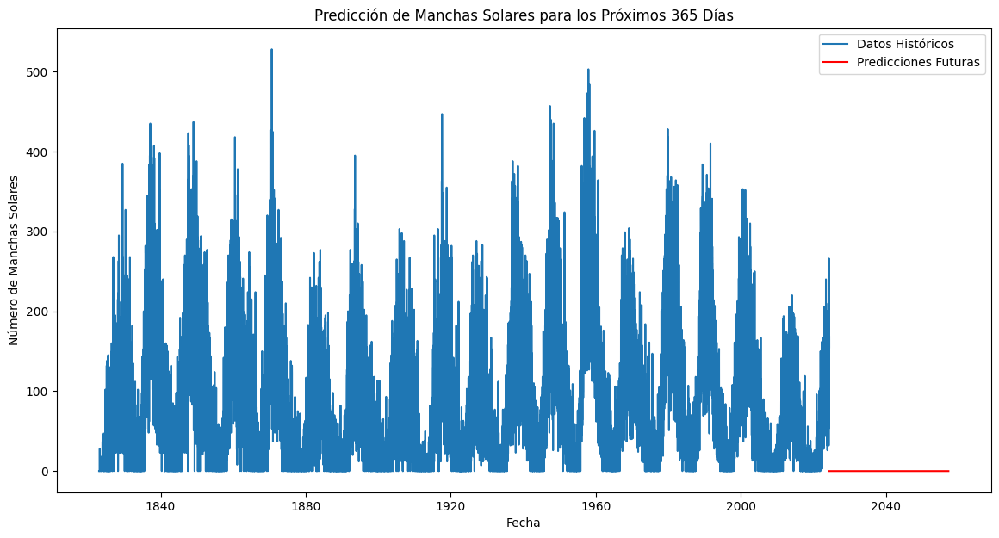

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicción de Manchas Solares para los Próximos 365 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                          0
2024-06-02                          0
2024-06-03                          0
2024-06-04                          0
2024-06-05                          0
...                               ...
2057-04-04                          0
2057-04-05                          0
2057-04-06                          0
2057-04-07                          0
2057-04-08                          0

[12000 rows x 1 columns]


'seq_length': 1362, 'n_lstm_layers': 2, 'lstm_units_0': 356, 'dropout_0': 0.32418831611019877, 'lstm_units_1': 421, 'dropout_1': 0.6526096603490168, 'n_dense_layers': 2, 'dense_units_0': 113, 'dense_units_1': 181, 'lr': 0.0005659521446432604, 'optimizer': 'adam', 'batch_size': 16

##Modelo 22

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 3398

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=191, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.4965118124425943))

model.add(layers.Flatten())

model.add(layers.Dense(250, activation='relu'))
model.add(layers.Dense(147, activation='relu'))
model.add(layers.Dense(245, activation='relu'))
model.add(layers.Dense(1, activation='relu'))

# Compilación del modelo
optimizer = optimizers.Adam(learning_rate= 0.00021588107497472105)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_7 (LSTM)               (None, 3398, 191)         147452    
                                                                 
 dropout_7 (Dropout)         (None, 3398, 191)         0         
                                                                 
 flatten_5 (Flatten)         (None, 649018)            0         
                                                                 
 dense_20 (Dense)            (None, 250)               162254750 
                                                                 
 dense_21 (Dense)            (None, 147)               36897     
                                                                 
 dense_22 (Dense)            (None, 245)               36260     
                                                                 
 dense_23 (Dense)            (None, 1)                

In [ ]:
# Configurar la detección temprana
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Entrenamiento del modelo
history = model.fit(X_train, y_train,
                    epochs=100,  # Número de épocas
                    batch_size=89,  # Tamaño de lote
                    verbose=1,  # Muestra el progreso
                    callbacks=[early_stopping],  # Detección temprana
                    validation_split=0.2)  # División para validación

Epoch 1/100
367/367 [==============================] - 77s 202ms/step - loss: 0.0254 - mae: 0.0705 - val_loss: 0.0080 - val_mae: 0.0648
Epoch 2/100
367/367 [==============================] - 72s 197ms/step - loss: 0.0057 - mae: 0.0551 - val_loss: 0.0046 - val_mae: 0.0485
Epoch 3/100
367/367 [==============================] - 72s 196ms/step - loss: 0.0045 - mae: 0.0490 - val_loss: 0.0039 - val_mae: 0.0471
Epoch 4/100
367/367 [==============================] - 72s 195ms/step - loss: 0.0041 - mae: 0.0464 - val_loss: 0.0056 - val_mae: 0.0539
Epoch 5/100
367/367 [==============================] - 72s 196ms/step - loss: 0.0039 - mae: 0.0452 - val_loss: 0.0036 - val_mae: 0.0434
Epoch 6/100
367/367 [==============================] - 71s 195ms/step - loss: 0.0034 - mae: 0.0426 - val_loss: 0.0041 - val_mae: 0.0465
Epoch 7/100
367/367 [==============================] - 72s 196ms/step - loss: 0.0033 - mae: 0.0414 - val_loss: 0.0034 - val_mae: 0.0435
Epoch 8/100
367/367 [===========================

In [ ]:
# Guardar el modelo entrenado
model.save('model22.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.models import load_model


loaded_model = load_model("model22.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

814/814 [==============================] - 40s 49ms/step


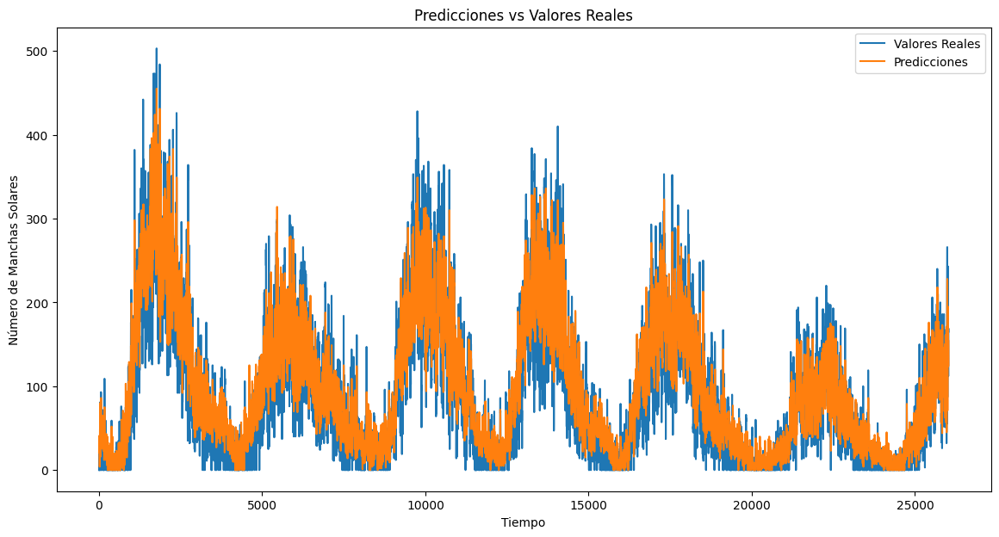

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

Se han truncado las últimas 5000 líneas del flujo de salida.
1/1 [==============================] - 0s 55ms/step


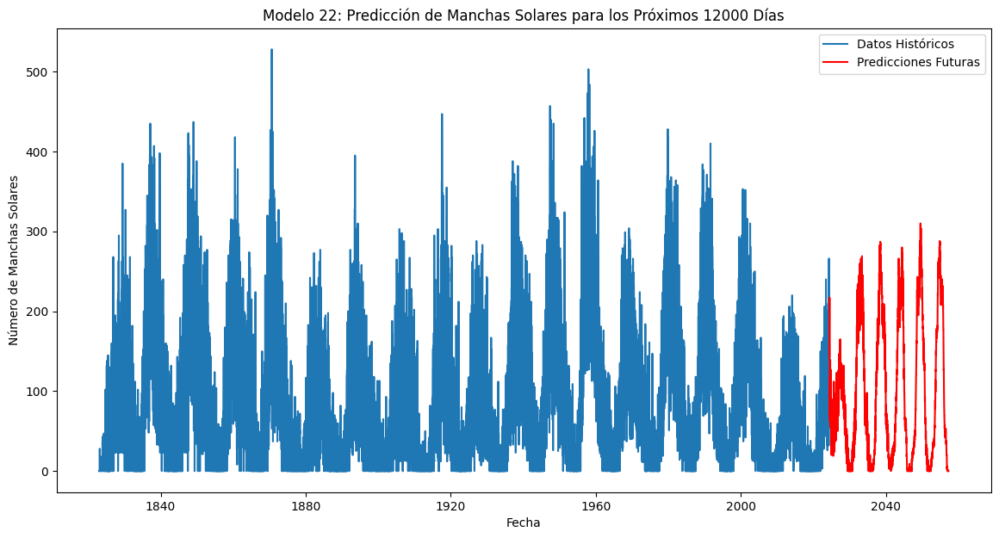

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Modelo 22: Predicción de Manchas Solares para los Próximos 12000 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                        160
2024-06-02                        159
2024-06-03                        154
2024-06-04                        148
2024-06-05                        145
...                               ...
2057-04-04                          0
2057-04-05                          0
2057-04-06                          0
2057-04-07                          0
2057-04-08                          0

[12000 rows x 1 columns]


In [ ]:
# Define la ruta completa para la carpeta y el archivo CSV
folder_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 22'
file_path = os.path.join(folder_path, 'Predicciones_100epocas.csv')

# Verifica si la carpeta existe, si no, créala
if not os.path.exists(folder_path):
    os.makedirs(folder_path)

# Asumiendo que df_predictions es tu DataFrame de predicciones
# Guarda el DataFrame en el archivo CSV especificado
df_predictions.to_csv(file_path)

# Verifica que el archivo se ha guardado correctamente
print(f"DataFrame guardado en: {file_path}")

DataFrame guardado en: /content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 22/Predicciones_100epocas.csv


In [ ]:
# Especificar la ruta en Google Drive con formato HDF5
drive_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 22/100epocas.h5'

# Crear la carpeta si no existe
os.makedirs(os.path.dirname(drive_path), exist_ok=True)

# Guardar el modelo en formato HDF5 en la carpeta especificada
model.save(drive_path)

print(f'Modelo guardado en formato HDF5 en la carpeta de Google Drive: {drive_path}')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Modelo guardado en formato HDF5 en la carpeta de Google Drive: /content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 22/100epocas.h5


'seq_length': 3398, 'n_lstm_layers': 1, 'lstm_units_0': 191, 'dropout_0': 0.4965118124425943, 'n_dense_layers': 3, 'dense_units_0': 250, 'dense_units_1': 147, 'dense_units_2': 245, 'lr': 0.00021588107497472105, 'optimizer': 'adam', 'batch_size': 89

##Modelo 23

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 3237

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=236, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.5037486127115461))

model.add(layers.Flatten())

model.add(layers.Dense(221, activation='relu'))
model.add(layers.Dense(157, activation='relu'))
model.add(layers.Dense(183, activation='relu'))
model.add(layers.Dense(1, activation='relu'))

# Compilación del modelo
optimizer = optimizers.Adam(learning_rate= 0.0001210197534738152)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_5 (LSTM)               (None, 3237, 236)         224672    
                                                                 
 dropout_5 (Dropout)         (None, 3237, 236)         0         
                                                                 
 flatten_2 (Flatten)         (None, 763932)            0         
                                                                 
 dense_8 (Dense)             (None, 221)               168829193 
                                                                 
 dense_9 (Dense)             (None, 157)               34854     
                                                                 
 dense_10 (Dense)            (None, 183)               28914     
                                                                 
 dense_11 (Dense)            (None, 1)                

In [ ]:
# Configurar la detección temprana
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Entrenamiento del modelo
history = model.fit(X_train, y_train,
                    epochs=100,  # Número de épocas
                    batch_size=110,  # Tamaño de lote
                    verbose=1,  # Muestra el progreso
                    callbacks=[early_stopping],  # Detección temprana
                    validation_split=0.2)  # División para validación

Epoch 1/100
298/298 [==============================] - 46s 144ms/step - loss: 0.0134 - mae: 0.0663 - val_loss: 0.0058 - val_mae: 0.0541
Epoch 2/100
298/298 [==============================] - 41s 139ms/step - loss: 0.0054 - mae: 0.0535 - val_loss: 0.0074 - val_mae: 0.0623
Epoch 3/100
298/298 [==============================] - 42s 140ms/step - loss: 0.0048 - mae: 0.0502 - val_loss: 0.0043 - val_mae: 0.0470
Epoch 4/100
298/298 [==============================] - 41s 139ms/step - loss: 0.0040 - mae: 0.0459 - val_loss: 0.0043 - val_mae: 0.0509
Epoch 5/100
298/298 [==============================] - 41s 139ms/step - loss: 0.0038 - mae: 0.0442 - val_loss: 0.0045 - val_mae: 0.0472
Epoch 6/100
298/298 [==============================] - 42s 140ms/step - loss: 0.0035 - mae: 0.0430 - val_loss: 0.0035 - val_mae: 0.0423
Epoch 7/100
298/298 [==============================] - 42s 140ms/step - loss: 0.0031 - mae: 0.0403 - val_loss: 0.0034 - val_mae: 0.0424
Epoch 8/100
298/298 [===========================

In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.models import load_model


loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

819/819 [==============================] - 36s 44ms/step


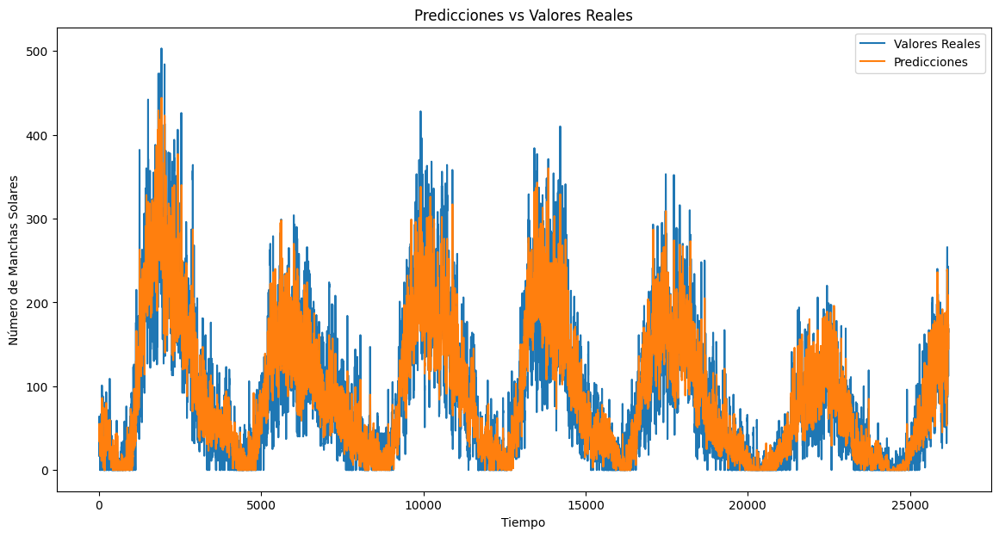

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 52ms/step


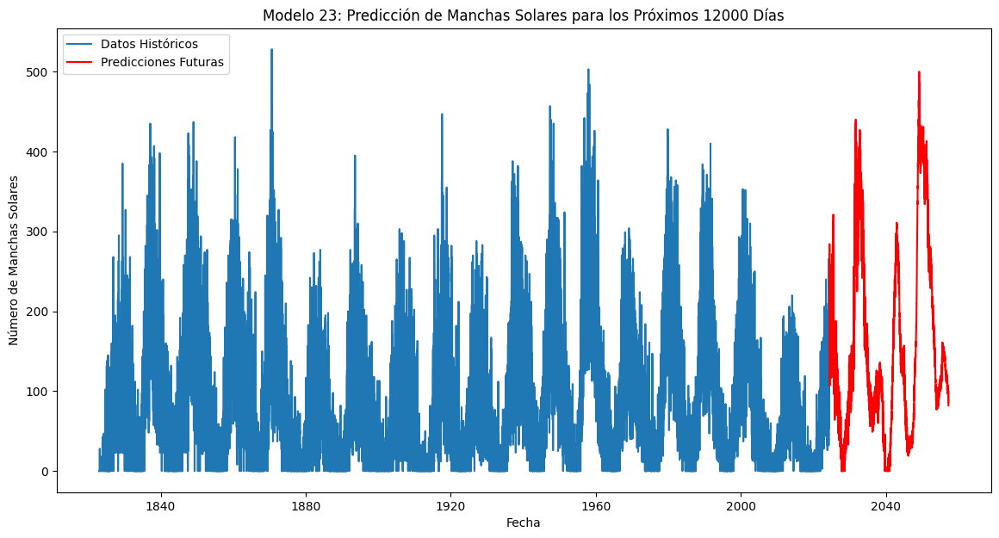

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Modelo 23: Predicción de Manchas Solares para los Próximos 12000 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                        171
2024-06-02                        168
2024-06-03                        161
2024-06-04                        154
2024-06-05                        147
...                               ...
2057-04-04                         88
2057-04-05                         86
2057-04-06                         85
2057-04-07                         83
2057-04-08                         82

[12000 rows x 1 columns]


In [ ]:
# Define la ruta completa para la carpeta y el archivo CSV
folder_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 23'
file_path = os.path.join(folder_path, 'Predicciones_100epocas.csv')

# Verifica si la carpeta existe, si no, créala
if not os.path.exists(folder_path):
    os.makedirs(folder_path)

# Asumiendo que df_predictions es tu DataFrame de predicciones
# Guarda el DataFrame en el archivo CSV especificado
df_predictions.to_csv(file_path)

# Verifica que el archivo se ha guardado correctamente
print(f"DataFrame guardado en: {file_path}")

DataFrame guardado en: /content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 23/Predicciones_100epocas.csv


In [ ]:
# Especificar la ruta en Google Drive con formato HDF5
drive_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 23/100epocas.h5'

# Crear la carpeta si no existe
os.makedirs(os.path.dirname(drive_path), exist_ok=True)

# Guardar el modelo en formato HDF5 en la carpeta especificada
model.save(drive_path)

print(f'Modelo guardado en formato HDF5 en la carpeta de Google Drive: {drive_path}')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Modelo guardado en formato HDF5 en la carpeta de Google Drive: /content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 23/100epocas.h5


'seq_length': 3237, 'n_lstm_layers': 1, 'lstm_units_0': 236, 'dropout_0': 0.5037486127115461, 'n_dense_layers': 3, 'dense_units_0': 221, 'dense_units_1': 157, 'dense_units_2': 183, 'lr': 0.0001210197534738152, 'optimizer': 'adam', 'batch_size': 110

##Modelo 24

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 2901

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=125, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.5883752463825889))

model.add(layers.Flatten())

model.add(layers.Dense(220, activation='relu'))
model.add(layers.Dense(198, activation='relu'))
model.add(layers.Dense(162, activation='relu'))
model.add(layers.Dense(1, activation='relu'))

# Compilación del modelo
optimizer = optimizers.Adam(learning_rate= 0.00010947109398973162)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

In [ ]:
# Configurar la detección temprana
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Entrenamiento del modelo
history = model.fit(X_train, y_train,
                    epochs=100,  # Número de épocas
                    batch_size=56,  # Tamaño de lote
                    verbose=1,  # Muestra el progreso
                    callbacks=[early_stopping],  # Detección temprana
                    validation_split=0.2)  # División para validación

In [ ]:
# Guardar el modelo entrenado
model.save('model2460.h5')

In [ ]:
from keras.models import load_model


loaded_model = load_model("model2460.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Modelo 24: Predicción de Manchas Solares para los Próximos 12000 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

In [ ]:
# Define la ruta completa para la carpeta y el archivo CSV
folder_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 24'
file_path = os.path.join(folder_path, 'Predicciones_100epocas.csv')

# Verifica si la carpeta existe, si no, créala
if not os.path.exists(folder_path):
    os.makedirs(folder_path)

# Asumiendo que df_predictions es tu DataFrame de predicciones
# Guarda el DataFrame en el archivo CSV especificado
df_predictions.to_csv(file_path)

# Verifica que el archivo se ha guardado correctamente
print(f"DataFrame guardado en: {file_path}")

In [ ]:
# Especificar la ruta en Google Drive con formato HDF5
drive_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 24/100epocas.h5'

# Crear la carpeta si no existe
os.makedirs(os.path.dirname(drive_path), exist_ok=True)

# Guardar el modelo en formato HDF5 en la carpeta especificada
model.save(drive_path)

print(f'Modelo guardado en formato HDF5 en la carpeta de Google Drive: {drive_path}')

'seq_length': 2901, 'n_lstm_layers': 1, 'lstm_units_0': 125, 'dropout_0': 0.5883752463825889, 'n_dense_layers': 3, 'dense_units_0': 220, 'dense_units_1': 198, 'dense_units_2': 162, 'lr': 0.00010947109398973162, 'optimizer': 'adam', 'batch_size': 56


##Modelo 25

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 3183

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=145, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.5899164227354118))

model.add(layers.Flatten())

model.add(layers.Dense(223, activation='relu'))
model.add(layers.Dense(219, activation='relu'))
model.add(layers.Dense(167, activation='relu'))
model.add(layers.Dense(1, activation='relu'))

# Compilación del modelo
optimizer = optimizers.Adam(learning_rate= 0.00010093588847741957)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

In [ ]:
# Entrenamiento del modelo con verbose=1 para ver el progreso
history = model.fit(X_train, y_train,
                    epochs=10,
                    batch_size=54,
                    verbose=1,  # Configuración para ver el progreso
                    validation_split=0.2)

Epoch 1/10
607/607 [==============================] - 77s 121ms/step - loss: 0.0434 - mae: 0.1525 - val_loss: 0.0391 - val_mae: 0.1466
Epoch 2/10
607/607 [==============================] - 73s 120ms/step - loss: 0.0434 - mae: 0.1524 - val_loss: 0.0391 - val_mae: 0.1466
Epoch 3/10
607/607 [==============================] - 73s 120ms/step - loss: 0.0434 - mae: 0.1524 - val_loss: 0.0391 - val_mae: 0.1466
Epoch 4/10
607/607 [==============================] - 73s 120ms/step - loss: 0.0434 - mae: 0.1524 - val_loss: 0.0391 - val_mae: 0.1466
Epoch 5/10
607/607 [==============================] - 73s 120ms/step - loss: 0.0434 - mae: 0.1524 - val_loss: 0.0391 - val_mae: 0.1466
Epoch 6/10
607/607 [==============================] - 73s 120ms/step - loss: 0.0434 - mae: 0.1524 - val_loss: 0.0391 - val_mae: 0.1466
Epoch 7/10
607/607 [==============================] - 73s 120ms/step - loss: 0.0434 - mae: 0.1524 - val_loss: 0.0391 - val_mae: 0.1466
Epoch 8/10
607/607 [==============================] - 7

In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.models import load_model


loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

821/821 [==============================] - 38s 46ms/step


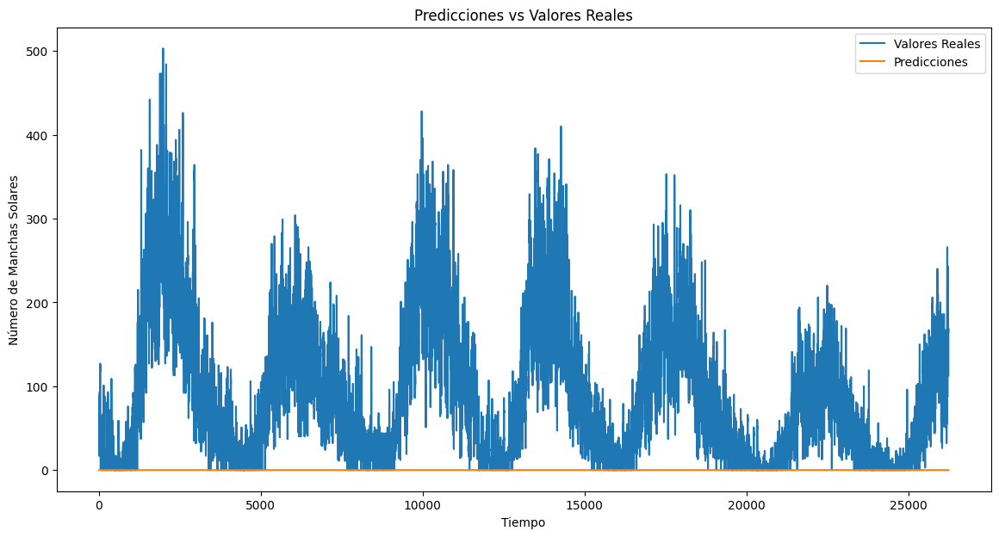

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

1/1 [==============================] - 0s 50ms/step


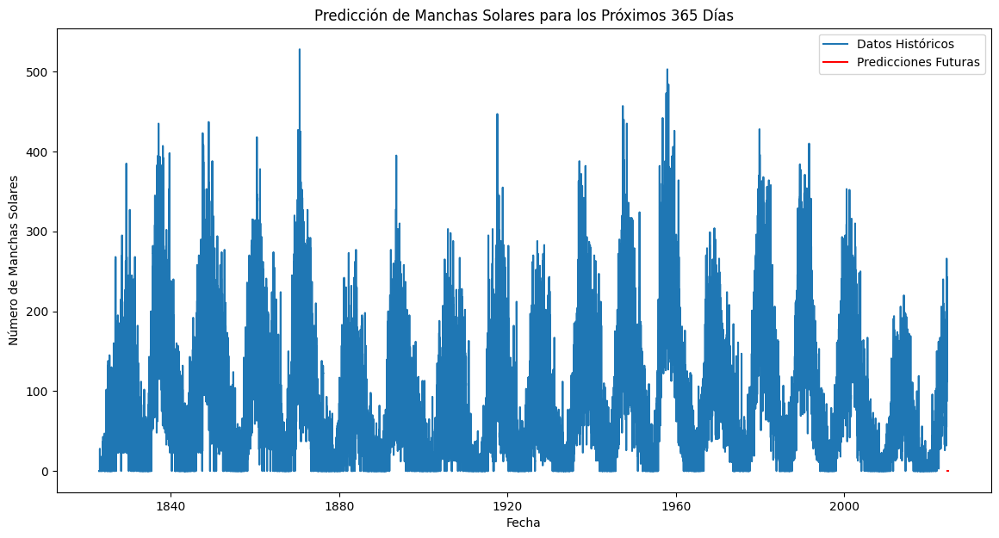

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 120 # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicción de Manchas Solares para los Próximos 365 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                          0
2024-06-02                          0
2024-06-03                          0
2024-06-04                          0
2024-06-05                          0
...                               ...
2024-09-24                          0
2024-09-25                          0
2024-09-26                          0
2024-09-27                          0
2024-09-28                          0

[120 rows x 1 columns]


'seq_length': 3183, 'n_lstm_layers': 1, 'lstm_units_0': 145, 'dropout_0': 0.5899164227354118, 'n_dense_layers': 3, 'dense_units_0': 223, 'dense_units_1': 219, 'dense_units_2': 167, 'lr': 0.00010093588847741957, 'optimizer': 'adam', 'batch_size': 54

##Modelo 26

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 2104

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=127, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.46767454824414234))

model.add(layers.Flatten())

model.add(layers.Dense(202, activation='relu'))
model.add(layers.Dense(164, activation='relu'))
model.add(layers.Dense(172, activation='relu'))
model.add(layers.Dense(1, activation='relu'))

# Compilación del modelo
optimizer = optimizers.Adam(learning_rate= 0.00010380458179782621)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_9 (LSTM)               (None, 2104, 127)         65532     
                                                                 
 dropout_9 (Dropout)         (None, 2104, 127)         0         
                                                                 
 flatten_7 (Flatten)         (None, 267208)            0         
                                                                 
 dense_28 (Dense)            (None, 202)               53976218  
                                                                 
 dense_29 (Dense)            (None, 164)               33292     
                                                                 
 dense_30 (Dense)            (None, 172)               28380     
                                                                 
 dense_31 (Dense)            (None, 1)                

In [ ]:
# Configurar la detección temprana
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Entrenamiento del modelo
history = model.fit(X_train, y_train,
                    epochs=100,  # Número de épocas
                    batch_size=107,  # Tamaño de lote
                    verbose=1,  # Muestra el progreso
                    callbacks=[early_stopping],  # Detección temprana
                    validation_split=0.2)  # División para validación

Epoch 1/100
315/315 [==============================] - 33s 95ms/step - loss: 0.0076 - mae: 0.0629 - val_loss: 0.0052 - val_mae: 0.0542
Epoch 2/100
315/315 [==============================] - 29s 92ms/step - loss: 0.0049 - mae: 0.0511 - val_loss: 0.0045 - val_mae: 0.0507
Epoch 3/100
315/315 [==============================] - 29s 92ms/step - loss: 0.0041 - mae: 0.0467 - val_loss: 0.0043 - val_mae: 0.0511
Epoch 4/100
315/315 [==============================] - 29s 92ms/step - loss: 0.0035 - mae: 0.0428 - val_loss: 0.0031 - val_mae: 0.0404
Epoch 5/100
315/315 [==============================] - 29s 93ms/step - loss: 0.0032 - mae: 0.0407 - val_loss: 0.0029 - val_mae: 0.0402
Epoch 6/100
315/315 [==============================] - 29s 92ms/step - loss: 0.0030 - mae: 0.0390 - val_loss: 0.0030 - val_mae: 0.0399
Epoch 7/100
315/315 [==============================] - 29s 92ms/step - loss: 0.0028 - mae: 0.0372 - val_loss: 0.0027 - val_mae: 0.0397
Epoch 8/100
315/315 [==============================] - 

In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.models import load_model


loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

854/854 [==============================] - 21s 24ms/step


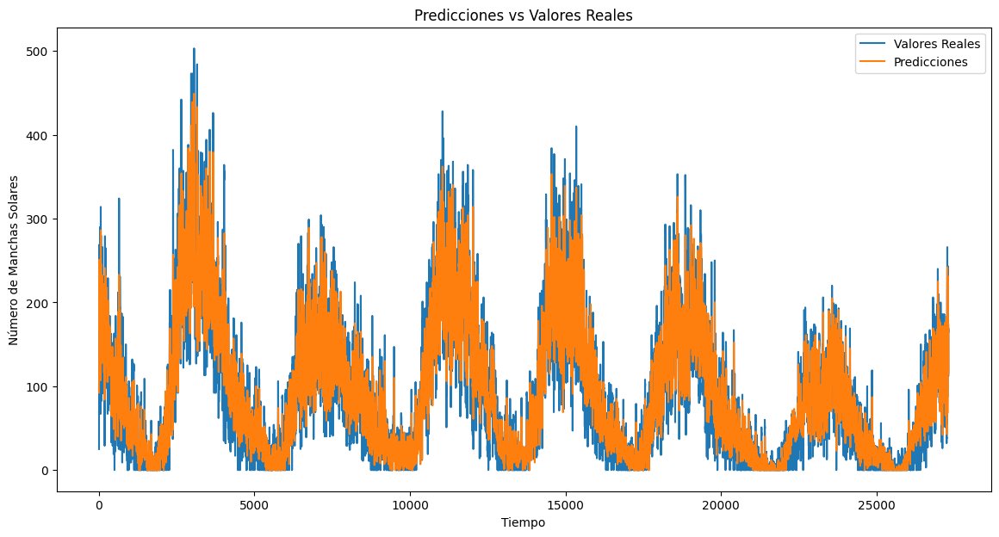

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

Se han truncado las últimas 5000 líneas del flujo de salida.
1/1 [==============================] - 0s 45ms/step


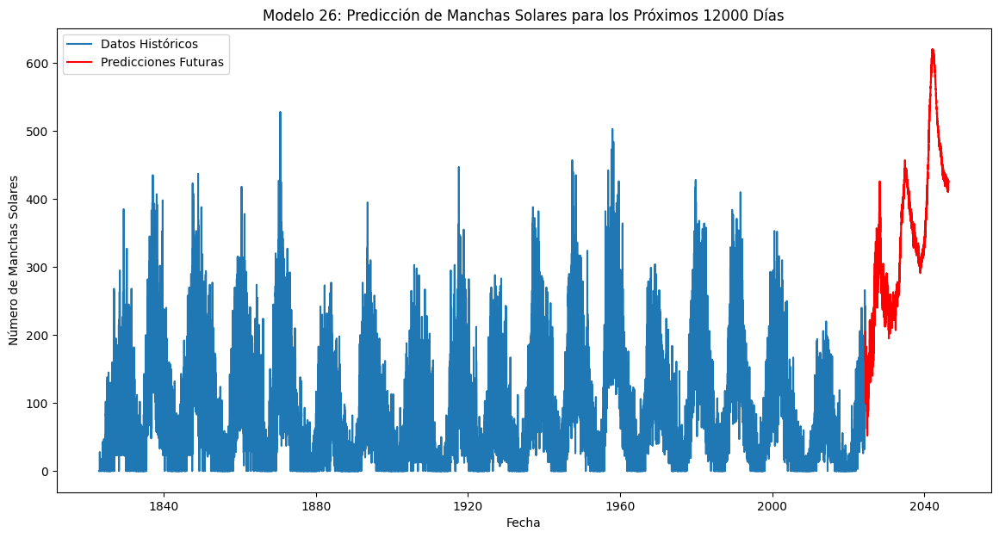

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 8000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Modelo 26: Predicción de Manchas Solares para los Próximos 12000 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                        177
2024-06-02                        176
2024-06-03                        172
2024-06-04                        169
2024-06-05                        166
...                               ...
2046-04-22                        427
2046-04-23                        427
2046-04-24                        427
2046-04-25                        426
2046-04-26                        425

[8000 rows x 1 columns]


In [ ]:
# Define la ruta completa para la carpeta y el archivo CSV
folder_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 26'
file_path = os.path.join(folder_path, 'Predicciones_100epocas.csv')

# Verifica si la carpeta existe, si no, créala
if not os.path.exists(folder_path):
    os.makedirs(folder_path)

# Asumiendo que df_predictions es tu DataFrame de predicciones
# Guarda el DataFrame en el archivo CSV especificado
df_predictions.to_csv(file_path)

# Verifica que el archivo se ha guardado correctamente
print(f"DataFrame guardado en: {file_path}")

DataFrame guardado en: /content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 26/Predicciones_100epocas.csv


In [ ]:
# Especificar la ruta en Google Drive con formato HDF5
drive_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 26/100epocas.h5'

# Crear la carpeta si no existe
os.makedirs(os.path.dirname(drive_path), exist_ok=True)

# Guardar el modelo en formato HDF5 en la carpeta especificada
model.save(drive_path)

print(f'Modelo guardado en formato HDF5 en la carpeta de Google Drive: {drive_path}')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Modelo guardado en formato HDF5 en la carpeta de Google Drive: /content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 26/100epocas.h5


'seq_length': 2104, 'n_lstm_layers': 1, 'lstm_units_0': 127, 'dropout_0': 0.46767454824414234, 'n_dense_layers': 3, 'dense_units_0': 202, 'dense_units_1': 164, 'dense_units_2': 172, 'lr': 0.00010380458179782621, 'optimizer': 'adam', 'batch_size': 107

##Modelo 27

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 2627

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=251, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.5891832353965457))

model.add(layers.Flatten())

model.add(layers.Dense(229, activation='relu'))
model.add(layers.Dense(131, activation='relu'))
model.add(layers.Dense(1, activation='relu'))

# Compilación del modelo
optimizer = optimizers.Adam(learning_rate=0.00026220217932406174)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_2 (LSTM)               (None, 2627, 251)         254012    
                                                                 
 dropout_2 (Dropout)         (None, 2627, 251)         0         
                                                                 
 flatten_2 (Flatten)         (None, 659377)            0         
                                                                 
 dense_8 (Dense)             (None, 229)               150997562 
                                                                 
 dense_9 (Dense)             (None, 131)               30130     
                                                                 
 dense_10 (Dense)            (None, 1)                 132       
                                                                 
Total params: 151281836 (577.09 MB)
Trainable params: 

In [ ]:
# Entrenamiento del modelo con verbose=1 para ver el progreso
history = model.fit(X_train, y_train,
                    epochs=20,
                    batch_size=40,
                    verbose=1,  # Configuración para ver el progreso
                    validation_split=0.2)

Epoch 1/20
831/831 [==============================] - 106s 124ms/step - loss: 0.0781 - mae: 0.1599 - val_loss: 0.0387 - val_mae: 0.1457
Epoch 2/20
831/831 [==============================] - 102s 123ms/step - loss: 0.0436 - mae: 0.1534 - val_loss: 0.0387 - val_mae: 0.1457
Epoch 3/20
831/831 [==============================] - 102s 123ms/step - loss: 0.0436 - mae: 0.1534 - val_loss: 0.0387 - val_mae: 0.1457
Epoch 4/20
831/831 [==============================] - 102s 123ms/step - loss: 0.0436 - mae: 0.1534 - val_loss: 0.0387 - val_mae: 0.1457
Epoch 5/20
831/831 [==============================] - 102s 123ms/step - loss: 0.0436 - mae: 0.1534 - val_loss: 0.0387 - val_mae: 0.1457
Epoch 6/20
831/831 [==============================] - 102s 123ms/step - loss: 0.0436 - mae: 0.1534 - val_loss: 0.0387 - val_mae: 0.1457
Epoch 7/20
831/831 [==============================] - 102s 123ms/step - loss: 0.0436 - mae: 0.1534 - val_loss: 0.0387 - val_mae: 0.1457
Epoch 8/20
831/831 [============================

In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

In [ ]:
from keras.models import load_model


loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

Se han truncado las últimas 5000 líneas del flujo de salida.
1/1 [==============================] - 0s 45ms/step


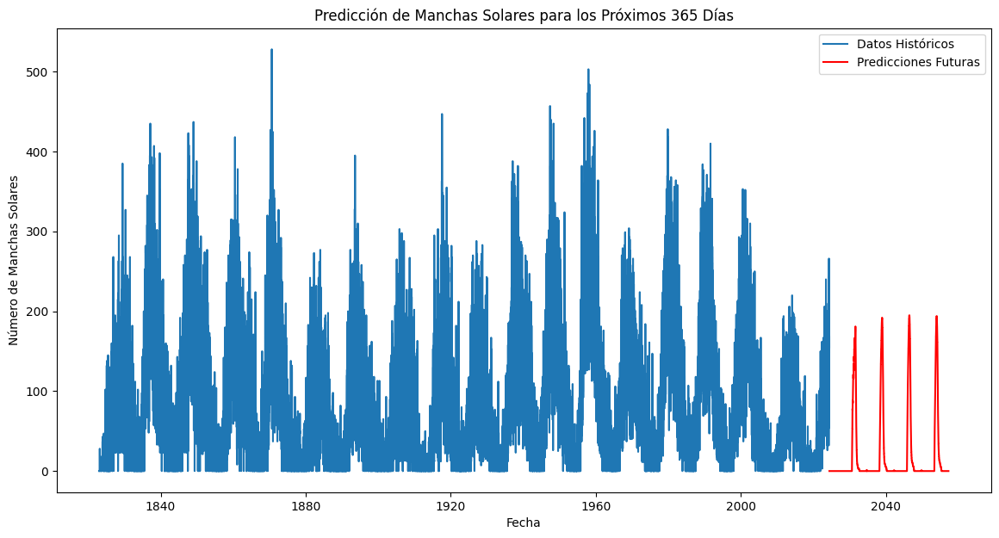

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicción de Manchas Solares para los Próximos 365 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                          0
2024-06-02                          0
2024-06-03                          0
2024-06-04                          0
2024-06-05                          0
...                               ...
2057-04-04                          0
2057-04-05                          0
2057-04-06                          0
2057-04-07                          0
2057-04-08                          0

[12000 rows x 1 columns]


'seq_length': 2627, 'n_lstm_layers': 1, 'lstm_units_0': 251, 'dropout_0': 0.5891832353965457, 'n_dense_layers': 2, 'dense_units_0': 229, 'dense_units_1': 131, 'lr': 0.00026220217932406174, 'optimizer': 'adam', 'batch_size': 40

##Modelo 28

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 3575

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=151, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.4190915452973863))

model.add(layers.LSTM(units=359, return_sequences=True))
model.add(layers.Dropout(0.5237283414336269))

model.add(layers.Flatten())

model.add(layers.Dense(169, activation='relu'))
model.add(layers.Dense(230, activation='relu'))
model.add(layers.Dense(143, activation='relu'))
model.add(layers.Dense(1, activation='relu'))

# Compilación del modelo
optimizer = optimizers.RMSprop(learning_rate=0.00013654027335192388)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_10 (LSTM)              (None, 3575, 151)         92412     
                                                                 
 dropout_10 (Dropout)        (None, 3575, 151)         0         
                                                                 
 lstm_11 (LSTM)              (None, 3575, 359)         733796    
                                                                 
 dropout_11 (Dropout)        (None, 3575, 359)         0         
                                                                 
 flatten_8 (Flatten)         (None, 1283425)           0         
                                                                 
 dense_32 (Dense)            (None, 169)               216898994 
                                                                 
 dense_33 (Dense)            (None, 230)              

In [ ]:
# Configurar la detección temprana
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Entrenamiento del modelo
history = model.fit(X_train, y_train,
                    epochs=100,  # Número de épocas
                    batch_size=63,  # Tamaño de lote
                    verbose=1,  # Muestra el progreso
                    callbacks=[early_stopping],  # Detección temprana
                    validation_split=0.2)  # División para validación

Epoch 1/100
516/516 [==============================] - 200s 381ms/step - loss: 0.0079 - mae: 0.0648 - val_loss: 0.0124 - val_mae: 0.0769
Epoch 2/100
516/516 [==============================] - 195s 377ms/step - loss: 0.0065 - mae: 0.0590 - val_loss: 0.0099 - val_mae: 0.0757
Epoch 3/100
516/516 [==============================] - 194s 376ms/step - loss: 0.0057 - mae: 0.0550 - val_loss: 0.0125 - val_mae: 0.0824
Epoch 4/100
516/516 [==============================] - 194s 377ms/step - loss: 0.0049 - mae: 0.0511 - val_loss: 0.0065 - val_mae: 0.0612
Epoch 5/100
516/516 [==============================] - 194s 377ms/step - loss: 0.0043 - mae: 0.0473 - val_loss: 0.0062 - val_mae: 0.0603
Epoch 6/100
516/516 [==============================] - 194s 376ms/step - loss: 0.0037 - mae: 0.0440 - val_loss: 0.0066 - val_mae: 0.0595
Epoch 7/100
516/516 [==============================] - 194s 375ms/step - loss: 0.0033 - mae: 0.0410 - val_loss: 0.0068 - val_mae: 0.0590
Epoch 8/100
516/516 [====================

In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.models import load_model


loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

808/808 [==============================] - 77s 95ms/step


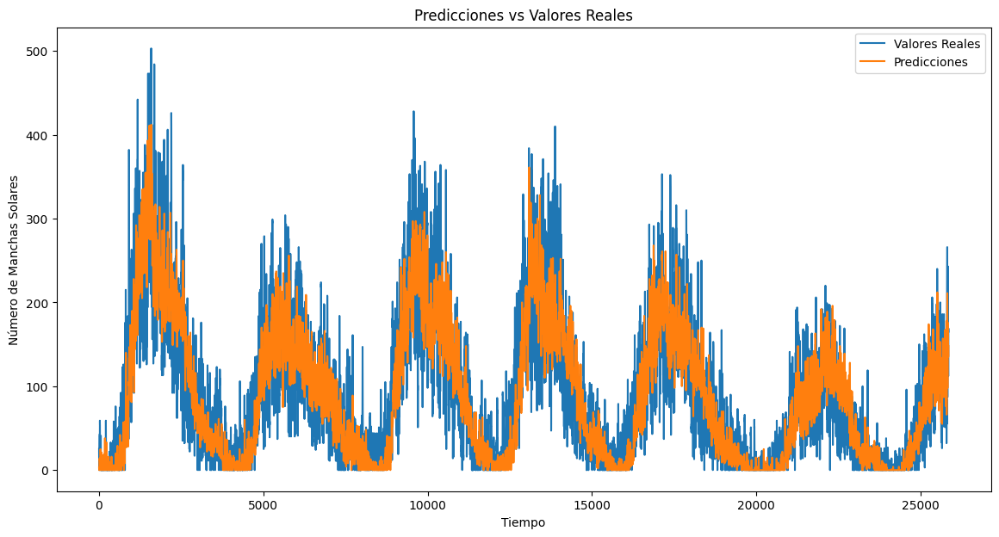

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

Se han truncado las últimas 5000 líneas del flujo de salida.
1/1 [==============================] - 0s 107ms/step


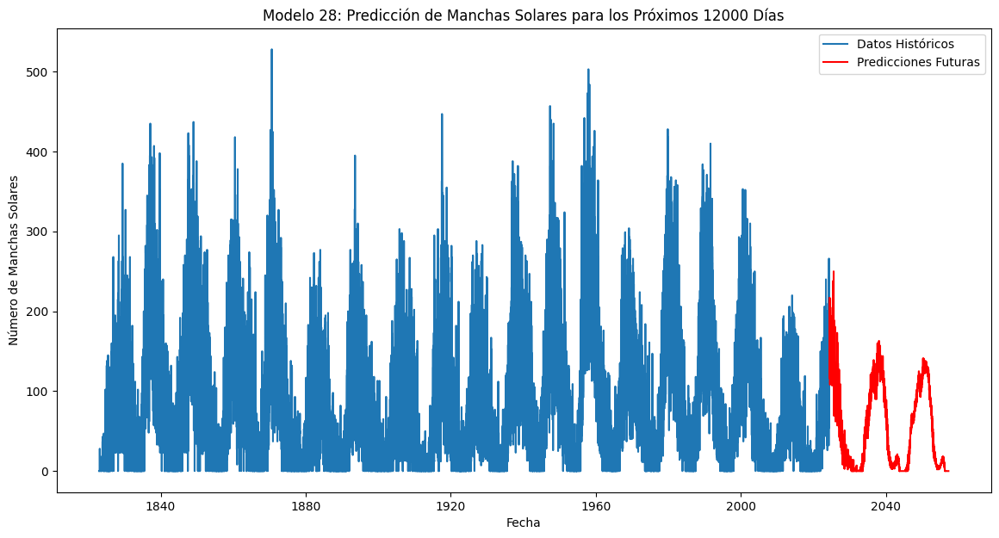

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Modelo 28: Predicción de Manchas Solares para los Próximos 12000 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                        152
2024-06-02                        153
2024-06-03                        151
2024-06-04                        148
2024-06-05                        143
...                               ...
2057-04-04                          0
2057-04-05                          0
2057-04-06                          0
2057-04-07                          0
2057-04-08                          0

[12000 rows x 1 columns]


In [ ]:
# Define la ruta completa para la carpeta y el archivo CSV
folder_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 28'
file_path = os.path.join(folder_path, 'Predicciones_100epocas.csv')

# Verifica si la carpeta existe, si no, créala
if not os.path.exists(folder_path):
    os.makedirs(folder_path)

# Asumiendo que df_predictions es tu DataFrame de predicciones
# Guarda el DataFrame en el archivo CSV especificado
df_predictions.to_csv(file_path)

# Verifica que el archivo se ha guardado correctamente
print(f"DataFrame guardado en: {file_path}")

DataFrame guardado en: /content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 28/Predicciones_100epocas.csv


In [ ]:
# Especificar la ruta en Google Drive con formato HDF5
drive_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 28/100epocas.h5'

# Crear la carpeta si no existe
os.makedirs(os.path.dirname(drive_path), exist_ok=True)

# Guardar el modelo en formato HDF5 en la carpeta especificada
model.save(drive_path)

print(f'Modelo guardado en formato HDF5 en la carpeta de Google Drive: {drive_path}')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Modelo guardado en formato HDF5 en la carpeta de Google Drive: /content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 28/100epocas.h5


'seq_length': 3575, 'n_lstm_layers': 2, 'lstm_units_0': 151, 'dropout_0': 0.4190915452973863, 'lstm_units_1': 359, 'dropout_1': 0.5237283414336269, 'n_dense_layers': 3, 'dense_units_0': 169, 'dense_units_1': 230, 'dense_units_2': 143, 'lr': 0.00013654027335192388, 'optimizer': 'rmsprop', 'batch_size': 63

##Modelo 29

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 3069

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=243, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.58601863715275))


model.add(layers.Flatten())

model.add(layers.Dense(211, activation='relu'))
model.add(layers.Dense(196, activation='relu'))
model.add(layers.Dense(1, activation='relu'))

# Compilación del modelo
optimizer = optimizers.Adam(learning_rate=7.653087563691665e-05)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_7 (LSTM)               (None, 3069, 243)         238140    
                                                                 
 dropout_7 (Dropout)         (None, 3069, 243)         0         
                                                                 
 flatten_5 (Flatten)         (None, 745767)            0         
                                                                 
 dense_19 (Dense)            (None, 211)               157357048 
                                                                 
 dense_20 (Dense)            (None, 196)               41552     
                                                                 
 dense_21 (Dense)            (None, 1)                 197       
                                                                 
Total params: 157636937 (601.34 MB)
Trainable params: 

In [ ]:
# Entrenamiento del modelo con verbose=1 para ver el progreso
history = model.fit(X_train, y_train,
                    epochs=20,
                    batch_size=174,
                    verbose=1,  # Configuración para ver el progreso
                    validation_split=0.2)

Epoch 1/20
189/189 [==============================] - 38s 186ms/step - loss: 0.0202 - mae: 0.0729 - val_loss: 0.0059 - val_mae: 0.0549
Epoch 2/20
189/189 [==============================] - 34s 182ms/step - loss: 0.0060 - mae: 0.0563 - val_loss: 0.0055 - val_mae: 0.0537
Epoch 3/20
189/189 [==============================] - 34s 182ms/step - loss: 0.0052 - mae: 0.0527 - val_loss: 0.0044 - val_mae: 0.0479
Epoch 4/20
189/189 [==============================] - 34s 182ms/step - loss: 0.0047 - mae: 0.0502 - val_loss: 0.0043 - val_mae: 0.0467
Epoch 5/20
189/189 [==============================] - 34s 182ms/step - loss: 0.0045 - mae: 0.0485 - val_loss: 0.0037 - val_mae: 0.0444
Epoch 6/20
189/189 [==============================] - 34s 181ms/step - loss: 0.0042 - mae: 0.0471 - val_loss: 0.0035 - val_mae: 0.0428
Epoch 7/20
189/189 [==============================] - 34s 182ms/step - loss: 0.0040 - mae: 0.0457 - val_loss: 0.0038 - val_mae: 0.0450
Epoch 8/20
189/189 [==============================] - 3

In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.models import load_model


loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

124/824 [===>..........................] - ETA: 39s

In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

Se han truncado las últimas 5000 líneas del flujo de salida.
1/1 [==============================] - 0s 53ms/step


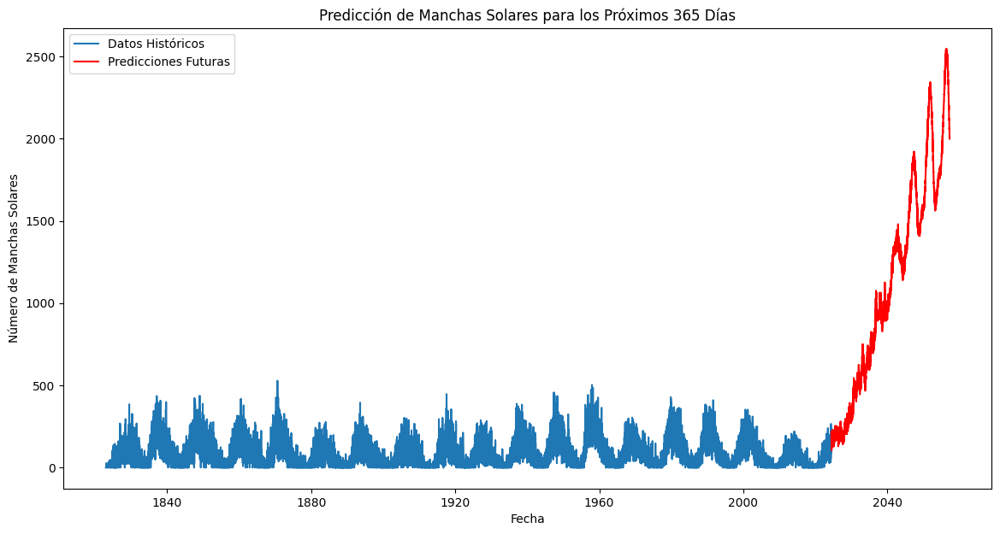

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicción de Manchas Solares para los Próximos 365 Días')
plt.legend()
plt.show()

In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

            numero de manchas solares
2024-06-01                        171
2024-06-02                        173
2024-06-03                        172
2024-06-04                        173
2024-06-05                        174
...                               ...
2057-04-04                       1999
2057-04-05                       2000
2057-04-06                       2002
2057-04-07                       2005
2057-04-08                       2007

[12000 rows x 1 columns]


'seq_length': 3069, 'n_lstm_layers': 1, 'lstm_units_0': 243, 'dropout_0': 0.58601863715275, 'n_dense_layers': 2, 'dense_units_0': 211, 'dense_units_1': 196, 'lr': 7.653087563691665e-05, 'optimizer': 'adam', 'batch_size': 174

##Modelo 30

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 2500

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

Longitud del conjunto total: 73566
Longitud del conjunto de entrenamiento: 44139
Longitud del conjunto de prueba: 29426


In [ ]:
model = models.Sequential()

model.add(layers.LSTM(units=287, return_sequences=True, input_shape=(seq_length, 1)))
model.add(layers.Dropout(0.10363315457171096))

model.add(layers.LSTM(units=16, return_sequences=True))
model.add(layers.Dropout(0.5027951112671383))

model.add(layers.LSTM(units=486, return_sequences=True))
model.add(layers.Dropout(0.698195977830302))

model.add(layers.Flatten())

model.add(layers.Dense(199, activation='relu'))
model.add(layers.Dense(163, activation='relu'))
model.add(layers.Dense(199, activation='relu'))
model.add(layers.Dense(1, activation='relu'))

# Compilación del modelo
optimizer = optimizers.Adam(learning_rate=3.1362657696073515e-05)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Mostrar un resumen del modelo
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_9 (LSTM)               (None, 2500, 287)         331772    
                                                                 
 dropout_9 (Dropout)         (None, 2500, 287)         0         
                                                                 
 lstm_10 (LSTM)              (None, 2500, 16)          19456     
                                                                 
 dropout_10 (Dropout)        (None, 2500, 16)          0         
                                                                 
 lstm_11 (LSTM)              (None, 2500, 486)         977832    
                                                                 
 dropout_11 (Dropout)        (None, 2500, 486)         0         
                                                                 
 flatten_6 (Flatten)         (None, 1215000)          

In [ ]:

# Entrenamiento del modelo
history = model.fit(X_train, y_train,
                    epochs=50,  # Número de épocas
                    batch_size=109,  # Tamaño de lote
                    verbose=1,  # Muestra el progreso
                    validation_split=0.2)  # División para validación

Epoch 1/50
306/306 [==============================] - 130s 407ms/step - loss: 0.0082 - mae: 0.0663 - val_loss: 0.0065 - val_mae: 0.0598
Epoch 2/50
306/306 [==============================] - 123s 403ms/step - loss: 0.0068 - mae: 0.0605 - val_loss: 0.0064 - val_mae: 0.0583
Epoch 3/50
306/306 [==============================] - 123s 403ms/step - loss: 0.0058 - mae: 0.0558 - val_loss: 0.0068 - val_mae: 0.0603
Epoch 4/50
306/306 [==============================] - 123s 404ms/step - loss: 0.0045 - mae: 0.0490 - val_loss: 0.0078 - val_mae: 0.0642
Epoch 5/50
306/306 [==============================] - 123s 404ms/step - loss: 0.0033 - mae: 0.0411 - val_loss: 0.0079 - val_mae: 0.0659
Epoch 6/50
306/306 [==============================] - 123s 403ms/step - loss: 0.0026 - mae: 0.0361 - val_loss: 0.0084 - val_mae: 0.0682
Epoch 7/50
306/306 [==============================] - 123s 403ms/step - loss: 0.0022 - mae: 0.0330 - val_loss: 0.0079 - val_mae: 0.0657
Epoch 8/50
306/306 [============================

In [ ]:
# Guardar el modelo entrenado
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from keras.models import load_model


loaded_model = load_model("model.h5")
predictions = loaded_model.predict(X_test)
# Desnormalizar las predicciones
predictions = scaler.inverse_transform(np.array(predictions).reshape(-1, 1))
predictions = np.round(predictions).astype(int)

842/842 [==============================] - 99s 117ms/step


In [ ]:
import matplotlib.pyplot as plt

y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()

# Crear una gráfica de las predicciones frente a los valores reales
plt.figure(figsize=(14, 7))
plt.plot(y_test_original, label='Valores Reales')
plt.plot(predictions, label='Predicciones')
plt.xlabel('Tiempo')
plt.ylabel('Número de Manchas Solares')
plt.title('Predicciones vs Valores Reales')
plt.legend()
plt.show()

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 12000  # Cambiado a 365 para predecir un año completo

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

# Graficar los datos históricos y las predicciones futuras
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['No. de manchas solares'], label='Datos Históricos')
plt.plot(df_predictions.index, df_predictions['numero de manchas solares'], label='Predicciones Futuras', color='red')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.title('Modelo 30: Predicción de Manchas Solares para los Próximos 12000 Días')
plt.legend()
plt.show()

Se han truncado las últimas 5000 líneas del flujo de salida.
1/1 [==============================] - 0s 129ms/step


In [ ]:
# Mostrar el DataFrame de predicciones
print(df_predictions)

In [ ]:
# Define la ruta completa para la carpeta y el archivo CSV
folder_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 30 v2'
file_path = os.path.join(folder_path, 'Predicciones_100epocas.csv')

# Verifica si la carpeta existe, si no, créala
if not os.path.exists(folder_path):
    os.makedirs(folder_path)

# Asumiendo que df_predictions es tu DataFrame de predicciones
# Guarda el DataFrame en el archivo CSV especificado
df_predictions.to_csv(file_path)

# Verifica que el archivo se ha guardado correctamente
print(f"DataFrame guardado en: {file_path}")

In [ ]:
# Especificar la ruta en Google Drive con formato HDF5
drive_path = '/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 30/50epocas.h5'

# Crear la carpeta si no existe
os.makedirs(os.path.dirname(drive_path), exist_ok=True)

# Guardar el modelo en formato HDF5 en la carpeta especificada
model.save(drive_path)

print(f'Modelo guardado en formato HDF5 en la carpeta de Google Drive: {drive_path}')

'seq_length': 2500, 'n_lstm_layers': 3, 'lstm_units_0': 287, 'dropout_0': 0.10363315457171096, 'lstm_units_1': 16, 'dropout_1': 0.5027951112671383, 'lstm_units_2': 486, 'dropout_2': 0.698195977830302, 'n_dense_layers': 3, 'dense_units_0': 199, 'dense_units_1': 163, 'dense_units_2': 199, 'lr': 3.1362657696073515e-05, 'optimizer': 'adam', 'batch_size': 109

#Pruebas Finales

##Procesamiento de Manchas solares de Junio

In [ ]:

# Cargar el archivo CSV en un DataFrame usando `;` como delimitador
df_junio = pd.read_csv('/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Manchas solares Junio.csv', delimiter=';', header=0)

# Mostrar las primeras filas del DataFrame y los nombres de las columnas
print(df_junio.head())
print("Nombres de columnas:", df_junio.columns)



        Fecha   No. de manchas solares
0  2024-06-01                      181
1  2024-06-02                      207
2  2024-06-03                      212
3  2024-06-04                      211
4  2024-06-05                      182
Nombres de columnas: Index(['Fecha', ' No. de manchas solares'], dtype='object')


In [ ]:
# Establecer la columna de fecha como el índice del DataFrame
df_junio.set_index('Fecha', inplace=True)

# Convertir el índice a formato de fecha
df_junio.index = pd.to_datetime(df_junio.index, format='%Y-%m-%d', errors='coerce')


print(df_junio.head())


             No. de manchas solares
Fecha                              
2024-06-01                      181
2024-06-02                      207
2024-06-03                      212
2024-06-04                      211
2024-06-05                      182


##Cargar Manchas solares de Junio

##Cargar modelo y predecir 30 días

In [ ]:
# Seleccionar solo la columna 'No. de manchas solares' del DataFrame original
df = Dataframe[['No. de manchas solares']]

# Escalar los datos a un rango de 0 a 1 para mejorar el rendimiento del modelo
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df)

# Convertir los datos escalados de nuevo a un DataFrame, manteniendo el mismo índice y nombre de columna
df_scaled = pd.DataFrame(scaled_data, index=df.index, columns=['numero de manchas solares'])

# Determinar el tamaño del conjunto de entrenamiento y validación
train_size = int(len(df_scaled) * 0.6)
test_size = int(len(df_scaled) * 0.40)

# Separar los datos en conjuntos de entrenamiento y prueba
train_data = df_scaled[:train_size]
test_data = df_scaled[train_size:train_size + test_size]

# Verificar las longitudes
print("Longitud del conjunto total:", len(df_scaled))
print("Longitud del conjunto de entrenamiento:", len(train_data))
print("Longitud del conjunto de prueba:", len(test_data))

# Función para crear datos de secuencia
def create_sequence_data(data, seq_length):
    X = []
    y = []
    for i in range(len(data) - seq_length):
        X.append(data.iloc[i:i + seq_length].values)
        y.append(data.iloc[i + seq_length].values)
    return np.array(X), np.array(y)

seq_length = 2500

# Crear datos de entrenamiento y prueba
X_train, y_train = create_sequence_data(train_data, seq_length)
X_test, y_test = create_sequence_data(test_data, seq_length)

# Ajustar las dimensiones de las secuencias para que sean compatibles con el modelo
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

In [ ]:
# Cargar el modelo desde un archivo HDF5
modelo = load_model('ruta/al/modelo.h5')

# Verifica que el modelo se ha cargado correctamente
modelo.summary()

In [ ]:
# Crear una nueva secuencia de datos a partir de los últimos datos conocidos
last_known_sequence = test_data[-seq_length:].values  # Última secuencia conocida del conjunto de prueba
future_predictions = []

futuro = 30

# Realizar las predicciones paso a paso
for _ in range(futuro):
    # Preparar los datos de entrada para el modelo
    input_sequence = last_known_sequence.reshape((1, seq_length, 1))

    # Realizar la predicción
    predicted_value = loaded_model.predict(input_sequence)

    # Almacenar la predicción
    future_predictions.append(predicted_value[0, 0])

    # Actualizar la secuencia de entrada añadiendo la nueva predicción y descartando el primer valor
    last_known_sequence = np.append(last_known_sequence, predicted_value)[-seq_length:]

# Revertir la escala de las predicciones y redondear a enteros
future_predictions = scaler.inverse_transform(np.array(future_predictions).reshape(-1, 1))
future_predictions = np.round(future_predictions).astype(int)

# Crear un índice de tiempo para las predicciones futuras
last_date = df.index[-1]
future_dates = [last_date + pd.Timedelta(days=i) for i in range(1, futuro+1)]

# Crear un DataFrame de predicciones
df_predictions = pd.DataFrame(data=future_predictions, index=future_dates, columns=['numero de manchas solares'])

##Comparamos resultados

In [ ]:
import pandas as pd
# Función para procesar el DataFrame
def procesar_dataframe(df):
    # Cambiar el nombre de la columna 'Unnamed: 0' a 'Fecha'
    df.rename(columns={'Unnamed: 0': 'Fecha'}, inplace=True)

    # Establecer la columna de fecha como el índice del DataFrame
    df.set_index('Fecha', inplace=True)

    # Convertir el índice a formato de fecha
    df.index = pd.to_datetime(df.index, format='%Y-%m-%d', errors='coerce')

    return df

# Cargar los DataFrames desde los archivos CSV
df_junio_4 = pd.read_csv('/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 4/Predicciones_100epocas.csv')
df_junio_7 = pd.read_csv('/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 7/Predicciones_100epocas.csv')
df_junio_10 = pd.read_csv('/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 10/Predicciones_100epocas.csv')
df_junio_11 = pd.read_csv('/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 11/Predicciones_100epocas.csv')
df_junio_12 = pd.read_csv('/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 12/Predicciones_100epocas.csv')
df_junio_13 = pd.read_csv('/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 13/Predicciones_100epocas.csv')
df_junio_15 = pd.read_csv('/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 15/Predicciones_100epocas.csv')
df_junio_18 = pd.read_csv('/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 18/Predicciones_100epocas.csv')
df_junio_20 = pd.read_csv('/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 20/Predicciones_100epocas.csv')
df_junio_22 = pd.read_csv('/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 22/Predicciones_100epocas.csv')
df_junio_23 = pd.read_csv('/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 23/Predicciones_100epocas.csv')
df_junio_24 = pd.read_csv('/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 24/Predicciones_100epocas.csv')
df_junio_26 = pd.read_csv('/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 26/Predicciones_100epocas.csv')
df_junio_28 = pd.read_csv('/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 28/Predicciones_100epocas.csv')
df_junio_30 = pd.read_csv('/content/drive/MyDrive/Redes neuronales aplicado a ciclos solares/Modelos entrenados/Modelo 30/Predicciones_100epocas.csv')

# Aplicar la función a todos los DataFrames
df_junio_4 = procesar_dataframe(df_junio_4)
df_junio_7 = procesar_dataframe(df_junio_7)
df_junio_10 = procesar_dataframe(df_junio_10)
df_junio_11 = procesar_dataframe(df_junio_11)
df_junio_12 = procesar_dataframe(df_junio_12)
df_junio_13 = procesar_dataframe(df_junio_13)
df_junio_15 = procesar_dataframe(df_junio_15)
df_junio_18 = procesar_dataframe(df_junio_18)
df_junio_20 = procesar_dataframe(df_junio_20)
df_junio_22 = procesar_dataframe(df_junio_22)
df_junio_23 = procesar_dataframe(df_junio_23)
df_junio_24 = procesar_dataframe(df_junio_24)
df_junio_26 = procesar_dataframe(df_junio_26)
df_junio_28 = procesar_dataframe(df_junio_28)
df_junio_30 = procesar_dataframe(df_junio_30)

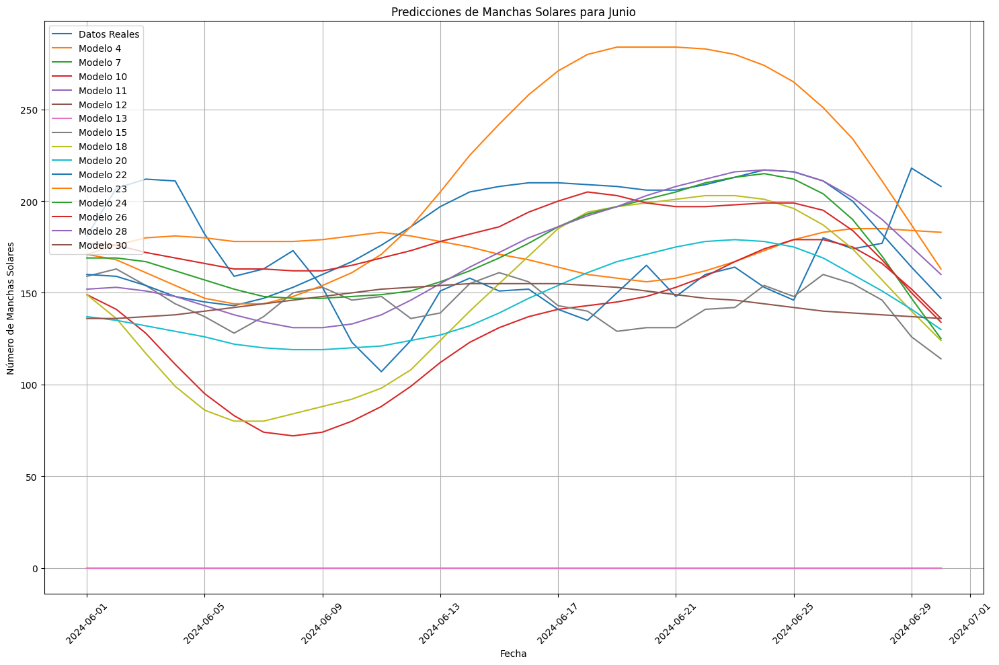

In [ ]:
import matplotlib.pyplot as plt

# Lista de DataFrames y nombres para las leyendas, incluyendo los datos reales
dataframes = [df_junio, df_junio_4, df_junio_7, df_junio_10, df_junio_11, df_junio_12, df_junio_13, df_junio_15, df_junio_18, df_junio_20, df_junio_22, df_junio_23, df_junio_24, df_junio_26, df_junio_28, df_junio_30]
nombres = ['Datos Reales', 'Modelo 4', 'Modelo 7', 'Modelo 10', 'Modelo 11', 'Modelo 12', 'Modelo 13', 'Modelo 15', 'Modelo 18', 'Modelo 20', 'Modelo 22', 'Modelo 23', 'Modelo 24', 'Modelo 26', 'Modelo 28', 'Modelo 30']

# Crear una figura y un eje
plt.figure(figsize=(15, 10))

# Graficar los primeros 30 datos de cada DataFrame
for df, nombre in zip(dataframes, nombres):
    plt.plot(df.index[:30], df.iloc[:30, 0], label=nombre)

# Añadir títulos y etiquetas
plt.title('Predicciones de Manchas Solares para Junio')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)

# Mostrar la gráfica
plt.tight_layout()
plt.show()


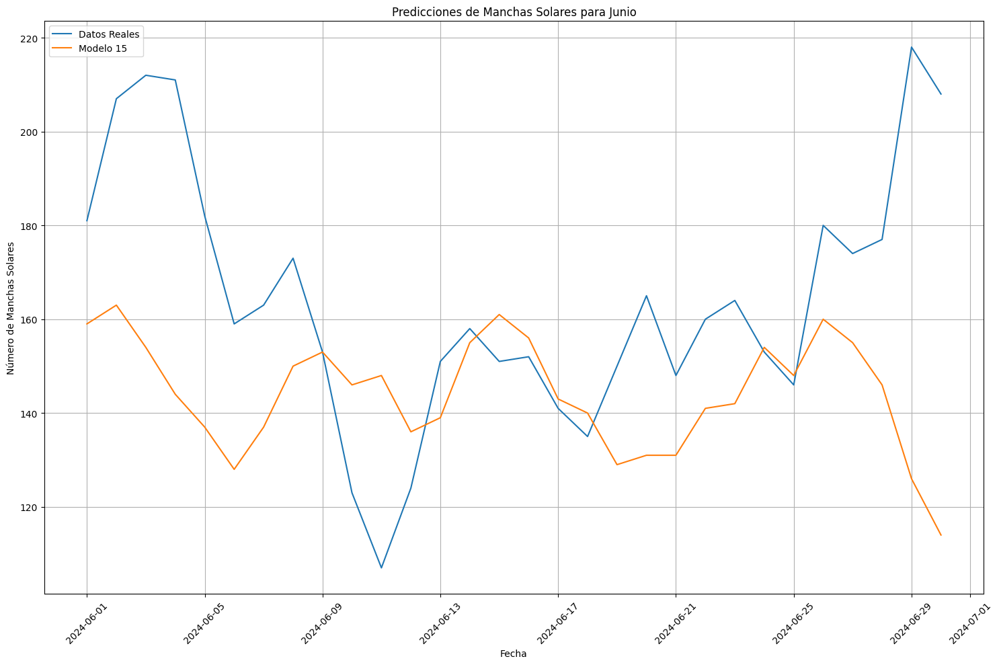

In [ ]:
import matplotlib.pyplot as plt

# Lista de DataFrames y nombres para las leyendas, incluyendo solo los modelos seleccionados
dataframes = [df_junio, df_junio_15]
nombres = ['Datos Reales', 'Modelo 15']

# Crear una figura y un eje
plt.figure(figsize=(15, 10))

# Graficar los primeros 30 datos de cada DataFrame
for df, nombre in zip(dataframes, nombres):
    plt.plot(df.index[:30], df.iloc[:30, 0], label=nombre)

# Añadir títulos y etiquetas
plt.title('Predicciones de Manchas Solares para Junio')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)

# Mostrar la gráfica
plt.tight_layout()
plt.show()



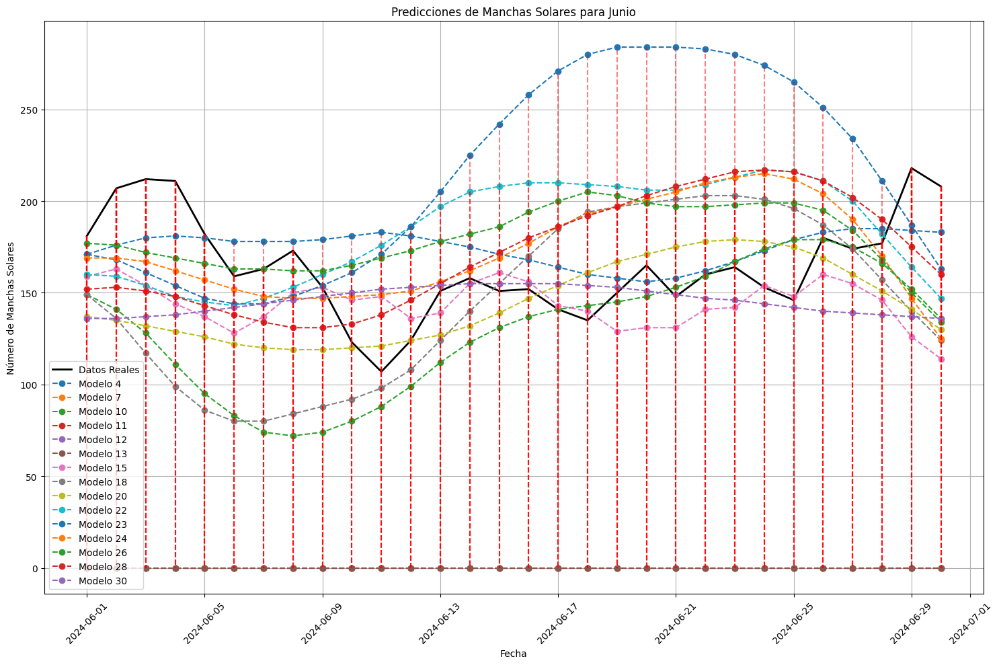

In [ ]:


# Lista de DataFrames y nombres para las leyendas, incluyendo los datos reales
dataframes = [df_junio, df_junio_4, df_junio_7, df_junio_10, df_junio_11, df_junio_12, df_junio_13, df_junio_15, df_junio_18, df_junio_20, df_junio_22, df_junio_23, df_junio_24, df_junio_26, df_junio_28, df_junio_30]
nombres = ['Datos Reales', 'Modelo 4', 'Modelo 7', 'Modelo 10', 'Modelo 11', 'Modelo 12', 'Modelo 13', 'Modelo 15', 'Modelo 18', 'Modelo 20', 'Modelo 22', 'Modelo 23', 'Modelo 24', 'Modelo 26', 'Modelo 28', 'Modelo 30']

# Crear una figura y un eje
plt.figure(figsize=(15, 10))

# Graficar los primeros 30 datos de cada DataFrame
for df, nombre in zip(dataframes, nombres):
    if nombre == 'Datos Reales':
        plt.plot(df.index[:30], df.iloc[:30, 0], label=nombre, color='black', linewidth=2)
    else:
        plt.plot(df.index[:30], df.iloc[:30, 0], linestyle='--', marker='o', label=nombre)

# Añadir líneas verticales desde los datos reales a cada predicción
for i in range(30):
    real_value = df_junio.iloc[i, 0]
    date = df_junio.index[i]
    for df in dataframes[1:]:
        pred_value = df.iloc[i, 0]
        plt.plot([date, date], [real_value, pred_value], 'r--', alpha=0.5)

# Añadir títulos y etiquetas
plt.title('Predicciones de Manchas Solares para Junio')
plt.xlabel('Fecha')
plt.ylabel('Número de Manchas Solares')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)

# Mostrar la gráfica
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
from sklearn.metrics import mean_absolute_error
import numpy as np

# Función para calcular el MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Lista de DataFrames y nombres para las leyendas, incluyendo los datos reales
dataframes = [df_junio_4, df_junio_7, df_junio_10, df_junio_11, df_junio_12, df_junio_13, df_junio_15, df_junio_18, df_junio_20, df_junio_22, df_junio_23, df_junio_24, df_junio_26, df_junio_28, df_junio_30]
nombres = ['Modelo 4', 'Modelo 7', 'Modelo 10', 'Modelo 11', 'Modelo 12', 'Modelo 13', 'Modelo 15', 'Modelo 18', 'Modelo 20', 'Modelo 22', 'Modelo 23', 'Modelo 24', 'Modelo 26', 'Modelo 28', 'Modelo 30']

# Calcular MAE, MAPE, precisión y contar valores correctos para cada modelo
mae_scores = {}
mape_scores = {}
accuracy_scores = {}
correct_predictions_count = {}
correct_dates = {}

for df, nombre in zip(dataframes, nombres):
    # Calcular MAE
    mae = mean_absolute_error(df_junio.iloc[:30, 0], df.iloc[:30, 0])
    mae_scores[nombre] = mae

    # Calcular MAPE
    mape = mean_absolute_percentage_error(df_junio.iloc[:30, 0], df.iloc[:30, 0])
    mape_scores[nombre] = mape

    # Calcular precisión
    accuracy = 100 - mape
    accuracy_scores[nombre] = accuracy

    # Contar valores correctos
    correct_predictions = np.round(df.iloc[:30, 0]) == np.round(df_junio.iloc[:30, 0])
    correct_count = np.sum(correct_predictions)
    correct_predictions_count[nombre] = correct_count

    if correct_count > 0:
        # Almacenar las fechas y valores correctos
        correct_dates[nombre] = df_junio.index[:30][correct_predictions].strftime('%Y-%m-%d').tolist()
        correct_values = df_junio.iloc[:30, 0][correct_predictions].tolist()

# Mostrar resultados
print("MAE de cada modelo:")
for nombre, mae in mae_scores.items():
    print(f"{nombre}: MAE = {mae:.4f}")

print("\nMAPE de cada modelo:")
for nombre, mape in mape_scores.items():
    print(f"{nombre}: MAPE = {mape:.2f}%")

print("\nPorcentaje de acierto de cada modelo:")
for nombre, accuracy in accuracy_scores.items():
    print(f"{nombre}: Precisión = {accuracy:.2f}%")

print("\nNúmero de valores correctos de cada modelo:")
for nombre, correct_count in correct_predictions_count.items():
    print(f"{nombre}: Valores correctos = {correct_count}")

print("\nModelos con al menos un valor correcto y las fechas correspondientes:")
for nombre, dates in correct_dates.items():
    print(f"\n{nombre} acertó en las siguientes fechas:")
    for date in dates:
        value = df_junio.loc[date].values[0]  # Obtener el valor de manchas solares en esa fecha
        print(f"  - {date}: {value} manchas solares")

# Encontrar el mejor modelo basado en MAE y MAPE
mejor_modelo_mae = min(mae_scores, key=mae_scores.get)
mejor_modelo_mape = min(mape_scores, key=mape_scores.get)

print(f"\nEl modelo con el MAE más bajo es {mejor_modelo_mae} con un MAE de {mae_scores[mejor_modelo_mae]:.4f}")
print(f"El modelo con el MAPE más bajo es {mejor_modelo_mape} con un MAPE de {mape_scores[mejor_modelo_mape]:.2f}%")



MAE de cada modelo:
Modelo 4: MAE = 21.8333
Modelo 7: MAE = 164.2000
Modelo 10: MAE = 38.4667
Modelo 11: MAE = 164.2000
Modelo 12: MAE = 164.2000
Modelo 13: MAE = 164.2000
Modelo 15: MAE = 26.6667
Modelo 18: MAE = 48.3667
Modelo 20: MAE = 32.2667
Modelo 22: MAE = 45.9333
Modelo 23: MAE = 70.6000
Modelo 24: MAE = 34.6667
Modelo 26: MAE = 34.9667
Modelo 28: MAE = 37.6667
Modelo 30: MAE = 28.3333

MAPE de cada modelo:
Modelo 4: MAPE = 14.66%
Modelo 7: MAPE = 100.00%
Modelo 10: MAPE = 22.49%
Modelo 11: MAPE = 100.00%
Modelo 12: MAPE = 100.00%
Modelo 13: MAPE = 100.00%
Modelo 15: MAPE = 15.24%
Modelo 18: MAPE = 28.59%
Modelo 20: MAPE = 18.29%
Modelo 22: MAPE = 29.35%
Modelo 23: MAPE = 45.66%
Modelo 24: MAPE = 21.45%
Modelo 26: MAPE = 22.46%
Modelo 28: MAPE = 23.06%
Modelo 30: MAPE = 16.28%

Porcentaje de acierto de cada modelo:
Modelo 4: Precisión = 85.34%
Modelo 7: Precisión = 0.00%
Modelo 10: Precisión = 77.51%
Modelo 11: Precisión = 0.00%
Modelo 12: Precisión = 0.00%
Modelo 13: Precisión

In [ ]:
from sklearn.metrics import mean_absolute_error

# Lista de DataFrames y nombres para las leyendas, incluyendo los datos reales
dataframes = [df_junio_4, df_junio_7, df_junio_10, df_junio_11, df_junio_12, df_junio_13, df_junio_15, df_junio_18, df_junio_20, df_junio_22, df_junio_23, df_junio_24, df_junio_26, df_junio_28, df_junio_30]
nombres = ['Modelo 4', 'Modelo 7', 'Modelo 10', 'Modelo 11', 'Modelo 12', 'Modelo 13', 'Modelo 15', 'Modelo 18', 'Modelo 20', 'Modelo 22', 'Modelo 23', 'Modelo 24', 'Modelo 26', 'Modelo 28', 'Modelo 30']

# Calcular el MAE para cada modelo
mae_scores = {}
for df, nombre in zip(dataframes, nombres):
    mae = mean_absolute_error(df_junio.iloc[:30, 0], df.iloc[:30, 0])
    mae_scores[nombre] = mae

# Mostrar los resultados
for nombre, mae in mae_scores.items():
    print(f"{nombre}: MAE = {mae}")

# Encontrar el modelo con el MAE más bajo
mejor_modelo = min(mae_scores, key=mae_scores.get)
print(f"\nEl modelo con las predicciones más cercanas a los datos reales es {mejor_modelo} con un MAE de {mae_scores[mejor_modelo]}")


Modelo 4: MAE = 21.833333333333332
Modelo 7: MAE = 164.2
Modelo 10: MAE = 38.46666666666667
Modelo 11: MAE = 164.2
Modelo 12: MAE = 164.2
Modelo 13: MAE = 164.2
Modelo 15: MAE = 26.666666666666668
Modelo 18: MAE = 48.36666666666667
Modelo 20: MAE = 32.266666666666666
Modelo 22: MAE = 45.93333333333333
Modelo 23: MAE = 70.6
Modelo 24: MAE = 34.666666666666664
Modelo 26: MAE = 34.96666666666667
Modelo 28: MAE = 37.666666666666664
Modelo 30: MAE = 28.333333333333332

El modelo con las predicciones más cercanas a los datos reales es Modelo 4 con un MAE de 21.833333333333332


In [ ]:
import pandas as pd
from sklearn.metrics import mean_absolute_error
import numpy as np

# Función para calcular el MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Lista de DataFrames y nombres para las leyendas, incluyendo los datos reales
dataframes = [df_junio_4, df_junio_7, df_junio_10, df_junio_11, df_junio_12, df_junio_13, df_junio_15, df_junio_18, df_junio_20, df_junio_22, df_junio_23, df_junio_24, df_junio_26, df_junio_28, df_junio_30]
nombres = ['Modelo 4', 'Modelo 7', 'Modelo 10', 'Modelo 11', 'Modelo 12', 'Modelo 13', 'Modelo 15', 'Modelo 18', 'Modelo 20', 'Modelo 22', 'Modelo 23', 'Modelo 24', 'Modelo 26', 'Modelo 28', 'Modelo 30']

# Calcular el MAPE para cada modelo
mape_scores = {}
for df, nombre in zip(dataframes, nombres):
    mape = mean_absolute_percentage_error(df_junio.iloc[:30, 0], df.iloc[:30, 0])
    mape_scores[nombre] = mape

# Mostrar los resultados
for nombre, mape in mape_scores.items():
    print(f"{nombre}: MAPE = {mape:.2f}%")

# Encontrar el modelo con el MAPE más bajo
mejor_modelo = min(mape_scores, key=mape_scores.get)
print(f"\nEl modelo con las predicciones más cercanas a los datos reales es {mejor_modelo} con un MAPE de {mape_scores[mejor_modelo]:.2f}%")

# Calcular el porcentaje de acierto (100 - MAPE) para cada modelo
accuracy_scores = {nombre: 100 - mape for nombre, mape in mape_scores.items()}

# Mostrar el porcentaje de acierto
for nombre, accuracy in accuracy_scores.items():
    print(f"{nombre}: Precisión = {accuracy:.2f}%")


Modelo 4: MAPE = 14.66%
Modelo 7: MAPE = 100.00%
Modelo 10: MAPE = 22.49%
Modelo 11: MAPE = 100.00%
Modelo 12: MAPE = 100.00%
Modelo 13: MAPE = 100.00%
Modelo 15: MAPE = 15.24%
Modelo 18: MAPE = 28.59%
Modelo 20: MAPE = 18.29%
Modelo 22: MAPE = 29.35%
Modelo 23: MAPE = 45.66%
Modelo 24: MAPE = 21.45%
Modelo 26: MAPE = 22.46%
Modelo 28: MAPE = 23.06%
Modelo 30: MAPE = 16.28%

El modelo con las predicciones más cercanas a los datos reales es Modelo 4 con un MAPE de 14.66%
Modelo 4: Precisión = 85.34%
Modelo 7: Precisión = 0.00%
Modelo 10: Precisión = 77.51%
Modelo 11: Precisión = 0.00%
Modelo 12: Precisión = 0.00%
Modelo 13: Precisión = 0.00%
Modelo 15: Precisión = 84.76%
Modelo 18: Precisión = 71.41%
Modelo 20: Precisión = 81.71%
Modelo 22: Precisión = 70.65%
Modelo 23: Precisión = 54.34%
Modelo 24: Precisión = 78.55%
Modelo 26: Precisión = 77.54%
Modelo 28: Precisión = 76.94%
Modelo 30: Precisión = 83.72%


#Conclusión

Los modelos 15, 26, 28 y 30 fueron los más precisos. Aunque requieren mejoras y acceso a GPUs potentes como la A100, ofrecen ventajas en términos de tiempo de entrenamiento y precisión, completándose en pocas horas.

En contraste, otros modelos demandan mayor poder computacional y tiempos de entrenamiento prolongados. Creemos que es posible mejorar la precisión por encima del 90%, lo que permitiría no solo predecir el número de manchas solares, sino también caracterizar su forma y tamaño. Estas características son clave, ya que influyen en fenómenos astrofísicos y la actividad solar.